In [102]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
font = {'family' : 'serif',
#        'weight' : 'bold',
        'size'   : 16,}
matplotlib.rc('font', **font)

import os
import h5py



from astropy.io import fits
import time
from tqdm import tqdm
import yaml
import scipy
from scipy.special import erf
import scipy.stats as stats
import scipy.signal as signal
from scipy.optimize import curve_fit,minimize
from datetime import datetime,timedelta
import corner
import importlib

import fit_time_dep_fluxes as fit_flux




In [103]:
plotpath = './figures/'
if not os.path.isdir(plotpath):
    os.makedirs(plotpath)


In [290]:
tele = 'apo'
ftype = 'object'

expid = "0029"
chip = "R"
mjd = 60992

expid = "0066"
chip = "R"
mjd = 60992

# expid = "0032"
# chip = "R"
# mjd = 60989

# expid = "0014"
# chip = "R"
# mjd = 60988

# expid = "0065"
# chip = "R"
# mjd = 60781

# expid = "0041"
# chip = "R"
# mjd = 60786

datapath = '/Users/kevinm/Downloads/sdss_raw_fluxes/'

fname_1d = f'{datapath}ar1Dcal_{tele}_{mjd}_{expid}_{chip}_{ftype}.h5'
data_1d = h5py.File(fname_1d)
print(data_1d.keys())

fiber_types = np.array(data_1d['fiberTypeList']).astype(str)
fiber_flux_1ds = np.array(data_1d['flux_1d'])
fiber_med_fluxes = np.nanmedian(fiber_flux_1ds,axis=1)
fiber_trace_centers = np.array(data_1d['extract_trace_centers'])-1 #subtract 1 because indices are from Julia

data_1d.close()

<KeysViewHDF5 ['bitmsk_relthrpt', 'dropped_pixels_mask_1d', 'extract_trace_centers', 'fiberTypeList', 'flux_1d', 'ivar_1d', 'mask_1d', 'metadata', 'relthrpt', 'trace_used_param_fname']>


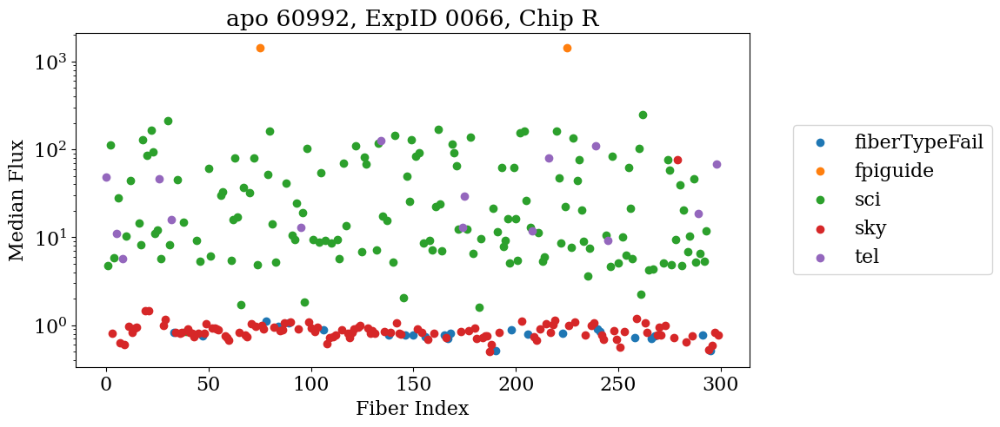

In [291]:
fiber_inds = np.arange(fiber_med_fluxes.shape[0])

unique_fiber_types = np.unique(fiber_types)

plt.figure(figsize=(10,5))
plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}')
for fib_type in unique_fiber_types:
    curr_keep = (fiber_types == fib_type)
    plt.scatter(fiber_inds[curr_keep],fiber_med_fluxes[curr_keep],label=fib_type)
plt.legend(loc=6,bbox_to_anchor=(1.05,0.5))
plt.gca().set_yscale('log')
plt.xlabel('Fiber Index')
plt.ylabel('Median Flux')
plt.show()

Current fiber index: 262
Current fiber type: sci
Current fiber median flux: 246.81


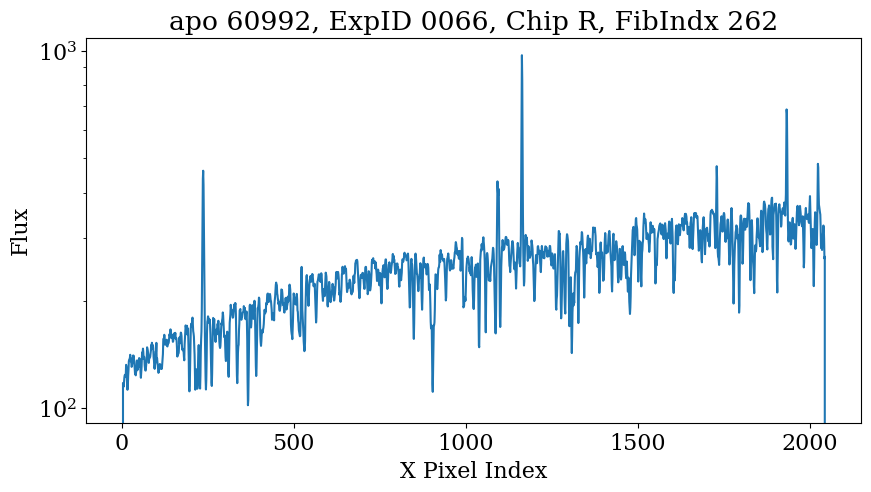

In [292]:
#sort the sci and tel fibers by median flux (decreasing from max)
use_types = ((fiber_types == 'sci') | (fiber_types == 'tel'))
# use_types = use_types & (fiber_med_fluxes < 1000)
# use_types = ((fiber_types == 'sky'))
good_explore_inds = np.where(use_types)[0][np.argsort(fiber_med_fluxes[use_types])[::-1]]
chosen_fib_ind = good_explore_inds[0]
# chosen_fib_ind = good_explore_inds[2]

print(f'Current fiber index: {chosen_fib_ind}')
print(f'Current fiber type: {fiber_types[chosen_fib_ind]}')
print(f'Current fiber median flux: {round(fiber_med_fluxes[chosen_fib_ind],2)}')


x_inds = np.arange(fiber_flux_1ds.shape[1])
plt.figure(figsize=(10,5))
plt.gca().set_yscale('log')
plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
plt.plot(x_inds,fiber_flux_1ds[chosen_fib_ind])
plt.xlabel('X Pixel Index')
plt.ylabel('Flux')
plt.show()


In [293]:
fname_3d = f'{datapath}ar3Dcal_{tele}_{mjd}_{expid}_{chip}_{ftype}.h5'
data_3d = h5py.File(fname_3d)
print(data_3d.keys())

mjd_mid_exposure = np.array(data_3d['metadata']['mjd_mid_exposure_precise'])

chosen_trace_inds = np.round(fiber_trace_centers[chosen_fib_ind]).astype(int)

pixel_best_fit_fluxes = np.array(data_3d['dimage'])[chosen_trace_inds,x_inds]
pixel_best_fit_ivars = np.array(data_3d['ivarimage'])[chosen_trace_inds,x_inds]
pixel_chisqimage = np.array(data_3d['chisqimage'])[chosen_trace_inds,x_inds]
pixel_gainMat = np.array(data_3d['gainMat'])[chosen_trace_inds,x_inds]
pixel_readVarMat = np.array(data_3d['readVarMat'])[chosen_trace_inds,x_inds] #(DN/read)^2
pixel_raw_data = np.array(data_3d['outdat'])[:,chosen_trace_inds,x_inds]


<KeysViewHDF5 ['CRimage', 'amp_off_vec', 'chisqimage', 'dimage', 'gainMat', 'ivarimage', 'last_unsaturated', 'metadata', 'outdat', 'readVarMat', 'ref_zpt_out', 'sci_zpt_out']>


In [294]:
pixel_best_fit_fluxes.shape

(2048,)

In [295]:
n_repeat = 2
med_cont = np.zeros_like(pixel_best_fit_fluxes)
med_window = 30 #number of pixels for smoothing

keep_pixels = np.isfinite(pixel_best_fit_fluxes)

for r_ind in range(n_repeat):
    for j in range(len(x_inds)):
        nearby_inds = np.where(keep_pixels & (np.abs(x_inds-x_inds[j]) < med_window))[0]
        med_cont[j] = np.nanmedian(pixel_best_fit_fluxes[nearby_inds])
    cont_resids = (pixel_best_fit_fluxes - med_cont)
    cont_resid_sigmas = cont_resids*np.sqrt(pixel_best_fit_ivars)
    
    # good_resids = (cont_resid_sigmas >= -100) & (cont_resid_sigmas <= 10)
    good_resids = (cont_resid_sigmas >= -10) & (cont_resid_sigmas <= 10)
    if np.all(good_resids == keep_pixels):
        break
    keep_pixels = good_resids


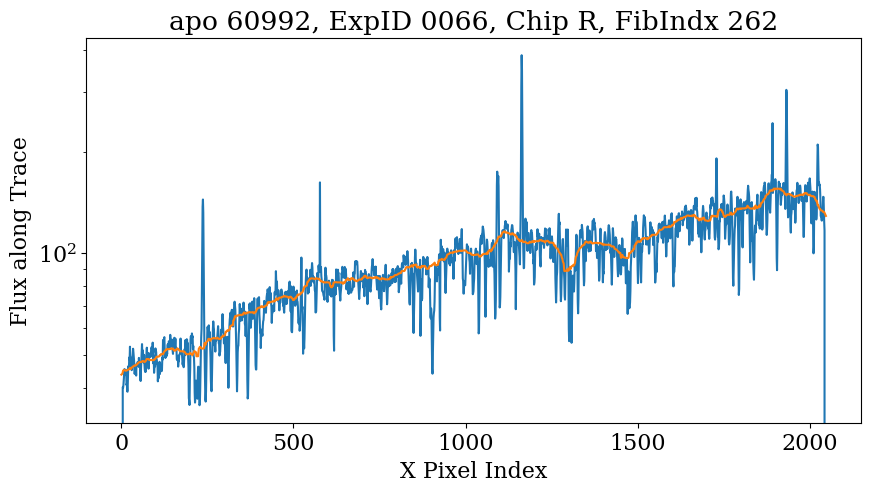

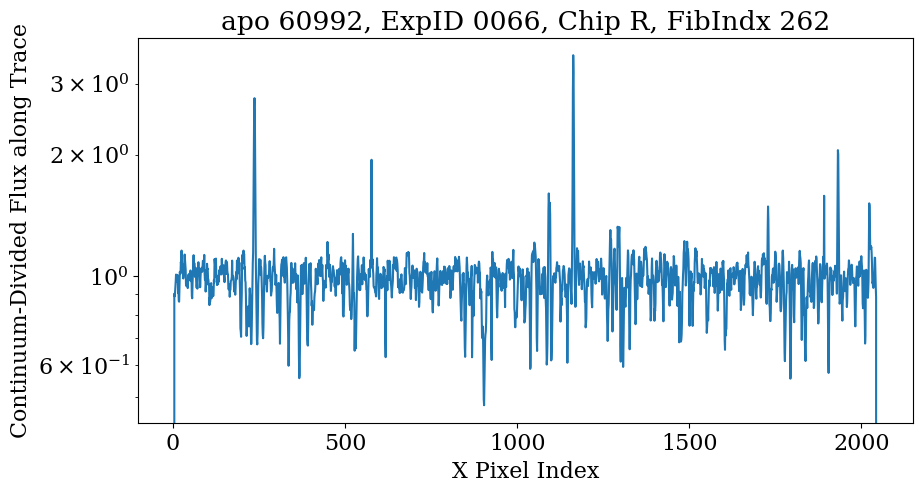

In [296]:
plt.figure(figsize=(10,5))
plt.gca().set_yscale('log')
plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
plt.plot(x_inds,pixel_best_fit_fluxes)
plt.plot(x_inds,med_cont)
plt.xlabel('X Pixel Index')
plt.ylabel('Flux along Trace')
plt.show()

plt.figure(figsize=(10,5))
plt.gca().set_yscale('log')
plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
plt.plot(x_inds,pixel_best_fit_fluxes/med_cont)
plt.xlabel('X Pixel Index')
plt.ylabel('Continuum-Divided Flux along Trace')
plt.show()


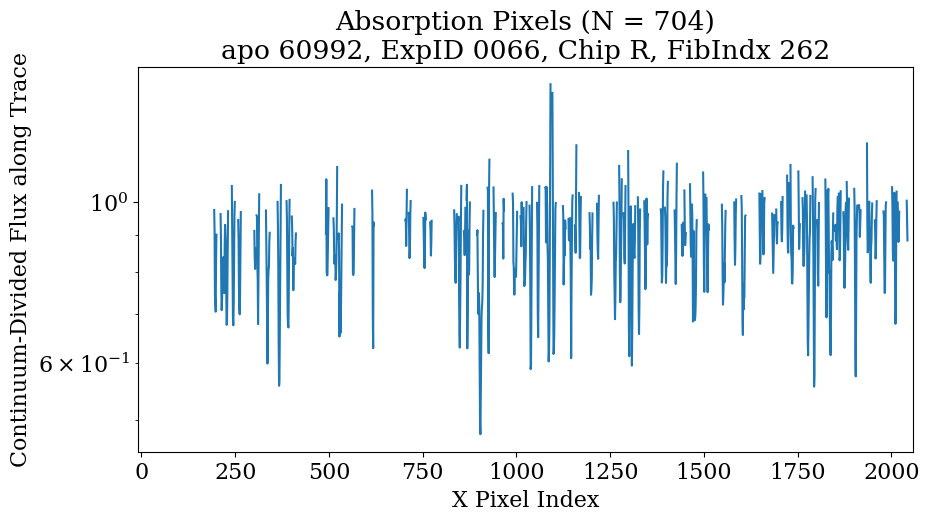

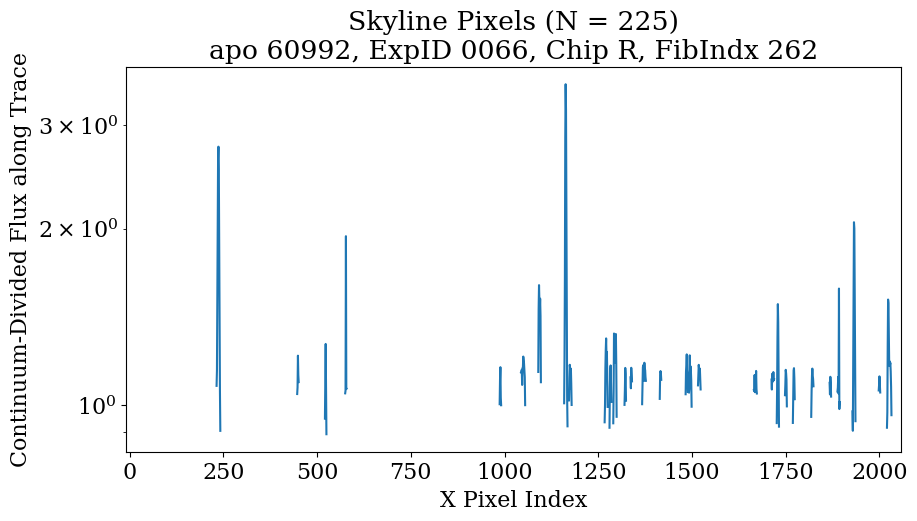

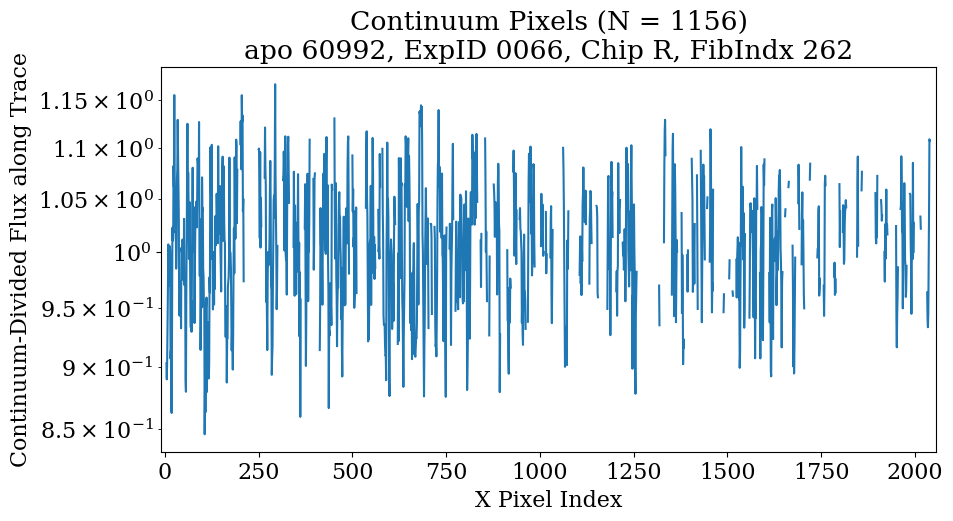

In [297]:
good_pix_data = np.all(np.isfinite(pixel_raw_data),axis=0) & np.isfinite(pixel_gainMat) & np.isfinite(pixel_readVarMat)\
                 & (pixel_best_fit_ivars > 0)

absorption_pixels = (cont_resid_sigmas < -10) & (pixel_best_fit_fluxes/med_cont < 0.95) & good_pix_data
for pix_ind in np.where(absorption_pixels)[0]:
    absorption_pixels[np.abs(x_inds-pix_ind) < 3] = True
absorption_pixels = absorption_pixels & np.isfinite(pixel_best_fit_fluxes) & good_pix_data
skyline_pixels = (cont_resid_sigmas > 10) & (~absorption_pixels) & (pixel_best_fit_fluxes/med_cont > 1.05) & good_pix_data
for pix_ind in np.where(skyline_pixels)[0]:
    skyline_pixels[np.abs(x_inds-pix_ind) < 3] = True
skyline_pixels = skyline_pixels & np.isfinite(pixel_best_fit_fluxes) & good_pix_data

continuum_pixels = np.isfinite(pixel_best_fit_fluxes) & (~absorption_pixels) & (~skyline_pixels) & good_pix_data


absorption_plot_flux = np.zeros(len(pixel_best_fit_fluxes))*np.nan
absorption_plot_flux[absorption_pixels] = (pixel_best_fit_fluxes/med_cont)[absorption_pixels]
skyline_plot_flux = np.zeros(len(pixel_best_fit_fluxes))*np.nan
skyline_plot_flux[skyline_pixels] = (pixel_best_fit_fluxes/med_cont)[skyline_pixels]
continuum_plot_flux = np.zeros(len(pixel_best_fit_fluxes))*np.nan
continuum_plot_flux[continuum_pixels] = (pixel_best_fit_fluxes/med_cont)[continuum_pixels]

plt.figure(figsize=(10,5))
plt.gca().set_yscale('log')
plt.title(f'Absorption Pixels (N = {np.sum(absorption_pixels)})\n{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
plt.plot(x_inds,absorption_plot_flux)
plt.xlabel('X Pixel Index')
plt.ylabel('Continuum-Divided Flux along Trace')
plt.xlim(x_inds[0]-10,x_inds[-1]+10)
plt.show()

plt.figure(figsize=(10,5))
plt.gca().set_yscale('log')
plt.title(f'Skyline Pixels (N = {np.sum(skyline_pixels)})\n{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
plt.plot(x_inds,skyline_plot_flux)
plt.xlabel('X Pixel Index')
plt.ylabel('Continuum-Divided Flux along Trace')
plt.xlim(x_inds[0]-10,x_inds[-1]+10)
plt.show()

plt.figure(figsize=(10,5))
plt.gca().set_yscale('log')
plt.title(f'Continuum Pixels (N = {np.sum(continuum_pixels)})\n{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
plt.plot(x_inds,continuum_plot_flux)
plt.xlabel('X Pixel Index')
plt.ylabel('Continuum-Divided Flux along Trace')
plt.xlim(x_inds[0]-10,x_inds[-1]+10)
plt.show()


In [298]:
np.where(skyline_pixels)[0]

array([ 232,  233,  234,  235,  236,  237,  238,  239,  240,  241,  242,
        447,  448,  449,  450,  451,  521,  522,  523,  524,  525,  575,
        576,  577,  578,  579,  987,  988,  989,  990,  991, 1044, 1045,
       1046, 1047, 1048, 1049, 1050, 1051, 1052, 1053, 1054, 1055, 1090,
       1091, 1092, 1093, 1094, 1095, 1096, 1097, 1159, 1160, 1161, 1162,
       1163, 1164, 1165, 1166, 1167, 1168, 1172, 1173, 1174, 1175, 1176,
       1177, 1178, 1179, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274,
       1275, 1280, 1281, 1282, 1283, 1284, 1285, 1290, 1291, 1292, 1293,
       1294, 1295, 1296, 1297, 1298, 1299, 1320, 1321, 1322, 1323, 1324,
       1336, 1337, 1338, 1339, 1340, 1367, 1368, 1369, 1370, 1371, 1372,
       1373, 1374, 1375, 1376, 1377, 1414, 1415, 1416, 1417, 1418, 1483,
       1484, 1485, 1486, 1487, 1488, 1489, 1492, 1493, 1494, 1495, 1496,
       1497, 1498, 1499, 1516, 1517, 1518, 1519, 1520, 1521, 1522, 1523,
       1665, 1666, 1667, 1668, 1669, 1670, 1671, 16

In [299]:
use_pixel_inds = np.where(absorption_pixels)[0]
use_pixel_inds = np.where(continuum_pixels)[0]
use_pixel_inds = np.where(skyline_pixels)[0]

data_per_pix = pixel_raw_data.T * pixel_gainMat[:,None] #convert to electrons
read_error_per_pix = np.sqrt(pixel_readVarMat) * pixel_gainMat #convert to electrons
n_reads = data_3d['outdat'].shape[0]


np.random.seed(123)
use_pixels = np.random.choice(np.where(continuum_pixels)[0],100,replace=False)
# use_pixels = np.where(continuum_pixels)[0]

n_pixels = len(use_pixels)
data_cube = data_per_pix[use_pixels]

count_diffs = np.diff(data_cube,axis=1)


obs_fluxes = np.copy(data_cube)
read_errs = read_error_per_pix[use_pixels]

read_vars = np.power(read_errs,2)

obs_flux_diffs = np.diff(obs_fluxes,axis=1)
min_b_val = 1e-10
min_f_val = 1e-10
b_vect_guess,fmax_guess,max_b_ind = fit_flux.first_guess_parameters(obs_flux_diffs,read_vars,
                                       min_b_val=min_b_val,min_f_val=min_f_val)



In [300]:
n_pixels

100

In [301]:
fmax_guess

array([259.29687341, 498.72104403, 208.80533117, 401.98651249,
       262.13062996, 190.24906341, 289.32044056, 449.30192265,
       316.76883149, 378.79970282, 197.04688508, 242.28739614,
       358.57625175, 461.30790171, 349.19875864, 281.81297088,
       263.40138333, 453.98209051, 413.62547974, 340.60051457,
       197.08668801, 156.63353257, 226.98810932, 222.52837181,
       323.44309345, 465.86370285, 362.48194185, 348.08108409,
       397.00838452, 415.04503085, 304.78618895, 163.57369913,
       441.65405788, 284.31233669, 323.9923425 , 355.3237566 ,
       323.66419633, 273.8227262 , 304.89005496, 451.12970844,
       359.87116533, 293.08172486, 204.70086725, 280.92838842,
       223.49011568, 425.03345503, 336.70965404, 349.43623961,
       183.34435681, 461.17290397, 592.66629224, 175.39055426,
       514.53833868, 180.45459975, 192.13781285, 353.52422037,
       177.17340333, 366.23096967, 317.08757972, 131.71921446,
       511.79413073, 360.81591115, 342.54993363, 389.21

In [302]:
b_vect_guess

array([0.1506239 , 0.14922661, 0.1730758 , 0.21880334, 0.17267975,
       0.13117742, 0.187963  , 0.16967666, 0.2035766 , 0.15170729,
       0.16933555, 0.22550704, 0.14741107, 0.16971482, 0.22556108,
       0.3388098 , 0.49808001, 0.55659882, 0.628286  , 0.86656511,
       0.82260897, 1.        , 0.91136864, 0.56527964, 0.69410334,
       0.6190252 , 0.63992319, 0.78675255, 0.81118895, 0.85451968,
       0.98795604, 0.87325118, 0.85490688, 0.8600704 , 0.92752704])

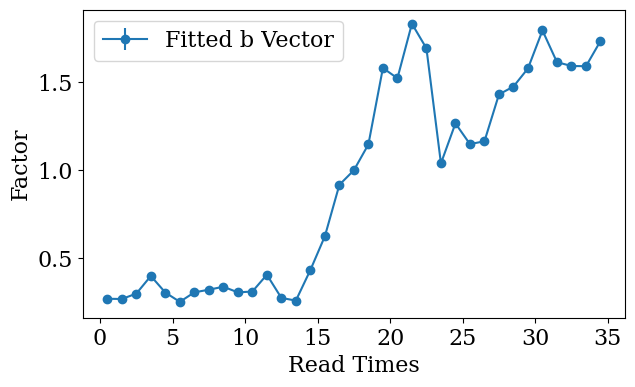

In [303]:
use_pixel_inds = np.where(absorption_pixels)[0]
use_pixel_inds = np.where(continuum_pixels)[0]
# use_pixel_inds = np.where(skyline_pixels)[0]

data_per_pix = pixel_raw_data.T * pixel_gainMat[:,None] #convert to electrons
read_error_per_pix = np.sqrt(pixel_readVarMat) * pixel_gainMat #convert to electrons
n_reads = data_3d['outdat'].shape[0]


# np.random.seed(123)
use_pixels = use_pixel_inds
# use_pixels = np.random.choice(use_pixel_inds,100,replace=False)
use_pixels = np.random.choice(use_pixel_inds,100,replace=False)

n_pixels = len(use_pixels)
data_cube = data_per_pix[use_pixels]

count_diffs = np.diff(data_cube,axis=1)


obs_fluxes = np.copy(data_cube)
read_errs = read_error_per_pix[use_pixels]


max_b_ind,b_vect_mean,b_vect_Vinv,b_vect_V,\
        f_max_means_given_b,f_max_ivars_given_b,\
        comb_param_means,comb_param_Vinv,comb_param_V = fit_flux.measure_time_dep_fluxes_LINEAR(obs_fluxes,read_errs,
                                                       n_max_repeat=20,b_vect_change_tol=1e-10,f_max_change_tol=1e-10,
                                                       min_b_val=1e-10,min_f_val=1e-10)

f_means_no_b,f_ivars_no_b,chi2s_data_no_b = fit_flux.fit_fluxes_optimal(obs_fluxes,read_errs,
                                                                           n_repeat=2,b_vect=None)
f_means_with_b,f_ivars_with_b,chi2s_data_with_b = fit_flux.fit_fluxes_optimal(obs_fluxes,read_errs,
                                                                           n_repeat=2,b_vect=b_vect_mean)

non_max_inds = np.ones(len(b_vect_mean)).astype(bool)
non_max_inds[max_b_ind] = False
non_max_inds = np.where(non_max_inds)[0]

b_vect_errs = np.sqrt(np.diag(b_vect_V))
f_max_errs_given_b = np.power(f_max_ivars_given_b,-0.5)

b_vect_mean_linear = np.copy(b_vect_mean)
b_vect_errs_linear = np.copy(b_vect_errs)
b_vect_cov_linear = np.copy(b_vect_V)
f_max_means = comb_param_means[:n_pixels]


#rescaling average
 
f_max_post = np.copy(f_max_means)
b_vect_post = np.copy(b_vect_mean_linear)
b_vect_post_cov = np.copy(b_vect_cov_linear)
curr_f_post_guess = f_max_post[:, None] * b_vect_post[None, :]
read_times = np.arange(n_reads)
obs_flux_diffs = np.diff(obs_fluxes,axis=1)
read_vars = np.power(read_errs,2)

plt.figure(figsize=(7, 4))
plt.errorbar(read_times[:-1]+0.5,b_vect_post/np.nanmedian(b_vect_post),yerr=np.sqrt(np.diag(b_vect_post_cov/np.nanmedian(b_vect_post))),label= "Fitted b Vector",fmt = "-o")


plt.ylabel("Factor")
plt.xlabel("Read Times")  
plt.legend()
plt.show()



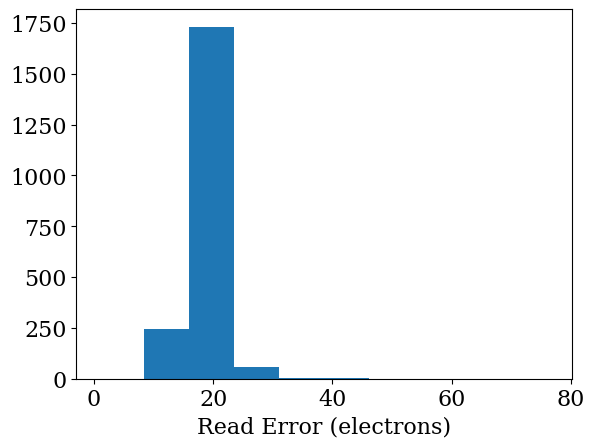

[ 0.80729511 14.38655056 16.42809912 18.86500615 20.98341682 24.0516512
 76.4622846 ]


In [304]:
plt.hist(read_error_per_pix)
plt.xlabel('Read Error (electrons)')
plt.show()

print(np.nanpercentile(read_error_per_pix,[0,2.5,16,50,84,97.5,100]))

In [305]:
b_vect_mean

array([0.14666762, 0.14592743, 0.16262955, 0.21734018, 0.16590932,
       0.13708185, 0.1665485 , 0.17474143, 0.18394854, 0.16649314,
       0.16911024, 0.22114851, 0.14922444, 0.14098277, 0.23588645,
       0.34075309, 0.50027251, 0.54541253, 0.62567909, 0.86270902,
       0.83077691, 1.        , 0.92362396, 0.56664442, 0.69072923,
       0.62655106, 0.63524682, 0.78064197, 0.80501947, 0.86131151,
       0.97910498, 0.88065946, 0.86888998, 0.86814432, 0.94637933])

In [306]:
pixel_readVarMat.shape

(2048,)

In [307]:
pixel_gainMat.shape

(2048,)

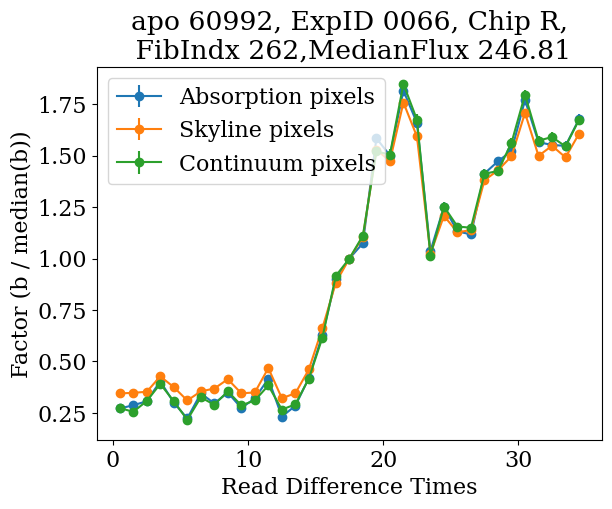

In [308]:


# --- Precompute shared stuff ---
data_per_pix = pixel_raw_data.T * pixel_gainMat[:, None]  # convert to electrons
read_error_per_pix = np.sqrt(pixel_readVarMat) * pixel_gainMat
n_reads = data_3d['outdat'].shape[0]
read_times = np.arange(n_reads)

# Define the three pixel sets
pixel_sets = {
    "Absorption pixels": np.where(absorption_pixels)[0],
    "Skyline pixels":    np.where(skyline_pixels)[0],
    "Continuum pixels":  np.where(continuum_pixels)[0],
}


#plt.figure(figsize=(7, 4))

for label, use_pixel_inds in pixel_sets.items():
    # Skip if this mask is empty
    if len(use_pixel_inds) == 0:
        continue

    if label == "Skyline pixels":
        n_select = 100
    else:
        n_select = 100
        
    # Pick up to 100 random pixels from this set
    # np.random.seed(123)
    use_pixels = np.random.choice(use_pixel_inds, n_select, replace=False)

    n_pixels = len(use_pixels)
    obs_fluxes = data_per_pix[use_pixels]
    read_errs = read_error_per_pix[use_pixels]
    obs_flux_diffs = np.diff(obs_fluxes,axis=1)
    # --- Run fits for this pixel class ---
    max_b_ind, b_vect_mean, b_vect_Vinv, b_vect_V, \
        f_max_means_given_b, f_max_ivars_given_b, \
        comb_param_means, comb_param_Vinv, comb_param_V = \
        fit_flux.measure_time_dep_fluxes_LINEAR(
            obs_fluxes, read_errs,
            n_max_repeat=1000,
            b_vect_change_tol=1e-10,
            min_b_val=1e-10,
            min_f_val=1e-10
        )

    # Posterior summaries
    b_vect_post = np.copy(b_vect_mean)
    b_vect_post_cov = np.copy(b_vect_V)

    # Normalization + error bars
    scale = np.nanmedian(b_vect_post)
    b_norm = b_vect_post / scale
    b_err_norm = np.sqrt(np.diag(b_vect_post_cov)) / scale

    # --- Plot this set on the same axes ---
    plt.errorbar(
        read_times[:-1] + 0.5,
        b_norm,
        yerr=b_err_norm,
        fmt='-o',
        label=label
    )

plt.ylabel("Factor (b / median(b))")
plt.xlabel("Read Difference Times")
plt.legend()
plt.tight_layout()
plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip},\n FibIndx {chosen_fib_ind},MedianFlux {np.round(fiber_med_fluxes[chosen_fib_ind],2)}')
plt.show()


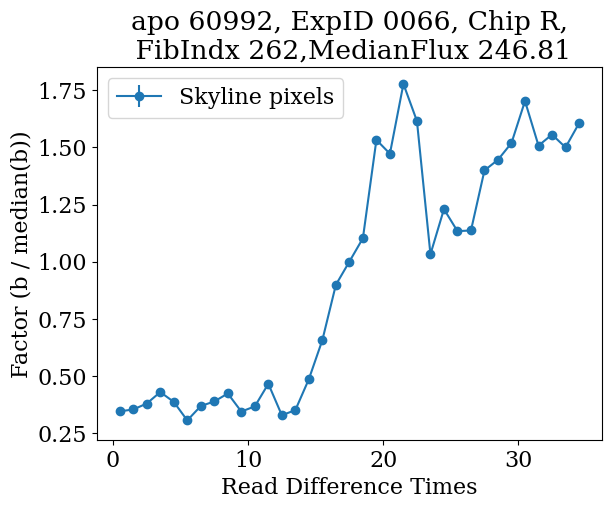

In [309]:


# --- Precompute shared stuff ---
data_per_pix = pixel_raw_data.T * pixel_gainMat[:, None]  # convert to electrons
read_error_per_pix = np.sqrt(pixel_readVarMat) * pixel_gainMat
n_reads = data_3d['outdat'].shape[0]
read_times = np.arange(n_reads)

# Define the three pixel sets
pixel_sets = {
    "Skyline pixels":    np.where(skyline_pixels)[0],
}


#plt.figure(figsize=(7, 4))

for label, use_pixel_inds in pixel_sets.items():
    # Skip if this mask is empty
    if len(use_pixel_inds) == 0:
        continue

    if label == "Skyline pixels":
        n_select = 100
        # n_select = len(np.where(skyline_pixels)[0])
    else:
        n_select = 100
        
    # Pick up to 100 random pixels from this set
    # np.random.seed(123)
    use_pixels = np.random.choice(use_pixel_inds, n_select, replace=False)

    n_pixels = len(use_pixels)
    obs_fluxes = data_per_pix[use_pixels]
    read_errs = read_error_per_pix[use_pixels]
    obs_flux_diffs = np.diff(obs_fluxes,axis=1)
    # --- Run fits for this pixel class ---
    max_b_ind, b_vect_mean, b_vect_Vinv, b_vect_V, \
        f_max_means_given_b, f_max_ivars_given_b, \
        comb_param_means, comb_param_Vinv, comb_param_V = \
        fit_flux.measure_time_dep_fluxes_LINEAR(
            obs_fluxes, read_errs,
            n_max_repeat=1000,
            b_vect_change_tol=1e-10,
            min_b_val=1e-10,
            min_f_val=1e-10
        )

    # Posterior summaries
    b_vect_post = np.copy(b_vect_mean)
    b_vect_post_cov = np.copy(b_vect_V)

    # Normalization + error bars
    scale = np.nanmedian(b_vect_post)
    b_norm = b_vect_post / scale
    b_err_norm = np.sqrt(np.diag(b_vect_post_cov)) / scale

    # --- Plot this set on the same axes ---
    plt.errorbar(
        read_times[:-1] + 0.5,
        b_norm,
        yerr=b_err_norm,
        fmt='-o',
        label=label
    )

plt.ylabel("Factor (b / median(b))")
plt.xlabel("Read Difference Times")
plt.legend()
plt.tight_layout()
plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip},\n FibIndx {chosen_fib_ind},MedianFlux {np.round(fiber_med_fluxes[chosen_fib_ind],2)}')
plt.show()


In [310]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

df = pd.read_parquet("forKevin2.parquet")
df["guideErr"] = np.sqrt(df.deltara**2+df.deltadec**2)
df["aperflux"] = df.aperflux / df.gfaExpTime

# normalize flux for each apExp/source_id
# normalize flux for each apExp/source_id + fwhm flux prediction
dfList = []
for n, g in df.groupby(["mjd", "apExpNum"]): #, "source_id"]):
    g = g.sort_values("gfaDateObs")
    g["dt"] = g.gfaDateObs - np.min(g.gfaDateObs)
    g["dt"] = np.array(g.dt, dtype=int)

    _glist = []
    for n2, g2 in g.groupby("source_id"):
        fluxNorm = np.max(g2.aperflux)
        g2["transpNorm"] = g2.aperflux / fluxNorm
        _glist.append(g2)

    g = pd.concat(_glist)

    fwhmFluxNorm = np.max(g.fpred)
    g["fwhmNorm"] = g.fpred / fwhmFluxNorm

    g = g[["mjd", "apExpNum", "dt", "transpNorm", "fwhm_fit", "guideErr", "gfaBG", "fwhmNorm","gfaDateObs","gfaExpTime"]]
    g = g.groupby("dt").median().reset_index()

    # now calculate transparancy + seeing
    gmax = np.max(g.transpNorm * g.fwhmNorm)
    g["fluxNorm"] = (g.transpNorm * g.fwhmNorm) / gmax
    dfList.append(g)

df = pd.concat(dfList)


In [311]:
df

,dt,mjd,apExpNum,transpNorm,fwhm_fit,guideErr,gfaBG,fwhmNorm,gfaDateObs,gfaExpTime,fluxNorm
0,0,60988.0,54260014.0,0.986270,1.383,0.213340,1.670713,0.878340,5.269365e+09,15.0,0.906151
1,36,60988.0,54260014.0,0.972601,1.305,0.041121,1.466329,0.954427,5.269366e+09,15.0,0.971000
2,73,60988.0,54260014.0,0.964792,1.266,0.072311,1.287277,0.976535,5.269366e+09,15.0,0.985515
3,110,60988.0,54260014.0,0.949148,1.284,0.082268,1.134018,0.964201,5.269366e+09,15.0,0.957290
4,147,60988.0,54260014.0,0.951344,1.311,0.058971,1.000000,0.949458,5.269366e+09,15.0,0.944834
...,...,...,...,...,...,...,...,...,...,...,...
4,156,60992.0,54300084.0,1.000000,1.271,0.089410,0.985035,0.950431,5.269753e+09,15.0,1.000000
5,195,60992.0,54300084.0,0.956180,1.315,0.079626,0.987963,0.924542,5.269753e+09,15.0,0.930134
6,235,60992.0,54300084.0,0.805815,1.263,0.060735,1.000000,0.958227,5.269753e+09,15.0,0.812424
7,274,60992.0,54300084.0,0.735957,1.243,0.072699,1.000000,0.969383,5.269753e+09,15.0,0.750632


In [312]:
import astropy.units as u
from astropy.time import Time

dt_read = 10.647
read_diff_times = 0.5*(read_times[1:]+read_times[:-1])
read_mjds = Time(mjd_mid_exposure,format='mjd',scale='tai')+(read_diff_times-np.mean(read_times))*dt_read*u.second


_df = df[(df.mjd == mjd) & (df.apExpNum.to_numpy()%1000 == int(expid))]
_df = _df.sort_values("gfaDateObs")
_df["dt"] = _df.gfaDateObs - np.min(_df.gfaDateObs)
_df["dt"] = np.array(_df.dt, dtype=int)
guider_times = Time(_df.gfaDateObs.to_numpy()/(24*60*60),format='mjd',scale='tai') \
                + 0.5*_df.gfaExpTime.to_numpy()*u.second #midpoint of observations
_df["exp_mjd"] = guider_times.mjd


In [313]:
np.unique((guider_times-guider_times[0]).sec)

array([  0.        ,  37.99835052,  75.90250836, 114.22565219,
       152.40022007, 192.24228796, 231.23039561, 270.01874764,
       308.9467671 , 347.75820163])

In [314]:
_df.keys()

Index(['dt', 'mjd', 'apExpNum', 'transpNorm', 'fwhm_fit', 'guideErr', 'gfaBG',
       'fwhmNorm', 'gfaDateObs', 'gfaExpTime', 'fluxNorm', 'exp_mjd'],
      dtype='object')

In [315]:
_df

,dt,mjd,apExpNum,transpNorm,fwhm_fit,guideErr,gfaBG,fwhmNorm,gfaDateObs,gfaExpTime,fluxNorm,exp_mjd
0,0,60992.0,54300066.0,0.106869,1.212,0.032167,1.034638,0.947799,5.269744e+09,15.0,0.101290,60992.407795
1,37,60992.0,54300066.0,0.167996,1.191,0.051186,1.021067,0.958856,5.269744e+09,15.0,0.161084,60992.408235
2,75,60992.0,54300066.0,0.199341,1.253,0.138345,1.016904,0.912159,5.269744e+09,15.0,0.181830,60992.408673
3,114,60992.0,54300066.0,0.211437,1.183,0.091436,1.019512,0.959593,5.269744e+09,15.0,0.202893,60992.409117
4,152,60992.0,54300066.0,0.339988,1.193,0.170645,1.007016,0.940058,5.269744e+09,15.0,0.319608,60992.409559
5,192,60992.0,54300066.0,0.557567,1.231,0.069845,0.990545,0.934225,5.269744e+09,15.0,0.520893,60992.410020
6,231,60992.0,54300066.0,0.645889,1.293,0.105404,0.990545,0.893990,5.269744e+09,15.0,0.577418,60992.410471
7,270,60992.0,54300066.0,0.787416,1.203,0.093264,0.980948,0.947909,5.269744e+09,15.0,0.746399,60992.410920
8,308,60992.0,54300066.0,0.948613,1.171,0.094769,0.972247,0.965997,5.269744e+09,15.0,0.916358,60992.411371
9,347,60992.0,54300066.0,1.000000,1.106,0.109255,0.969155,1.000000,5.269744e+09,15.0,1.000000,60992.411820


In [316]:
t0 = read_mjds.min()
guider_dts = (guider_times-t0).sec
apogee_dts = (read_mjds-t0).sec

unique_guider_times = np.unique(guider_dts)
guider_med_aperFlux = np.zeros((len(unique_guider_times),3))
for ind in range(len(unique_guider_times)):
    keep = (guider_dts == unique_guider_times[ind])
    guider_med_aperFlux[ind] = np.nanpercentile(_df.fluxNorm.to_numpy()[keep],[16,50,84])


In [317]:
use_types = ((fiber_types == 'sci') | (fiber_types == 'tel'))
fname_3d = f'{datapath}ar3Dcal_{tele}_{mjd}_{expid}_{chip}_{ftype}.h5'
data_3d = h5py.File(fname_3d)
print(data_3d.keys())

good_explore_inds = np.where(use_types)[0]


mjd_mid_exposure = np.array(data_3d['metadata']['mjd_mid_exposure_precise'])
percentiles = np.array([0,2.5,16,50,84,97.5,100])

trace_flux_levels = np.zeros((len(good_explore_inds),len(percentiles)))

result_dict = {}
for ind,chosen_fib_ind in enumerate(good_explore_inds):

    # print(f'Current fiber index: {chosen_fib_ind}')
    # print(f'Current fiber type: {fiber_types[chosen_fib_ind]}')
    # print(f'Current fiber median flux: {round(fiber_med_fluxes[chosen_fib_ind],2)}')
    
    
    x_inds = np.arange(fiber_flux_1ds.shape[1])
    # plt.figure(figsize=(10,5))
    # plt.gca().set_yscale('log')
    # plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    # plt.plot(x_inds,fiber_flux_1ds[chosen_fib_ind])
    # plt.xlabel('X Pixel Index')
    # plt.ylabel('Flux')
    # plt.show()


    chosen_trace_inds = np.round(fiber_trace_centers[chosen_fib_ind]).astype(int)
    
    pixel_best_fit_fluxes = np.array(data_3d['dimage'])[chosen_trace_inds,x_inds]
    pixel_best_fit_ivars = np.array(data_3d['ivarimage'])[chosen_trace_inds,x_inds]

    trace_flux_levels[ind] = np.nanpercentile(pixel_best_fit_fluxes[pixel_best_fit_ivars > 0],percentiles)


<KeysViewHDF5 ['CRimage', 'amp_off_vec', 'chisqimage', 'dimage', 'gainMat', 'ivarimage', 'last_unsaturated', 'metadata', 'outdat', 'readVarMat', 'ref_zpt_out', 'sci_zpt_out']>


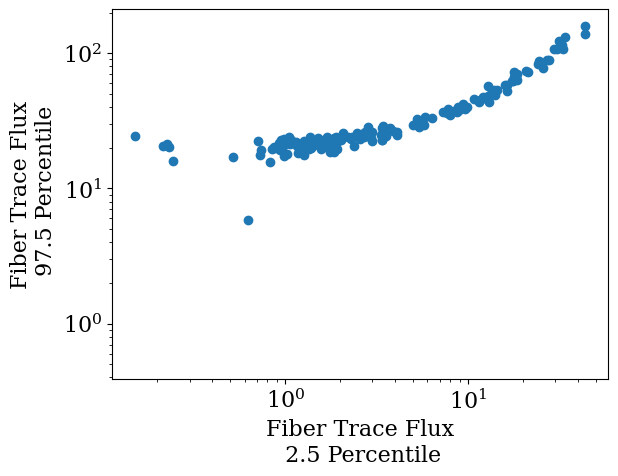

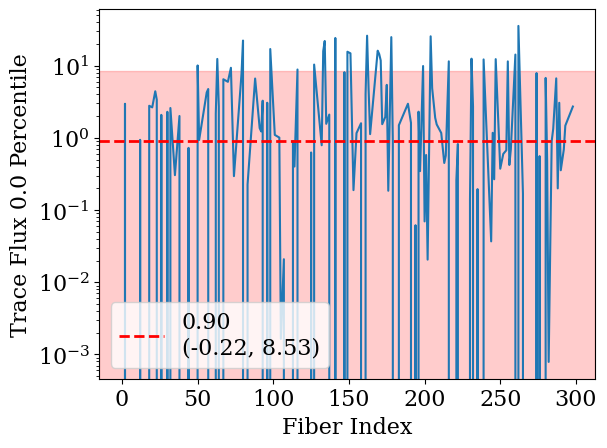

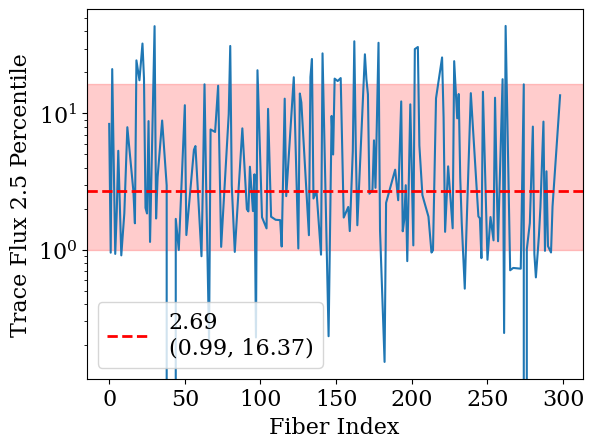

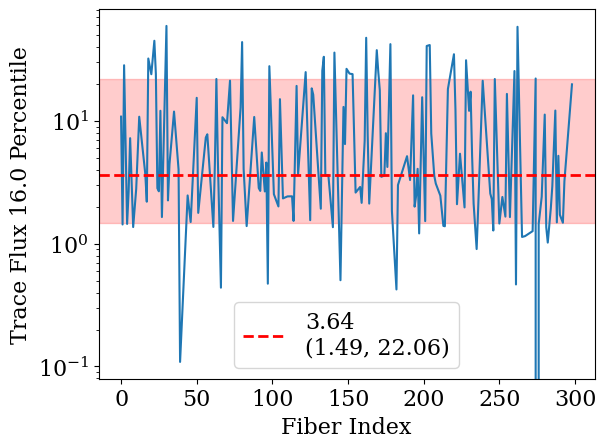

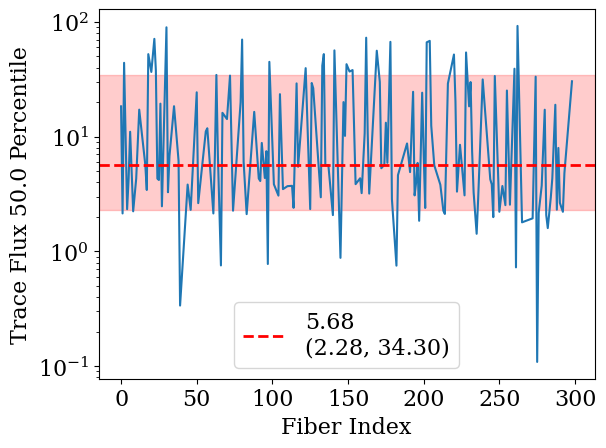

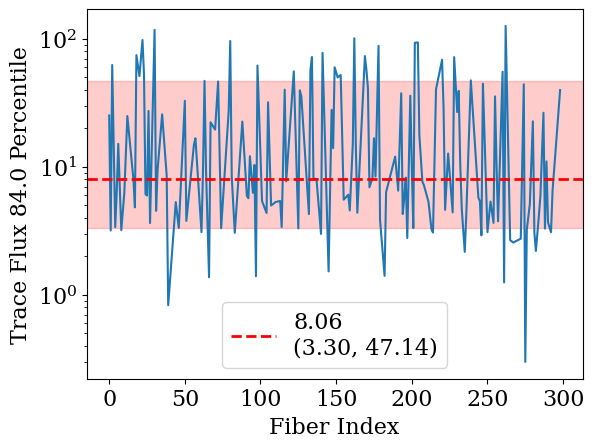

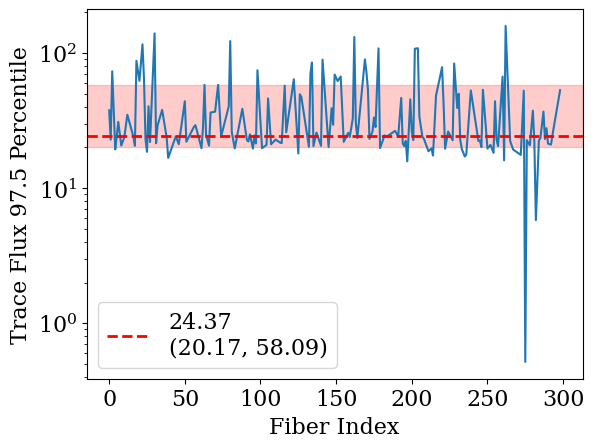

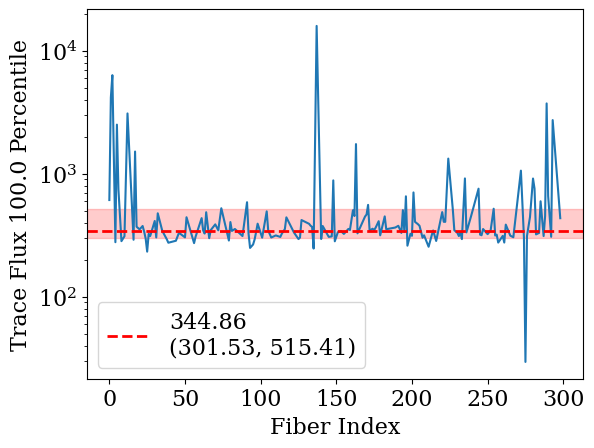

In [318]:
plt.scatter(trace_flux_levels[:,1],trace_flux_levels[:,-2])
plt.gca().set_yscale('log')
plt.gca().set_xscale('log')
plt.xlabel('Fiber Trace Flux\n 2.5 Percentile')
plt.ylabel('Fiber Trace Flux\n 97.5 Percentile')
plt.show()

for j in range(len(percentiles)):
    plt.plot(good_explore_inds,trace_flux_levels[:,j])
    plt.gca().set_yscale('log')
    med = np.nanmedian(trace_flux_levels[:,j])
    scatter = np.nanpercentile(trace_flux_levels[:,j],[16,84])
    plt.axhline(med,color='r',lw=2,ls='--',label = '%.2f\n(%.2f, %.2f)'%(med,scatter[0],scatter[1]))
    plt.axhspan(scatter[0],scatter[1],color='r',alpha=0.2)
    plt.legend(loc='best')
    plt.xlabel('Fiber Index')
    plt.ylabel('Trace Flux %.1f Percentile'%percentiles[j])
    plt.show()



<KeysViewHDF5 ['CRimage', 'amp_off_vec', 'chisqimage', 'dimage', 'gainMat', 'ivarimage', 'last_unsaturated', 'metadata', 'outdat', 'readVarMat', 'ref_zpt_out', 'sci_zpt_out']>
Current fiber index: 30
Current fiber type: sci
Current fiber median flux: 214.19


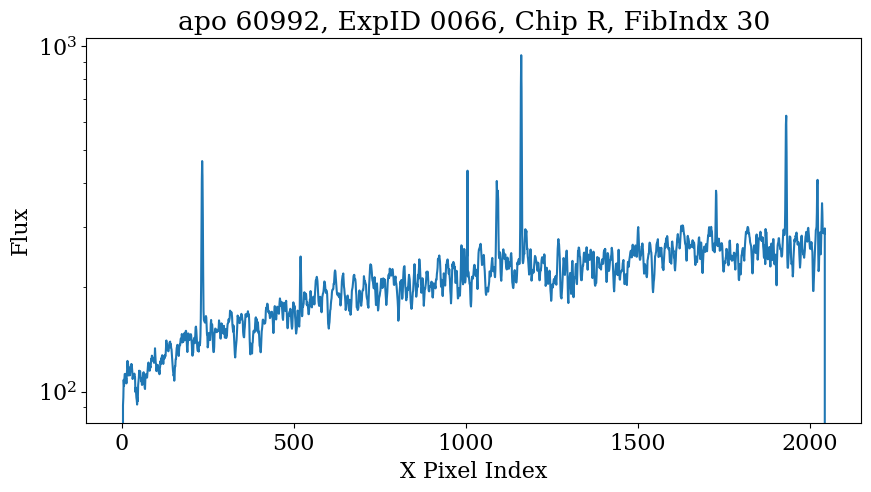

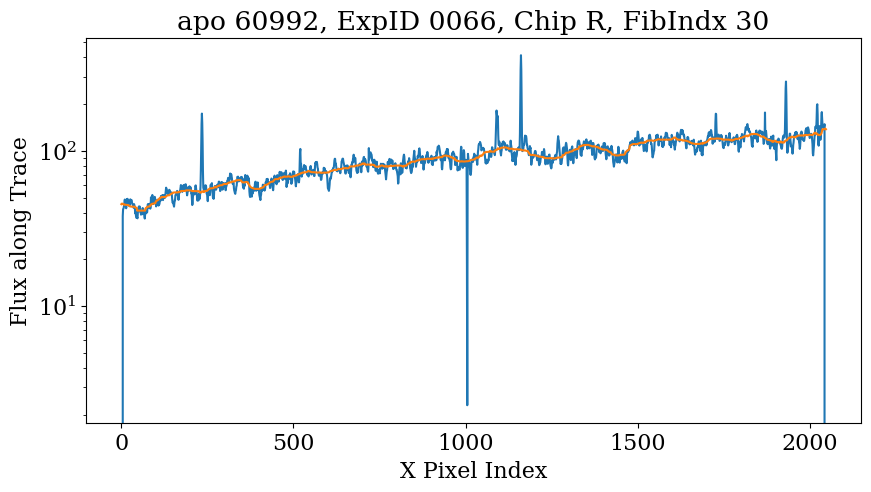

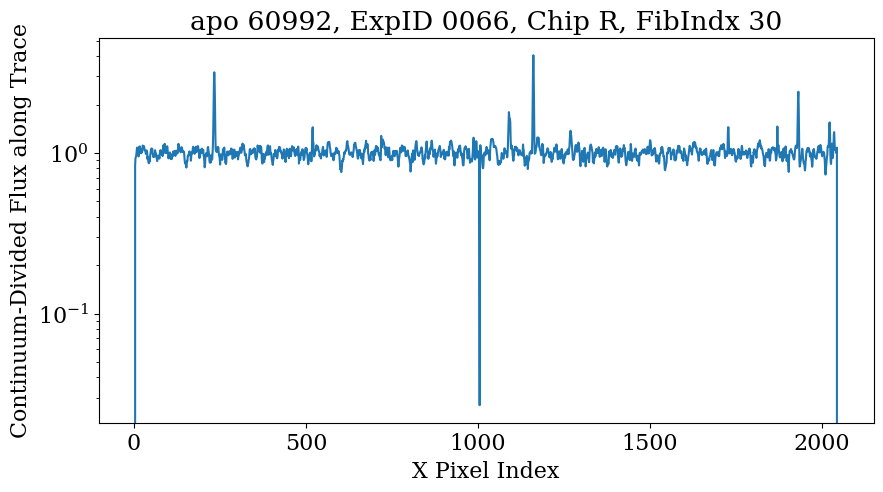

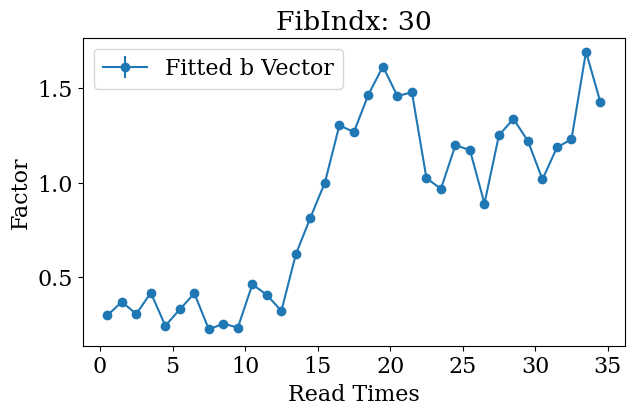

Current fiber index: 162
Current fiber type: sci
Current fiber median flux: 169.0


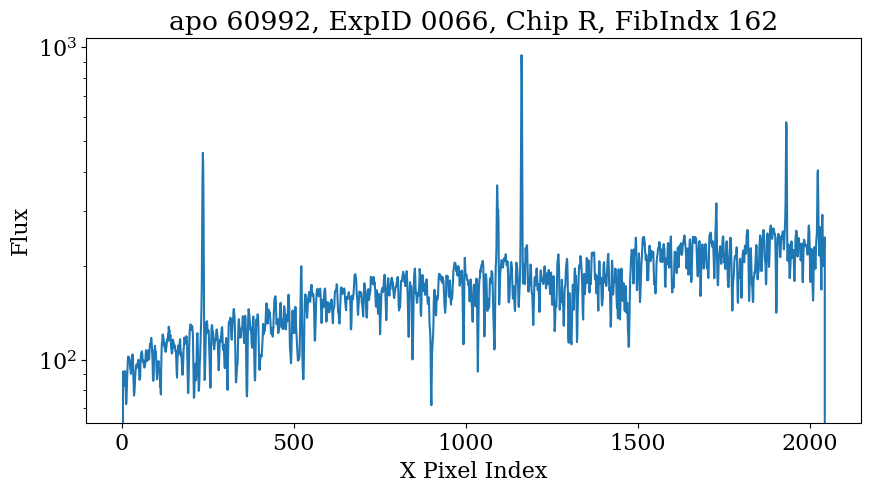

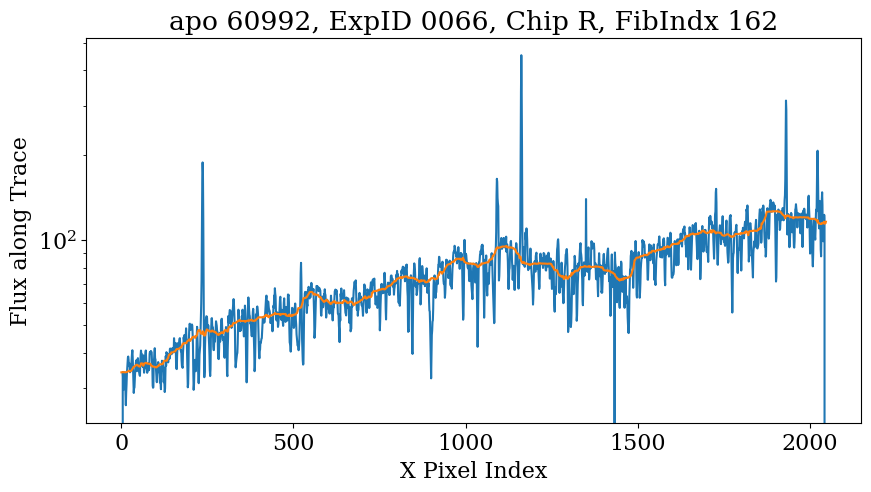

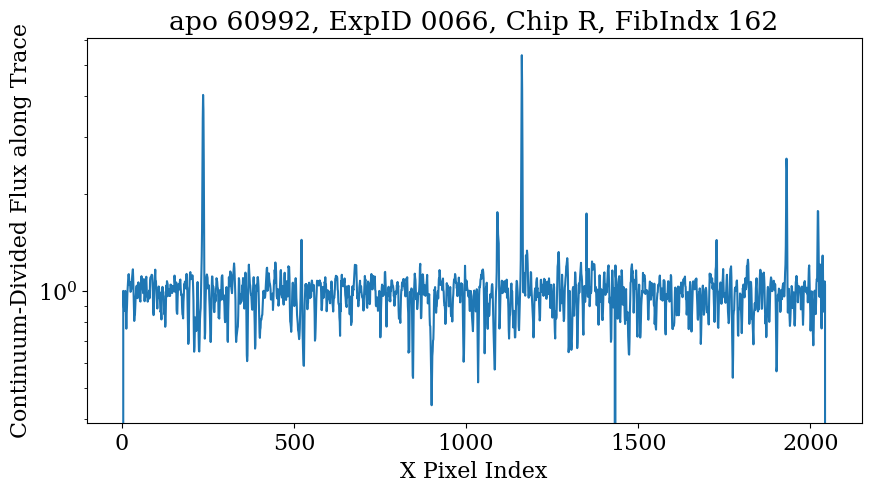

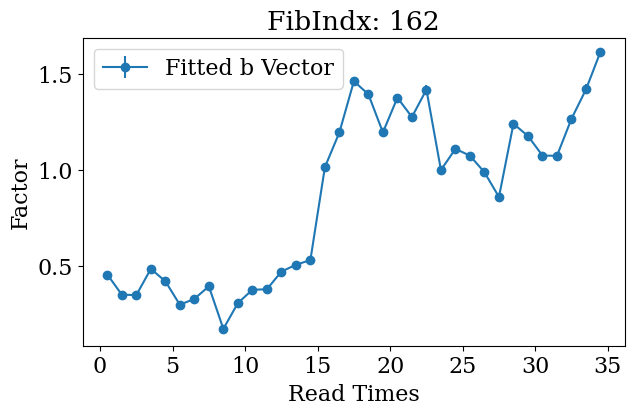

Current fiber index: 22
Current fiber type: sci
Current fiber median flux: 165.13


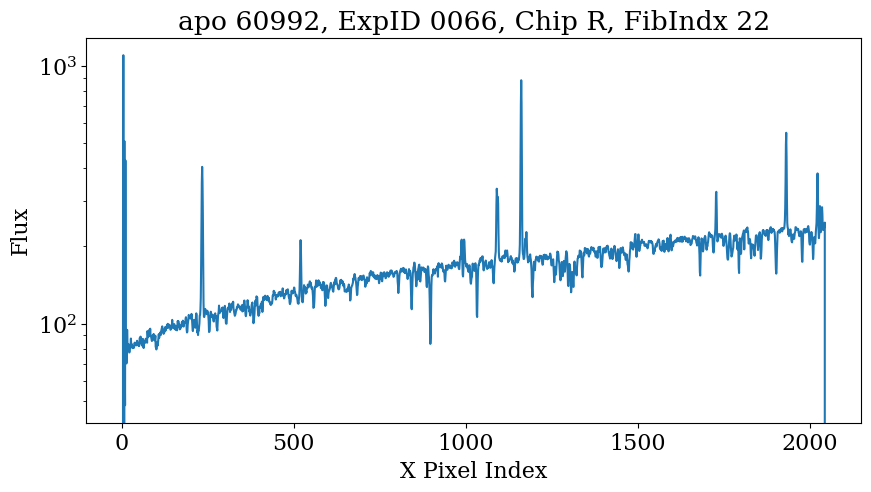

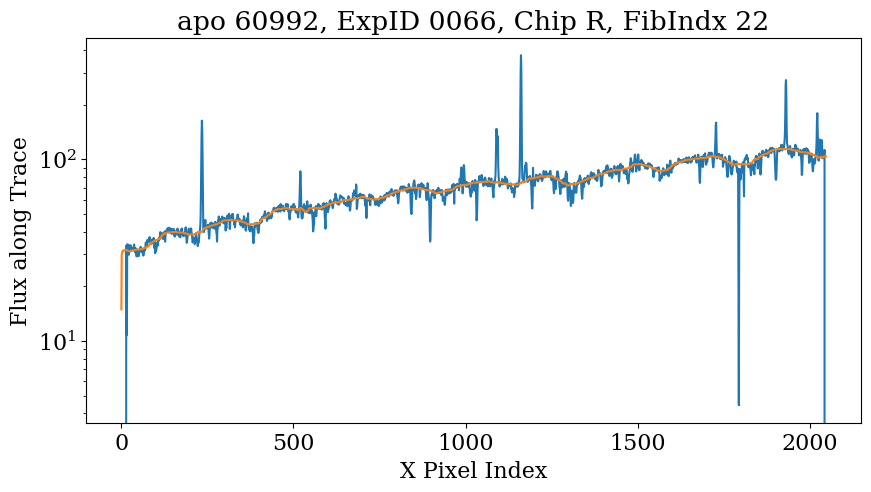

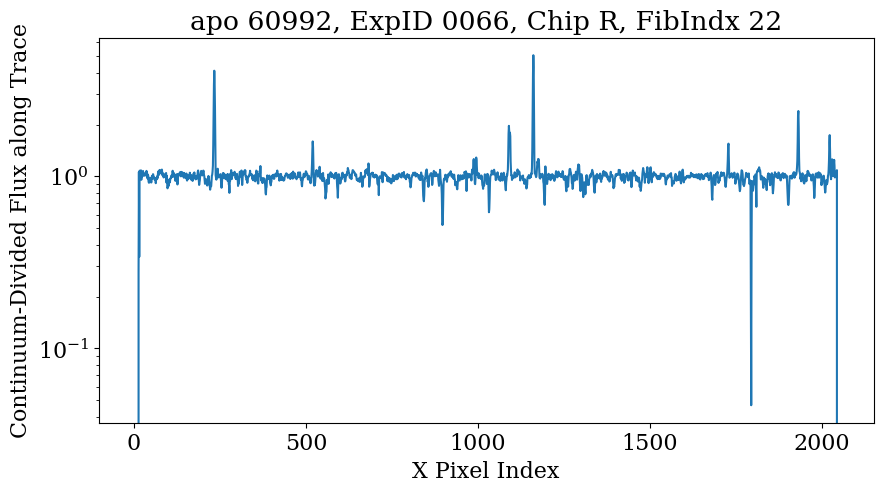

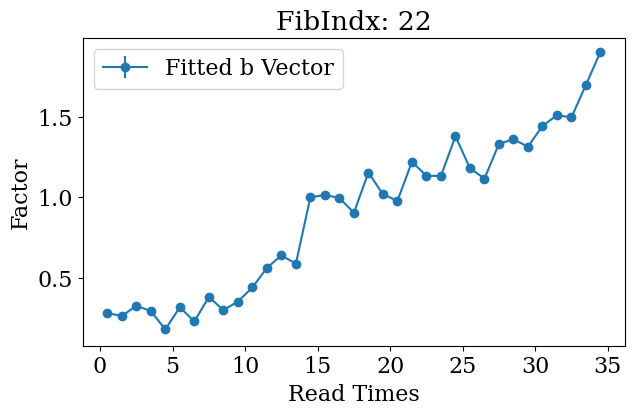

Current fiber index: 80
Current fiber type: sci
Current fiber median flux: 163.09


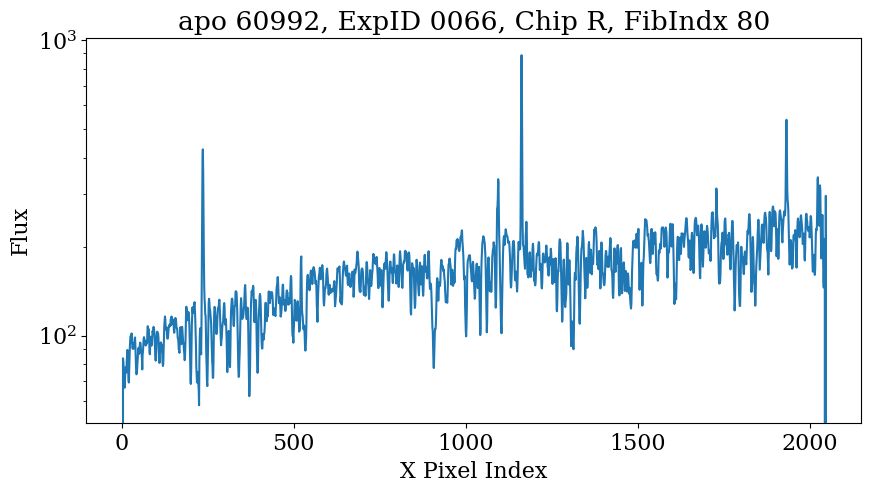

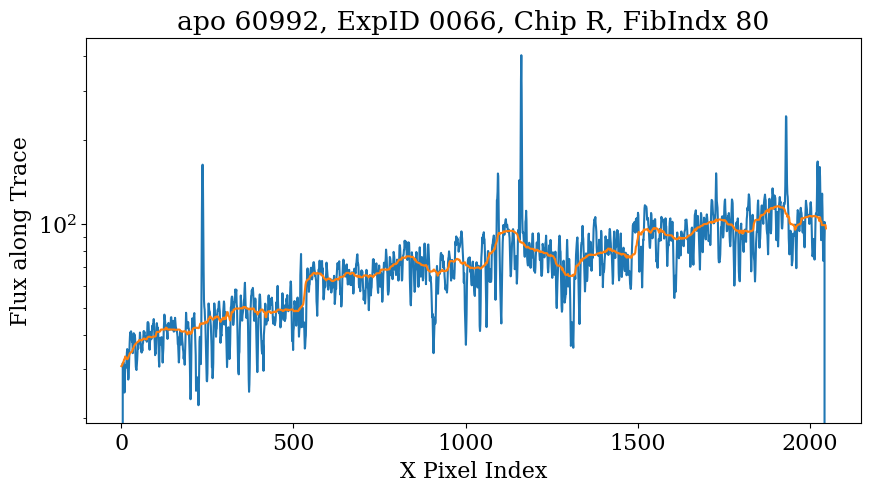

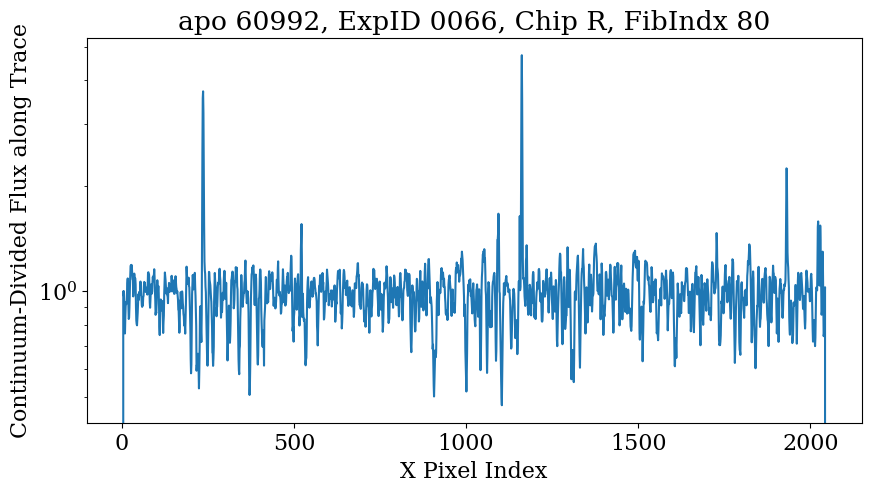

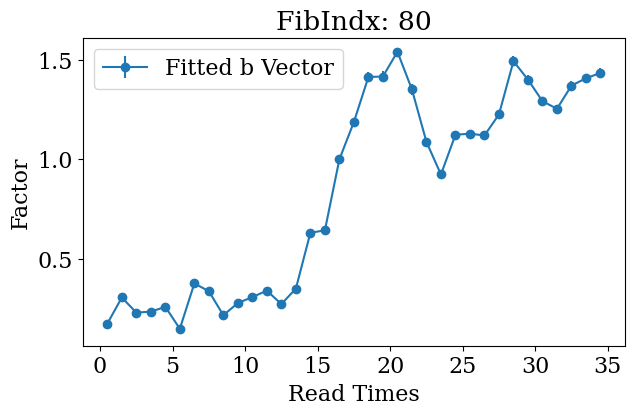

Current fiber index: 204
Current fiber type: sci
Current fiber median flux: 163.01


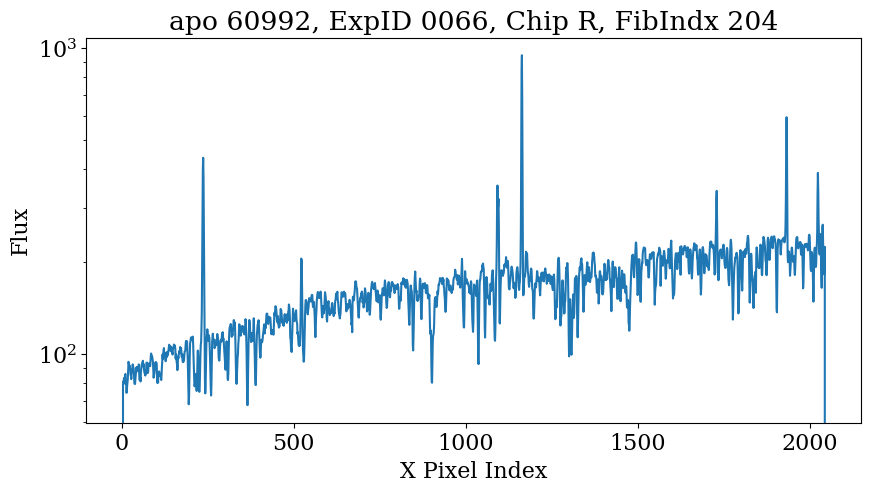

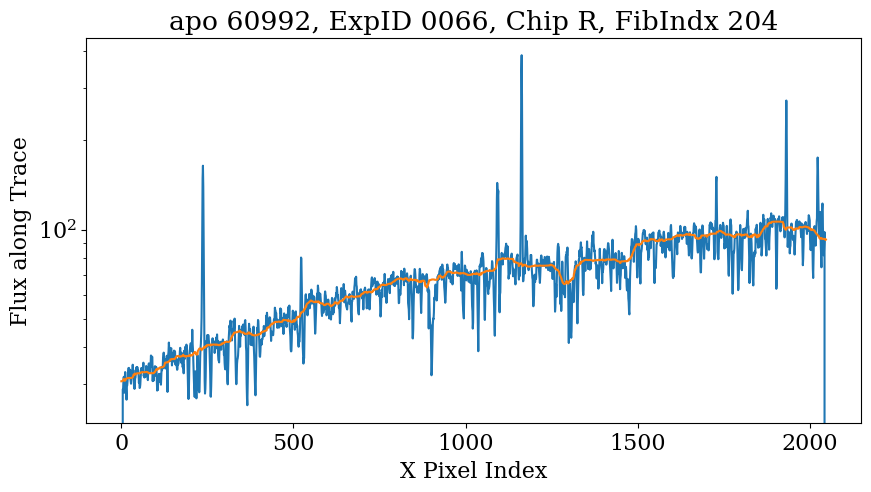

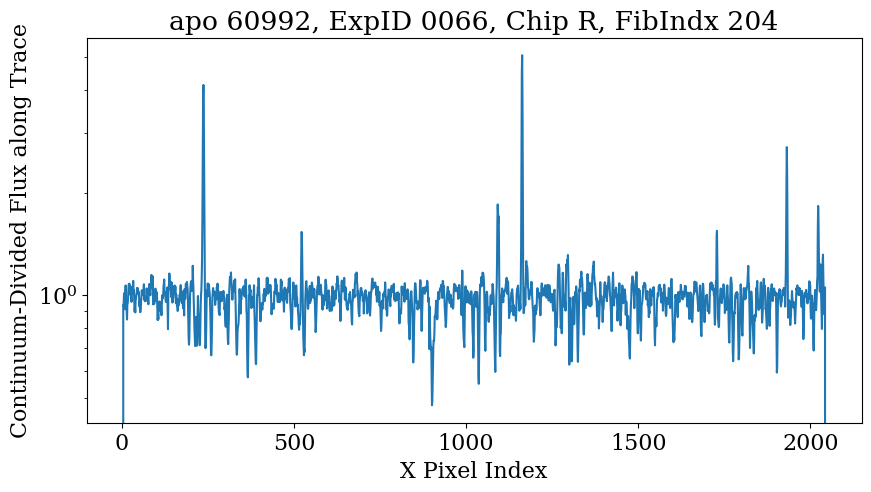

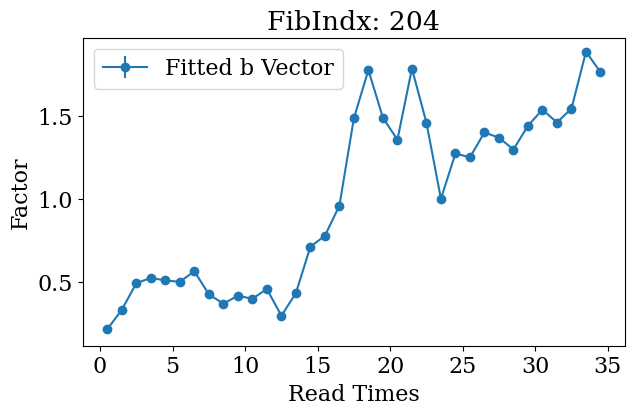

Current fiber index: 220
Current fiber type: sci
Current fiber median flux: 162.47


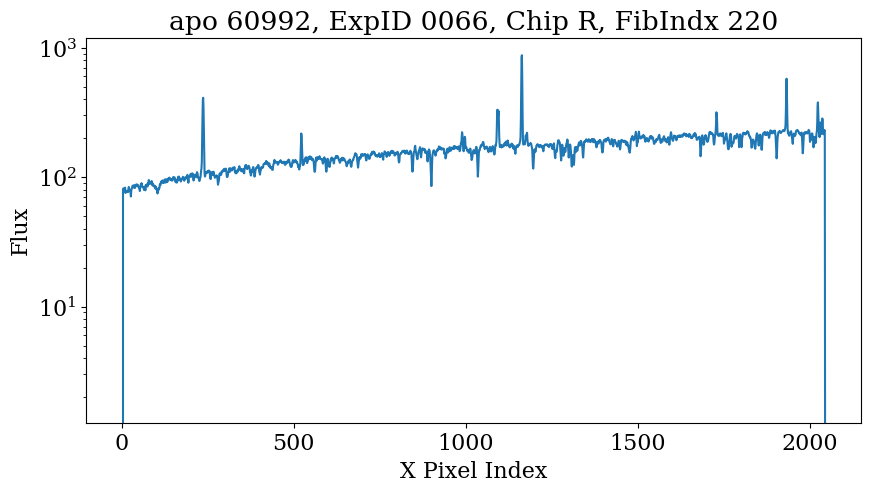

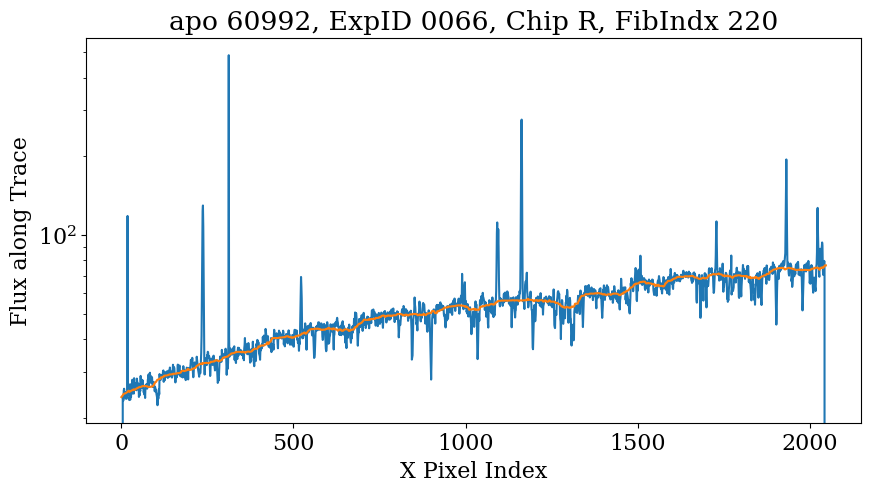

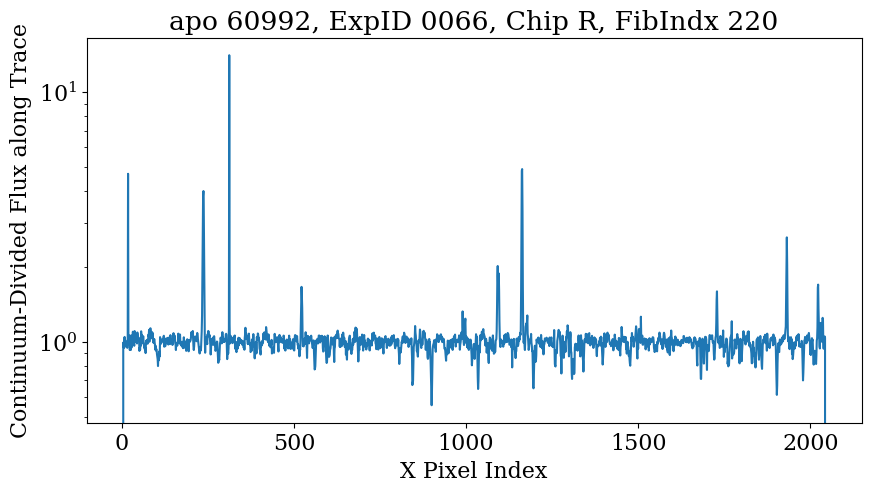

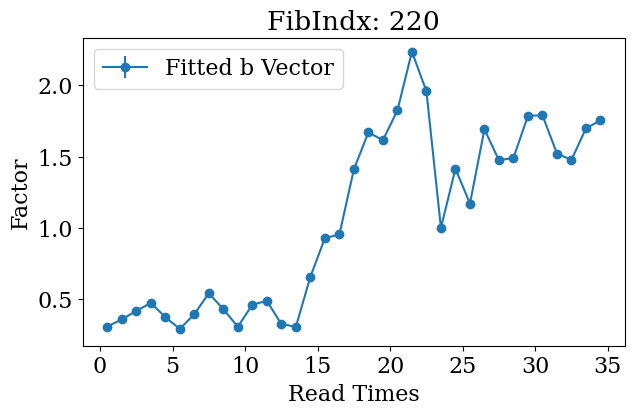

Current fiber index: 202
Current fiber type: sci
Current fiber median flux: 155.05


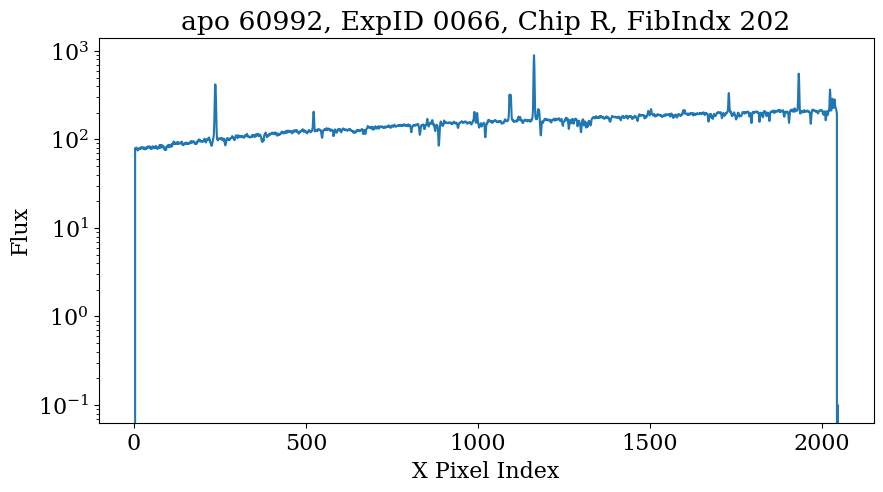

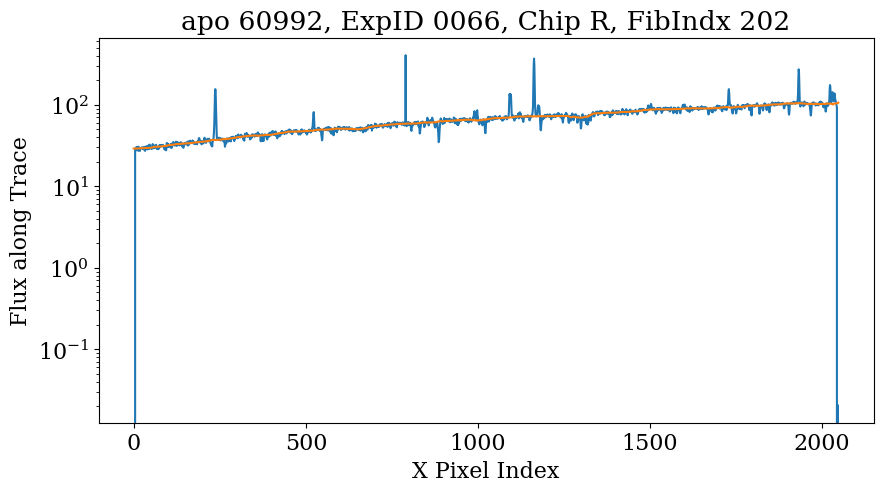

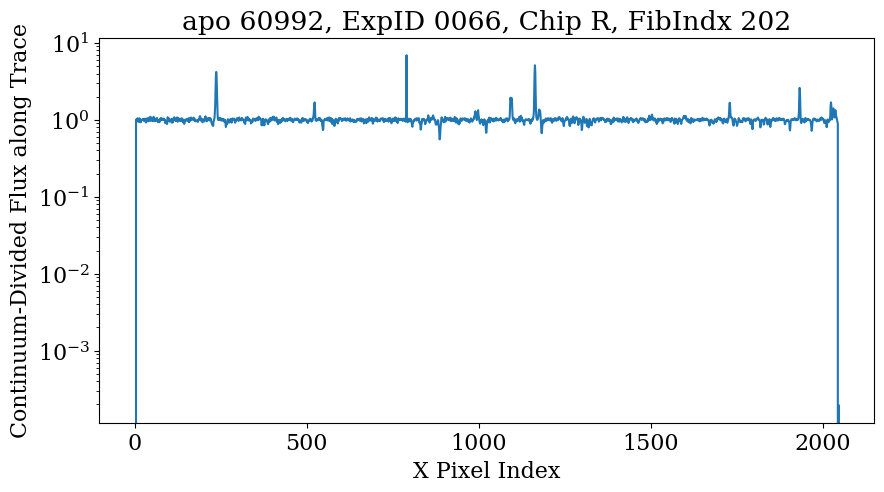

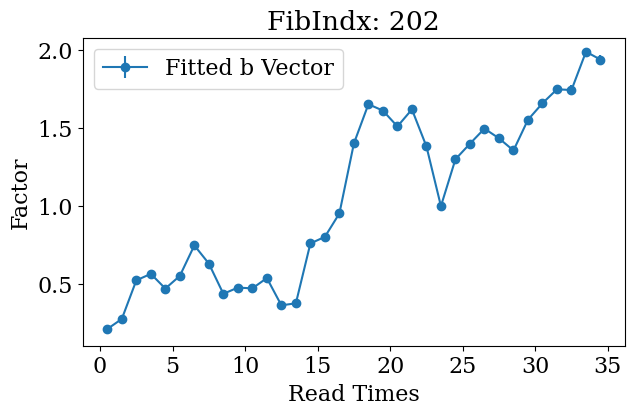

Current fiber index: 141
Current fiber type: sci
Current fiber median flux: 143.43


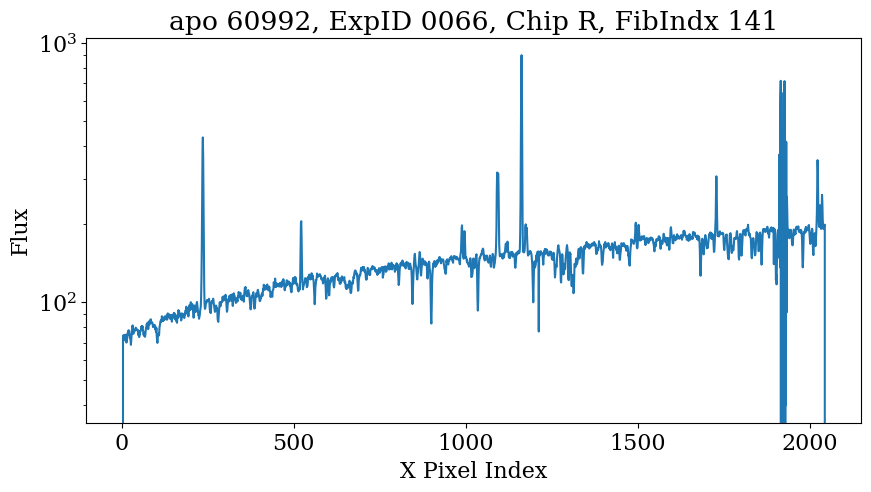

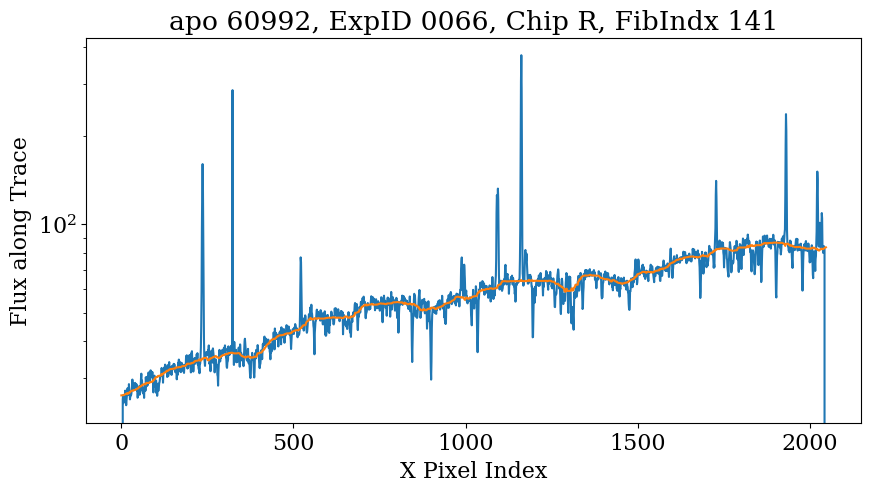

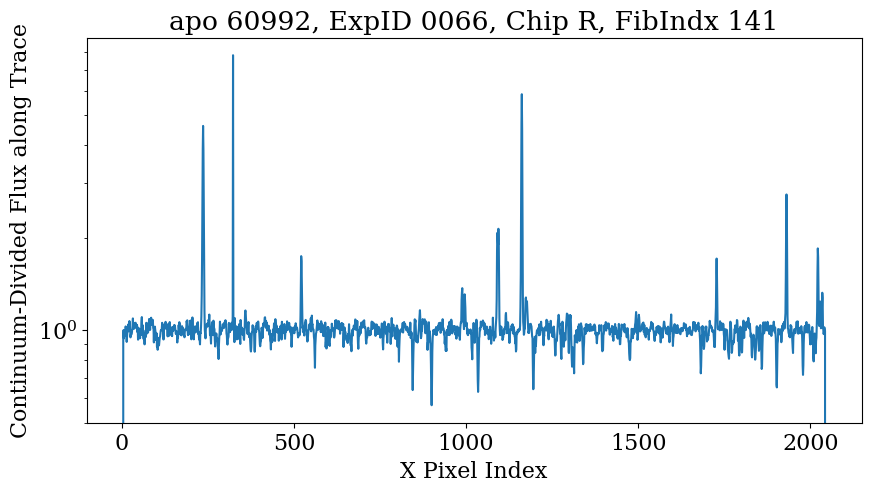

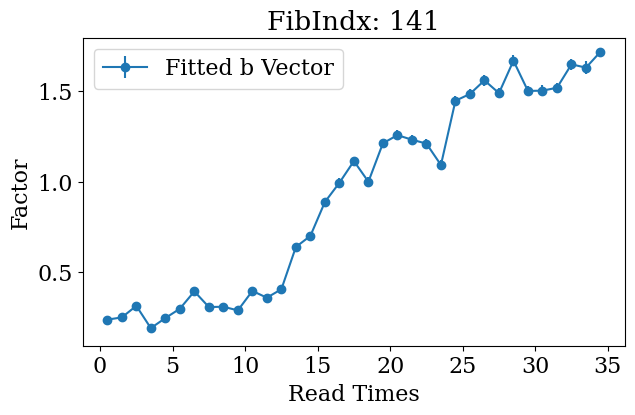

Current fiber index: 178
Current fiber type: sci
Current fiber median flux: 138.76


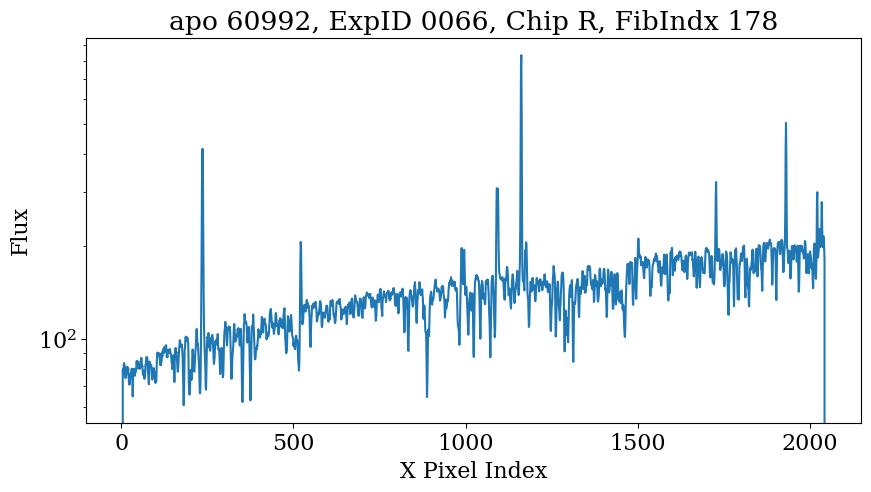

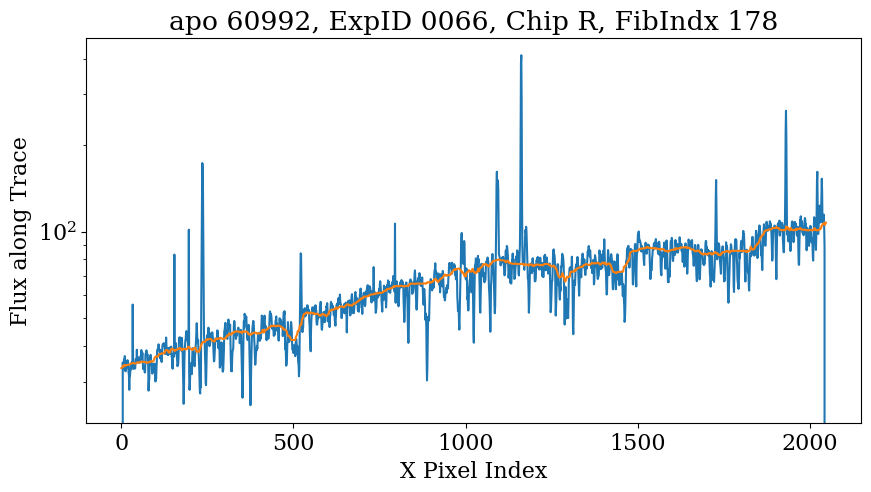

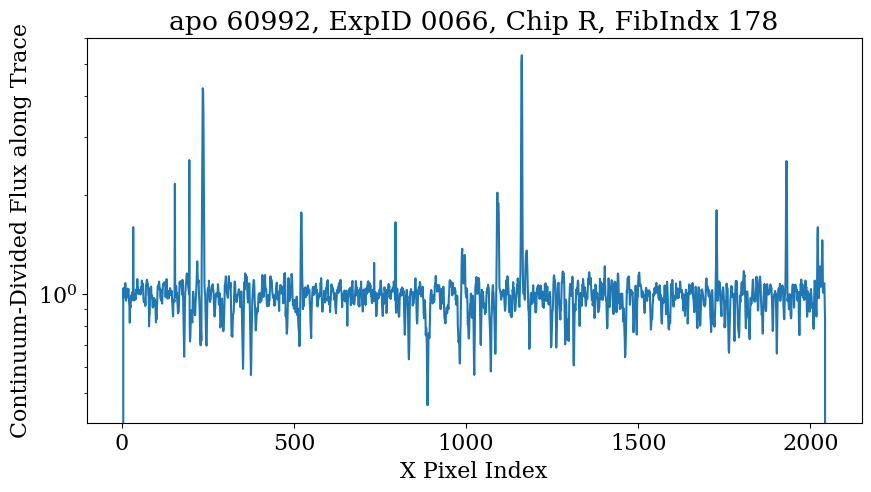

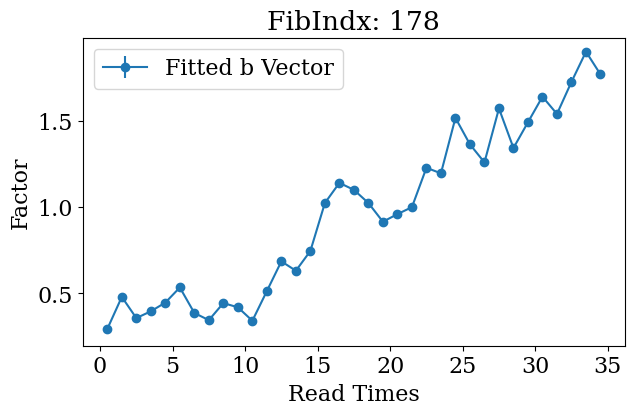

Current fiber index: 228
Current fiber type: sci
Current fiber median flux: 136.35


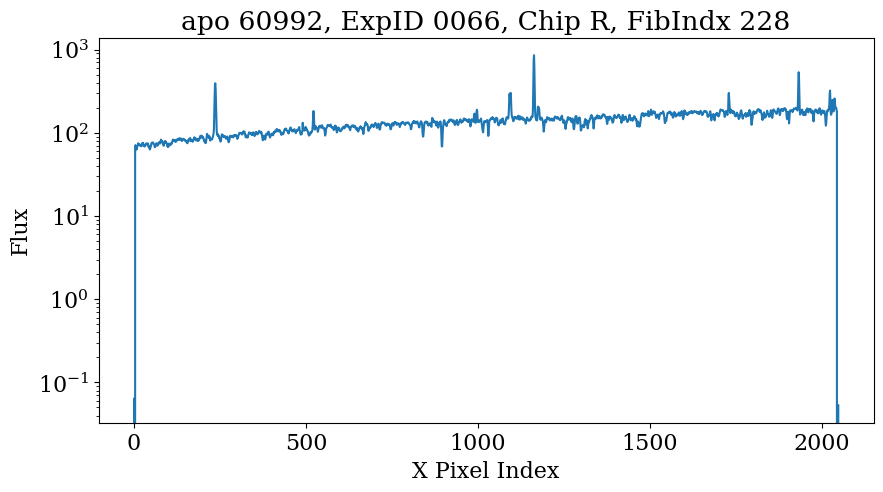

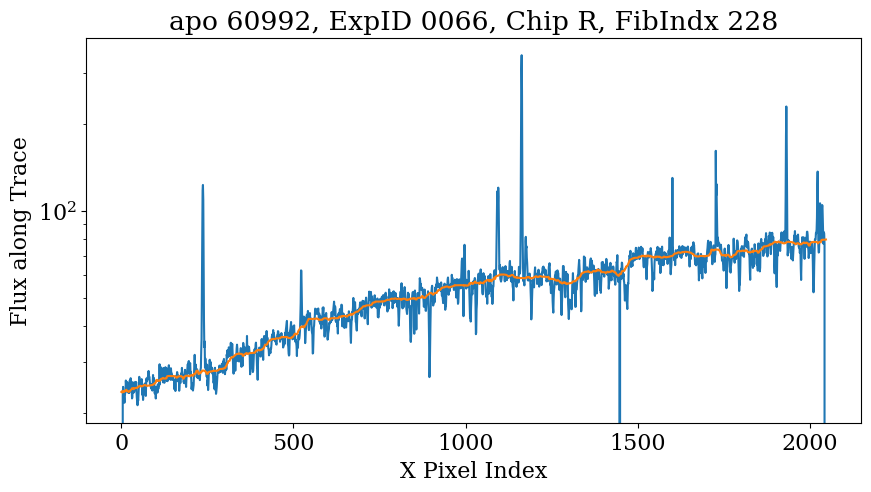

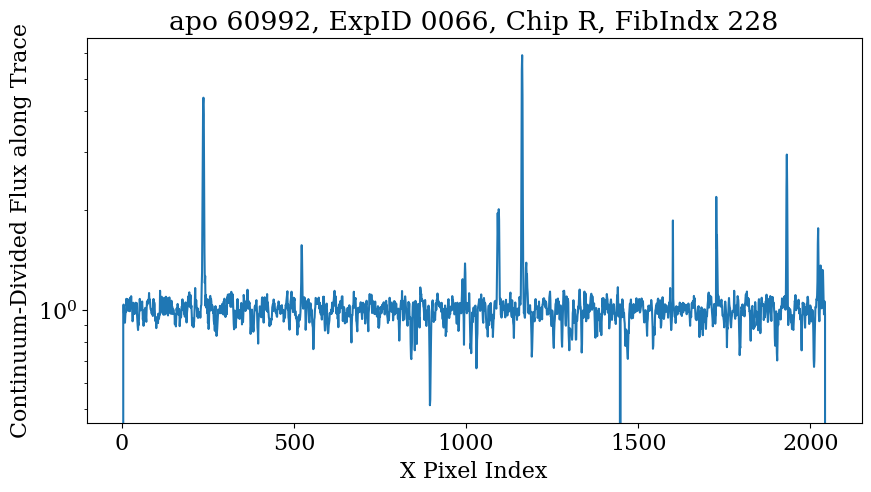

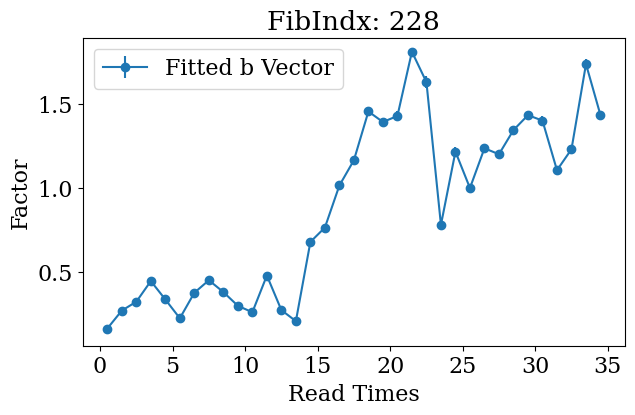

In [319]:
#sort the sci and tel fibers by median flux (decreasing from max)
use_types = ((fiber_types == 'sci') | (fiber_types == 'tel'))
# use_types = ((fiber_types == 'sky'))
good_explore_inds = np.where(use_types)[0][np.argsort(fiber_med_fluxes[use_types])[::-1]]
chosen_fib_ind = good_explore_inds[0]
chosen_fib_ind = good_explore_inds[2]

# good_explore_inds = good_explore_inds[:10] #focus on top 10 bright fibers
good_explore_inds = good_explore_inds[1:11] #focus on top 10 bright fibers
# good_explore_inds = good_explore_inds[0:30] #focus on top 10 bright fibers

fname_3d = f'{datapath}ar3Dcal_{tele}_{mjd}_{expid}_{chip}_{ftype}.h5'
data_3d = h5py.File(fname_3d)
print(data_3d.keys())

mjd_mid_exposure = np.array(data_3d['metadata']['mjd_mid_exposure_precise'])

result_dict = {}
for chosen_fib_ind in good_explore_inds:

    print(f'Current fiber index: {chosen_fib_ind}')
    print(f'Current fiber type: {fiber_types[chosen_fib_ind]}')
    print(f'Current fiber median flux: {round(fiber_med_fluxes[chosen_fib_ind],2)}')
    
    
    x_inds = np.arange(fiber_flux_1ds.shape[1])
    plt.figure(figsize=(10,5))
    plt.gca().set_yscale('log')
    plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    plt.plot(x_inds,fiber_flux_1ds[chosen_fib_ind])
    plt.xlabel('X Pixel Index')
    plt.ylabel('Flux')
    plt.show()


    chosen_trace_inds = np.round(fiber_trace_centers[chosen_fib_ind]).astype(int)
    
    pixel_best_fit_fluxes = np.array(data_3d['dimage'])[chosen_trace_inds,x_inds]
    pixel_best_fit_ivars = np.array(data_3d['ivarimage'])[chosen_trace_inds,x_inds]
    pixel_chisqimage = np.array(data_3d['chisqimage'])[chosen_trace_inds,x_inds]
    pixel_gainMat = np.array(data_3d['gainMat'])[chosen_trace_inds,x_inds]
    pixel_readVarMat = np.array(data_3d['readVarMat'])[chosen_trace_inds,x_inds] #(DN/read)^2
    pixel_raw_data = np.array(data_3d['outdat'])[:,chosen_trace_inds,x_inds]

    n_repeat = 2
    med_cont = np.zeros_like(pixel_best_fit_fluxes)
    med_window = 30 #number of pixels for smoothing
    
    keep_pixels = np.isfinite(pixel_best_fit_fluxes)
    
    for r_ind in range(n_repeat):
        for j in range(len(x_inds)):
            nearby_inds = np.where(keep_pixels & (np.abs(x_inds-x_inds[j]) < med_window))[0]
            med_cont[j] = np.nanmedian(pixel_best_fit_fluxes[nearby_inds])
        cont_resids = (pixel_best_fit_fluxes - med_cont)
        cont_resid_sigmas = cont_resids*np.sqrt(pixel_best_fit_ivars)
        
        # good_resids = (cont_resid_sigmas >= -100) & (cont_resid_sigmas <= 10)
        good_resids = (cont_resid_sigmas >= -10) & (cont_resid_sigmas <= 10)
        if np.all(good_resids == keep_pixels):
            break
        keep_pixels = good_resids

    plt.figure(figsize=(10,5))
    plt.gca().set_yscale('log')
    plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    plt.plot(x_inds,pixel_best_fit_fluxes)
    plt.plot(x_inds,med_cont)
    plt.xlabel('X Pixel Index')
    plt.ylabel('Flux along Trace')
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.gca().set_yscale('log')
    plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    plt.plot(x_inds,pixel_best_fit_fluxes/med_cont)
    plt.xlabel('X Pixel Index')
    plt.ylabel('Continuum-Divided Flux along Trace')
    plt.show()

    good_pix_data = np.all(np.isfinite(pixel_raw_data),axis=0) & np.isfinite(pixel_gainMat) & np.isfinite(pixel_readVarMat)
    
    absorption_pixels = (cont_resid_sigmas < -10) & (pixel_best_fit_fluxes/med_cont < 0.95) & good_pix_data
    for pix_ind in np.where(absorption_pixels)[0]:
        absorption_pixels[np.abs(x_inds-pix_ind) < 3] = True
    absorption_pixels = absorption_pixels & np.isfinite(pixel_best_fit_fluxes) & good_pix_data
    skyline_pixels = (cont_resid_sigmas > 10) & (~absorption_pixels) & (pixel_best_fit_fluxes/med_cont > 1.05) & good_pix_data
    for pix_ind in np.where(skyline_pixels)[0]:
        skyline_pixels[np.abs(x_inds-pix_ind) < 3] = True
    skyline_pixels = skyline_pixels & np.isfinite(pixel_best_fit_fluxes) & good_pix_data
    
    continuum_pixels = np.isfinite(pixel_best_fit_fluxes) & (~absorption_pixels) & (~skyline_pixels) & good_pix_data
    
    
    absorption_plot_flux = np.zeros(len(pixel_best_fit_fluxes))*np.nan
    absorption_plot_flux[absorption_pixels] = (pixel_best_fit_fluxes/med_cont)[absorption_pixels]
    skyline_plot_flux = np.zeros(len(pixel_best_fit_fluxes))*np.nan
    skyline_plot_flux[skyline_pixels] = (pixel_best_fit_fluxes/med_cont)[skyline_pixels]
    continuum_plot_flux = np.zeros(len(pixel_best_fit_fluxes))*np.nan
    continuum_plot_flux[continuum_pixels] = (pixel_best_fit_fluxes/med_cont)[continuum_pixels]
    
    # plt.figure(figsize=(10,5))
    # plt.gca().set_yscale('log')
    # plt.title(f'Absorption Pixels (N = {np.sum(absorption_pixels)})\n{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    # plt.plot(x_inds,absorption_plot_flux)
    # plt.xlabel('X Pixel Index')
    # plt.ylabel('Continuum-Divided Flux along Trace')
    # plt.xlim(x_inds[0]-10,x_inds[-1]+10)
    # plt.show()
    
    # plt.figure(figsize=(10,5))
    # plt.gca().set_yscale('log')
    # plt.title(f'Skyline Pixels (N = {np.sum(skyline_pixels)})\n{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    # plt.plot(x_inds,skyline_plot_flux)
    # plt.xlabel('X Pixel Index')
    # plt.ylabel('Continuum-Divided Flux along Trace')
    # plt.xlim(x_inds[0]-10,x_inds[-1]+10)
    # plt.show()
    
    # plt.figure(figsize=(10,5))
    # plt.gca().set_yscale('log')
    # plt.title(f'Continuum Pixels (N = {np.sum(continuum_pixels)})\n{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    # plt.plot(x_inds,continuum_plot_flux)
    # plt.xlabel('X Pixel Index')
    # plt.ylabel('Continuum-Divided Flux along Trace')
    # plt.xlim(x_inds[0]-10,x_inds[-1]+10)
    # plt.show()

    # use_pixel_inds = np.where(absorption_pixels)[0]
    use_pixel_inds = np.where(continuum_pixels)[0]
    # use_pixel_inds = np.where(skyline_pixels)[0]
    
    data_per_pix = pixel_raw_data.T * pixel_gainMat[:,None] #convert to electrons
    read_error_per_pix = np.sqrt(pixel_readVarMat) * pixel_gainMat #convert to electrons
    n_reads = data_3d['outdat'].shape[0]
    
    # np.random.seed(123)
    use_pixels = use_pixel_inds
    use_pixels = np.random.choice(use_pixel_inds,100,replace=False)
    
    n_pixels = len(use_pixels)
    data_cube = data_per_pix[use_pixels]
    
    count_diffs = np.diff(data_cube,axis=1)
    
    
    obs_fluxes = np.copy(data_cube)
    read_errs = read_error_per_pix[use_pixels]
    
    
    max_b_ind,b_vect_mean,b_vect_Vinv,b_vect_V,\
            f_max_means_given_b,f_max_ivars_given_b,\
            comb_param_means,comb_param_Vinv,comb_param_V = fit_flux.measure_time_dep_fluxes_LINEAR(obs_fluxes,read_errs,
                                                           n_max_repeat=100,b_vect_change_tol=1e-10,f_max_change_tol=1e-10,
                                                           min_b_val=1e-10,min_f_val=1e-10)
    
    f_means_no_b,f_ivars_no_b,chi2s_data_no_b = fit_flux.fit_fluxes_optimal(obs_fluxes,read_errs,
                                                                               n_repeat=2,b_vect=None)
    f_means_with_b,f_ivars_with_b,chi2s_data_with_b = fit_flux.fit_fluxes_optimal(obs_fluxes,read_errs,
                                                                               n_repeat=2,b_vect=b_vect_mean)
    
    non_max_inds = np.ones(len(b_vect_mean)).astype(bool)
    non_max_inds[max_b_ind] = False
    non_max_inds = np.where(non_max_inds)[0]
    
    b_vect_errs = np.sqrt(np.diag(b_vect_V))
    f_max_errs_given_b = np.power(f_max_ivars_given_b,-0.5)
    
    b_vect_mean_linear = np.copy(b_vect_mean)
    b_vect_errs_linear = np.copy(b_vect_errs)
    b_vect_cov_linear = np.copy(b_vect_V)
    f_max_means = comb_param_means[:n_pixels]
    
    
    #rescaling average
     
    f_max_post = np.copy(f_max_means)
    b_vect_post = np.copy(b_vect_mean_linear)
    b_vect_post_cov = np.copy(b_vect_cov_linear)
    curr_f_post_guess = f_max_post[:, None] * b_vect_post[None, :]
    read_times = np.arange(n_reads)
    obs_flux_diffs = np.diff(obs_fluxes,axis=1)
    read_vars = np.power(read_errs,2)

    result_dict[chosen_fib_ind] = {
        'b_vect_post':b_vect_post,
        'b_vect_errs':b_vect_errs,
        'b_vect_post_cov':b_vect_post_cov,
    }
    
    plt.figure(figsize=(7, 4))
    plt.errorbar(read_times[:-1]+0.5,b_vect_post/np.nanmedian(b_vect_post),yerr=np.sqrt(np.diag(b_vect_post_cov/np.nanmedian(b_vect_post))),label= "Fitted b Vector",fmt = "-o")
    

    plt.title('FibIndx: %d'%chosen_fib_ind)
    plt.ylabel("Factor")
    plt.xlabel("Read Times")  
    plt.legend()
    plt.show()



In [320]:
alpha = 0.5

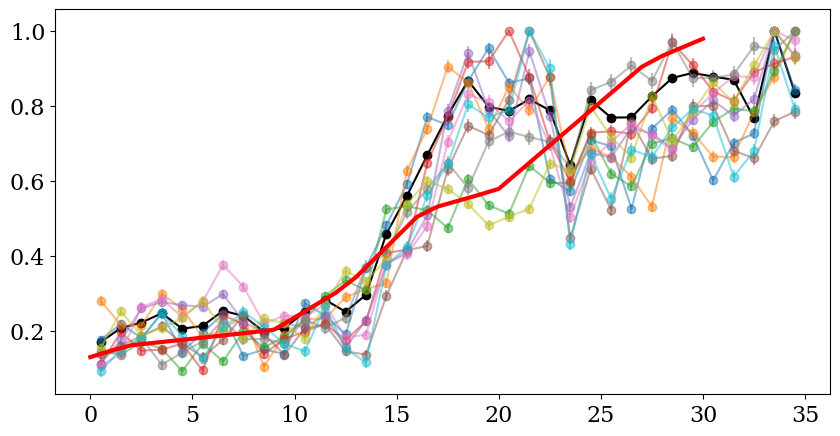

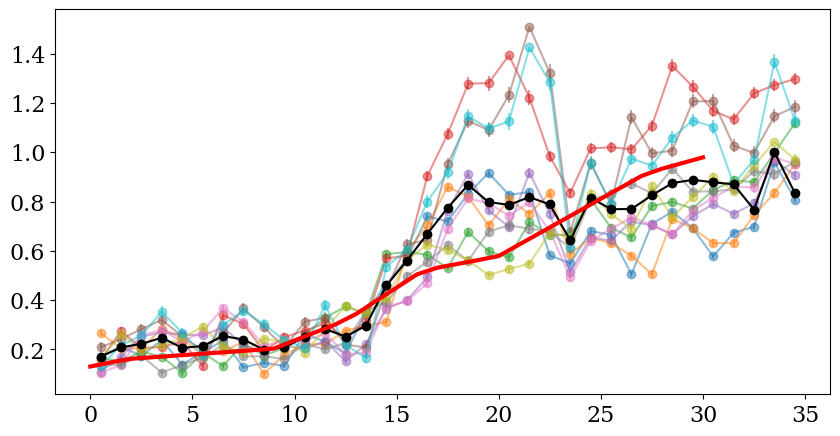

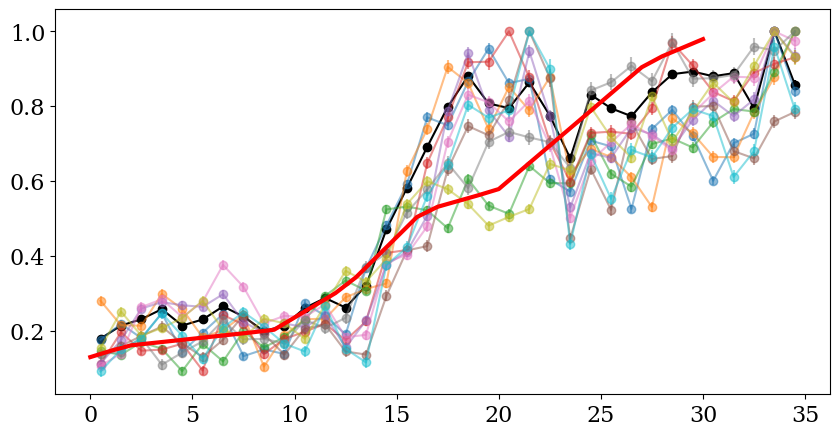

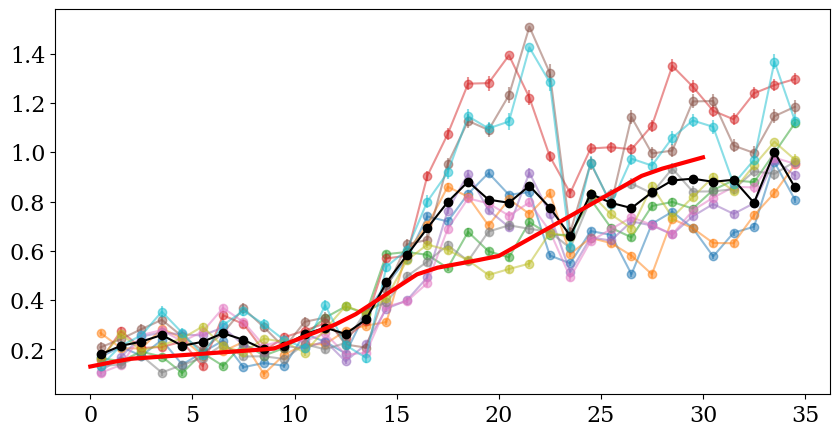

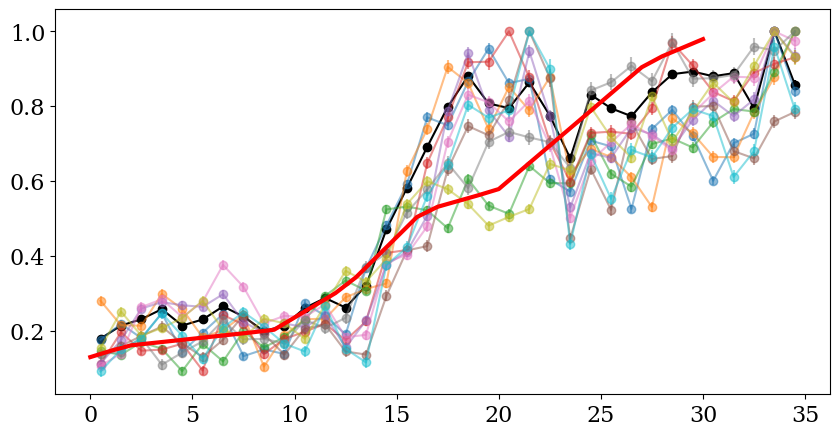

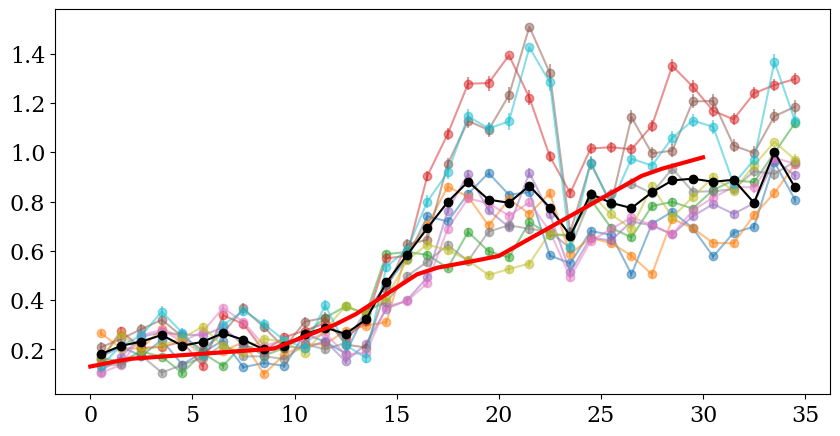

In [321]:
interp_flux_norms = np.interp(apogee_dts,guider_dts,_df.fluxNorm,left=np.nan,right=np.nan)

key = list(result_dict.keys())[0]
all_b_vects = np.zeros((len(result_dict),len(result_dict[key]['b_vect_post'])))
all_b_vec_covs = np.zeros((len(result_dict),len(result_dict[key]['b_vect_post']),len(result_dict[key]['b_vect_post'])))
all_b_vect_scales = np.ones((len(result_dict)))

for r_ind in range(3):
    comb_inv_covs = np.zeros((len(result_dict[key]['b_vect_post']),len(result_dict[key]['b_vect_post'])))
    comb_inv_cov_dot_means = np.zeros(len(result_dict[key]['b_vect_post']))
    for key_ind,key in enumerate(result_dict.keys()):
        all_b_vects[key_ind] = result_dict[key]['b_vect_post']*all_b_vect_scales[key_ind]
        all_b_vec_covs[key_ind] = result_dict[key]['b_vect_post_cov']*all_b_vect_scales[key_ind]**2
        
        good_inds = np.where(np.isfinite(np.diag(all_b_vec_covs[key_ind])))[0]
        curr_inv_cov = np.linalg.inv(all_b_vec_covs[key_ind][good_inds][:,good_inds])
        for ind,good_ind in enumerate(good_inds):
            comb_inv_covs[good_ind,good_inds] += curr_inv_cov[ind]
        comb_inv_cov_dot_means[good_inds] += np.dot(curr_inv_cov,all_b_vects[key_ind][good_inds])
        
    good_inds = np.where(np.diag(comb_inv_covs) > 0)[0]
    comb_cov = np.linalg.inv(comb_inv_covs[good_inds][:,good_inds])
    
    comb_final_cov = np.diag(np.ones(len(result_dict[key]['b_vect_post']))*np.inf)
    comb_final_mean = np.ones(len(result_dict[key]['b_vect_post']))
    comb_final_mean[good_inds] = np.dot(comb_cov,comb_inv_cov_dot_means[good_inds])
    
    for ind,good_ind in enumerate(good_inds):
        comb_final_cov[good_ind,good_inds] = comb_cov[ind]
    
    comb_mean_scale = np.nanmax(comb_final_mean)
    # comb_mean_scale = np.nanmedian(comb_final_mean)
    comb_final_mean /= comb_mean_scale
    comb_final_cov /= comb_mean_scale**2
    
    for key_ind,key in enumerate(result_dict.keys()):
        # curr_comb_V = all_b_vec_covs[key_ind]+comb_final_cov
        # good_inds = np.where(np.isfinite(np.diag(curr_comb_V)))[0]
        # curr_comb_Vinv = np.linalg.inv(curr_comb_V[good_inds][:,good_inds])
    
        # mult_var = 1/np.dot(np.dot(all_b_vects[key_ind][good_inds],curr_comb_Vinv),all_b_vects[key_ind][good_inds])
        # mult_mean = 1/(mult_var * np.dot(np.dot(all_b_vects[key_ind][good_inds],curr_comb_Vinv),comb_final_mean[good_inds]))

        curr_comb_V = all_b_vec_covs[key_ind]
        good_inds = np.where(np.isfinite(np.diag(curr_comb_V)) & np.isfinite(interp_flux_norms)\
                             & (all_b_vects[key_ind] > 0))[0]
        curr_comb_Vinv = np.linalg.inv(curr_comb_V[good_inds][:,good_inds])
        
        mult_var = 1/np.dot(np.dot(all_b_vects[key_ind][good_inds],curr_comb_Vinv),all_b_vects[key_ind][good_inds])
        mult_mean = 1/(mult_var * np.dot(np.dot(all_b_vects[key_ind][good_inds],curr_comb_Vinv),interp_flux_norms[good_inds]))

        all_b_vect_scales[key_ind] *= 1/mult_mean
    
    plt.figure(figsize=(10,5))
    plt.errorbar(read_diff_times,comb_final_mean,yerr=np.sqrt(np.diag(comb_final_cov)),color='k',fmt='-o')
    for key_ind,key in enumerate(result_dict.keys()):
        # plt.plot(read_diff_times, result_dict[key]['b_vect_post'])
        plt.errorbar(read_diff_times, result_dict[key]['b_vect_post'], 
                    yerr=result_dict[key]['b_vect_errs'],
                    fmt='-o',alpha=alpha)
    plt.plot(interp_flux_norms,c='r',lw=3,zorder=1e10)
    plt.show()
    
    plt.figure(figsize=(10,5))
    for key_ind,key in enumerate(result_dict.keys()):
        # plt.plot(read_diff_times, result_dict[key]['b_vect_post'])
        plt.errorbar(read_diff_times, result_dict[key]['b_vect_post']*all_b_vect_scales[key_ind], 
                    yerr=result_dict[key]['b_vect_errs']*all_b_vect_scales[key_ind],
                    fmt='-o',alpha=alpha)
    plt.errorbar(read_diff_times,comb_final_mean,yerr=np.sqrt(np.diag(comb_final_cov)),color='k',fmt='-o')
    plt.plot(interp_flux_norms,c='r',lw=3,zorder=1e10)
    plt.show()
    
    


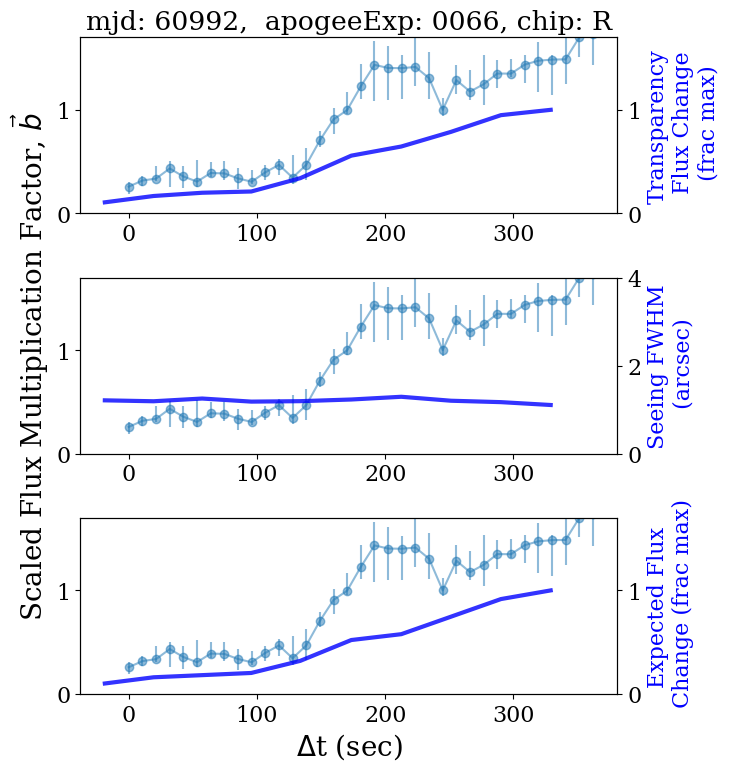

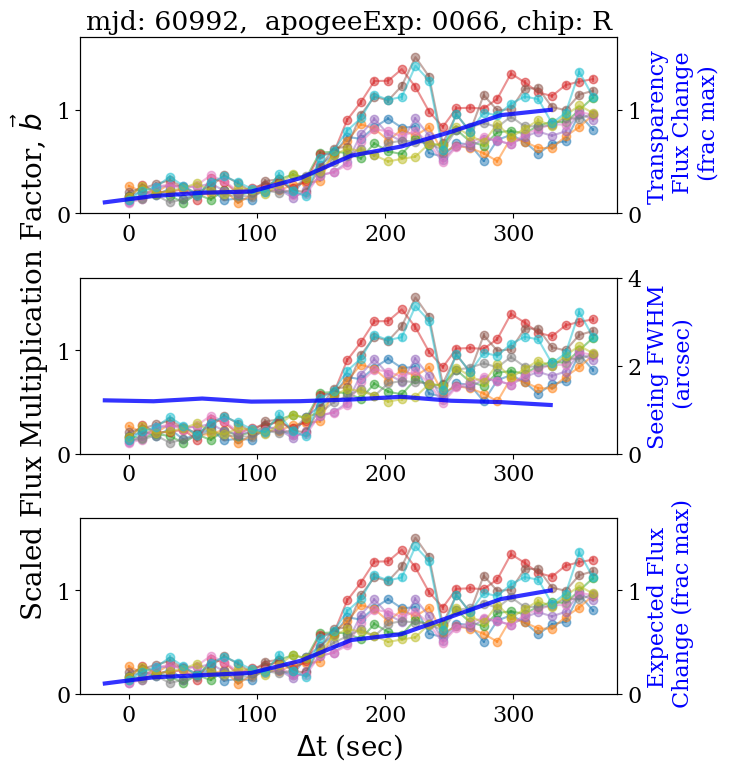

In [322]:
med_b = np.nanmedian(all_b_vects*all_b_vect_scales[:,None],axis=0)
med_b_scatter = np.nanpercentile(all_b_vects*all_b_vect_scales[:,None],[16,84],axis=0)

med_b = np.nanmedian(all_b_vects/np.nanmedian(all_b_vects,axis=1)[:,None],axis=0)
med_b_scatter = np.nanpercentile(all_b_vects/np.nanmedian(all_b_vects,axis=1)[:,None],[16,84],axis=0)

yrange = [0,1.7]

show_only_med = False
for show_only_med in [True,False]:
    if show_only_med:
        string_change = '_MED'
    else:
        string_change = ''
    
    
    fig, axs = plt.subplots(3, 1, figsize=(8,8))
    # sns.boxplot(x=_df.dt, y=_df.aperfluxNorm, ax=axs[0])
    
    guider_color = 'grey'
    guider_color = 'k'
    guider_color = 'b'
    # guider_color = 'C0'
    guider_alpha = 1.0
    guider_alpha = 0.8
    alpha = 0.5
    guider_lw = 3
    
    # ax = axs[0].twinx()
    ax = axs[0]
    # ax.set_ylabel("Flux\n Multiplication\n Factor")
    if not show_only_med:
        for key_ind,key in enumerate(result_dict.keys()):
            # ax.plot(apogee_dts, result_dict[key]['b_vect_post'])
            scale = all_b_vect_scales[key_ind]
            # scale = 1/np.nanmedian(result_dict[key]['b_vect_post'])
            ax.errorbar(apogee_dts, result_dict[key]['b_vect_post']*scale, 
                        yerr=result_dict[key]['b_vect_errs']*scale,
                        fmt='-o',alpha=alpha)
    else:
        ax.scatter(apogee_dts, med_b, alpha=0)
        ylim = ax.get_ylim()
        ax.errorbar(apogee_dts, med_b, 
                    yerr=np.abs(med_b_scatter-med_b),
                    fmt='-o',alpha=alpha)
        ax.set_ylim(ylim)
    ax.set_ylim(yrange)
    curr_ylim = ax.get_ylim()
    # ax = axs[0]
    ax = axs[0].twinx()
    # ax.scatter(guider_dts, _df.transpNorm,alpha=0.1,color=guider_color)
    # ax.plot(unique_guider_times, guider_med_aperFlux[:,1],color=guider_color)
    # ax.fill_between(unique_guider_times, 
    #                     guider_med_aperFlux[:,0],
    #                     guider_med_aperFlux[:,2],
    #                     alpha=0.2,color=guider_color)
    ax.plot(guider_dts, _df.transpNorm,color=guider_color,lw=guider_lw,alpha=guider_alpha)
    # plt.errorbar(apogee_dts,comb_final_mean,yerr=np.sqrt(np.diag(comb_final_cov)),
    #              color='red',fmt='-o',alpha=1.0)
    
    ax.set_ylabel("Transparency\n Flux Change\n (frac max)",color=guider_color)
    ax.set_ylim(curr_ylim)
    ax.set_xlabel("")
    ax.set_title("mjd: %d,  apogeeExp: %s, chip: %s"%(mjd, expid, chip))
    
    # ax = axs[1]
    ax = axs[1].twinx()
    ax.plot(guider_dts, _df.fwhm_fit,
                color=guider_color,lw=guider_lw,alpha=guider_alpha)
    ax.set_ylabel("Seeing FWHM\n (arcsec)",color=guider_color)
    ax.set_ylim([0, 4])    
    # ax = axs[1].twinx()
    ax = axs[1]
    # ax.set_ylabel("Flux\n Multiplication\n Factor")
    ax.set_ylabel(r"Scaled Flux Multiplication Factor, $\vec b$",fontsize=20)
    if not show_only_med:
        for key_ind,key in enumerate(result_dict.keys()):
            # ax.plot(apogee_dts, result_dict[key]['b_vect_post'])
            scale = all_b_vect_scales[key_ind]
            # scale = 1/np.nanmedian(result_dict[key]['b_vect_post'])
            ax.errorbar(apogee_dts, result_dict[key]['b_vect_post']*scale, 
                        yerr=result_dict[key]['b_vect_errs']*scale,
                        fmt='-o',alpha=alpha)
    else:
        ax.scatter(apogee_dts, med_b, alpha=0)
        ylim = ax.get_ylim()
        ax.errorbar(apogee_dts, med_b, 
                    yerr=np.abs(med_b_scatter-med_b),
                    fmt='-o',alpha=alpha)
        ax.set_ylim(ylim)
    ax.set_ylim(yrange)
    
    # ax = axs[2]
    ax = axs[2].twinx()
    # ax.plot(guider_dts, _df.guideErr,
    #             color=guider_color)
    # ax.set_ylabel("Guide Error\n (arcsec)")
    ax.plot(guider_dts, _df.fluxNorm,color=guider_color,lw=guider_lw,alpha=guider_alpha)
    ax.set_ylabel("Expected Flux\n Change (frac max)",color=guider_color)
    ax.set_ylim(curr_ylim)
    # ax.set_ylim([0, 0.5])
    # ax = axs[2].twinx()
    ax = axs[2]
    # ax.set_ylabel("Flux\n Multiplication\n Factor")
    if not show_only_med:
        for key_ind,key in enumerate(result_dict.keys()):
            # ax.plot(apogee_dts, result_dict[key]['b_vect_post'])
            scale = all_b_vect_scales[key_ind]
            # scale = 1/np.nanmedian(result_dict[key]['b_vect_post'])
            ax.errorbar(apogee_dts, result_dict[key]['b_vect_post']*scale, 
                        yerr=result_dict[key]['b_vect_errs']*scale,
                        fmt='-o',alpha=alpha)
    else:
        ax.scatter(apogee_dts, med_b, alpha=0)
        ylim = ax.get_ylim()
        ax.errorbar(apogee_dts, med_b, 
                    yerr=np.abs(med_b_scatter-med_b),
                    fmt='-o',alpha=alpha)
        ax.set_ylim(ylim)
    ax.set_ylim(yrange)
    axs[2].set_xlabel(r"$\Delta$t (sec)",fontsize=20)
    
    plt.tight_layout()
    plt.savefig(f'{plotpath}guiderComp_{tele}_mjd{mjd}_expID{expid}_chip{chip}{string_change}.png')
    plt.show()
    


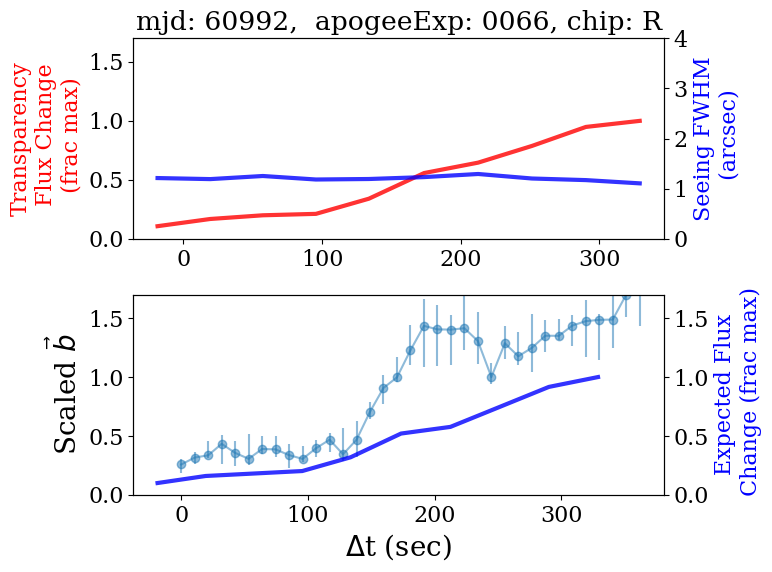

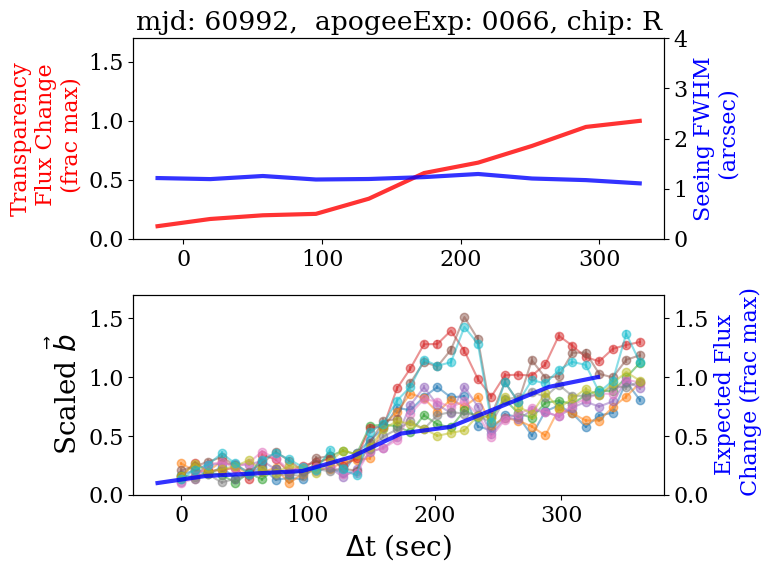

In [323]:
med_b = np.nanmedian(all_b_vects*all_b_vect_scales[:,None],axis=0)
med_b_scatter = np.nanpercentile(all_b_vects*all_b_vect_scales[:,None],[16,84],axis=0)

med_b = np.nanmedian(all_b_vects/np.nanmedian(all_b_vects,axis=1)[:,None],axis=0)
med_b_scatter = np.nanpercentile(all_b_vects/np.nanmedian(all_b_vects,axis=1)[:,None],[16,84],axis=0)

yrange = [0,1.7]

show_only_med = False
for show_only_med in [True,False]:
    if show_only_med:
        string_change = '_MED'
    else:
        string_change = ''
    
    
    fig, axs = plt.subplots(2, 1, figsize=(8,6))
    # sns.boxplot(x=_df.dt, y=_df.aperfluxNorm, ax=axs[0])
    
    guider_color = 'grey'
    guider_color = 'k'
    guider_color = 'b'
    guider_color2 = 'r'
    # guider_color = 'C0'
    guider_alpha = 1.0
    guider_alpha = 0.8
    alpha = 0.5
    guider_lw = 3
    
    # ax = axs[0].twinx()
    ax = axs[0]
    ax.plot(guider_dts, _df.transpNorm,color=guider_color2,lw=guider_lw,alpha=guider_alpha)
    # plt.errorbar(apogee_dts,comb_final_mean,yerr=np.sqrt(np.diag(comb_final_cov)),
    #              color='red',fmt='-o',alpha=1.0)
    
    ax.set_xlabel("")
    ax.set_title("mjd: %d,  apogeeExp: %s, chip: %s"%(mjd, expid, chip))
    ax.set_ylabel("Transparency\n Flux Change\n (frac max)",color=guider_color2)
    ax.set_ylim(yrange)

    ax = axs[0].twinx()
    
    ax.plot(guider_dts, _df.fwhm_fit,
                color=guider_color,lw=guider_lw,alpha=guider_alpha)
    ax.set_ylabel("Seeing FWHM\n (arcsec)",color=guider_color)
    ax.set_ylim([0, 4])    

    
    ax = axs[1]
    # ax.set_ylabel("Flux\n Multiplication\n Factor")
    # ax.set_ylabel(r"Scaled Flux Multiplication Factor, $\vec b$",fontsize=20)
    ax.set_ylabel(r"Scaled $\vec b$",fontsize=20)
    if not show_only_med:
        for key_ind,key in enumerate(result_dict.keys()):
            # ax.plot(apogee_dts, result_dict[key]['b_vect_post'])
            scale = all_b_vect_scales[key_ind]
            # scale = 1/np.nanmedian(result_dict[key]['b_vect_post'])
            ax.errorbar(apogee_dts, result_dict[key]['b_vect_post']*scale, 
                        yerr=result_dict[key]['b_vect_errs']*scale,
                        fmt='-o',alpha=alpha)
    else:
        ax.scatter(apogee_dts, med_b, alpha=0)
        ylim = ax.get_ylim()
        ax.errorbar(apogee_dts, med_b, 
                    yerr=np.abs(med_b_scatter-med_b),
                    fmt='-o',alpha=alpha)
        ax.set_ylim(ylim)
    ax.set_ylim(yrange)
    
    ax = axs[1].twinx()
    # ax.plot(guider_dts, _df.guideErr,
    #             color=guider_color)
    # ax.set_ylabel("Guide Error\n (arcsec)")
    ax.plot(guider_dts, _df.fluxNorm,color=guider_color,lw=guider_lw,alpha=guider_alpha)
    ax.set_ylabel("Expected Flux\n Change (frac max)",color=guider_color)
    ax.set_ylim(curr_ylim)
    axs[1].set_xlabel(r"$\Delta$t (sec)",fontsize=20)
    
    plt.tight_layout()
    plt.savefig(f'{plotpath}guiderComp_{tele}_mjd{mjd}_expID{expid}_chip{chip}{string_change}.png')
    plt.show()
    


<KeysViewHDF5 ['CRimage', 'amp_off_vec', 'chisqimage', 'dimage', 'gainMat', 'ivarimage', 'last_unsaturated', 'metadata', 'outdat', 'readVarMat', 'ref_zpt_out', 'sci_zpt_out']>
Current fiber index: 19
Current fiber type: sky
Current fiber median flux: 1.48


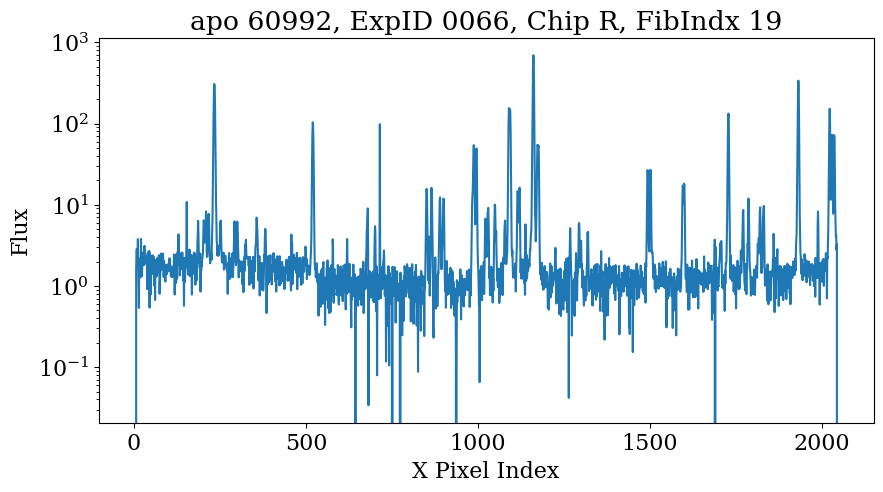

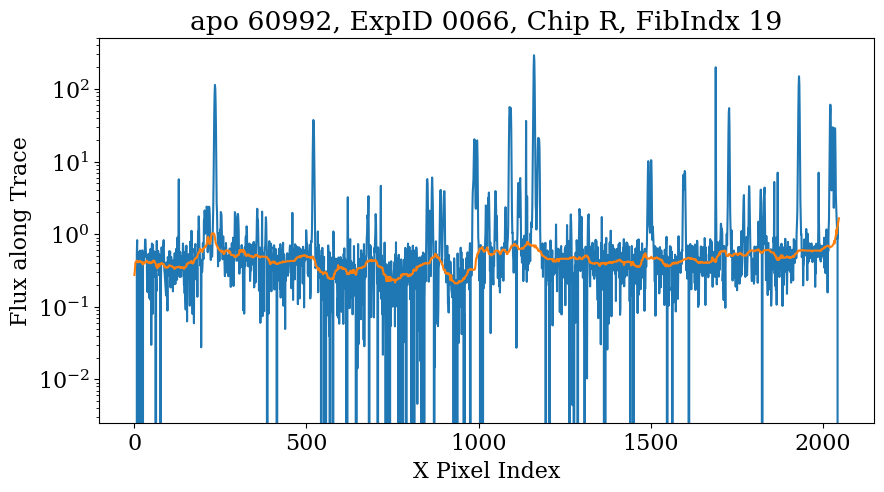

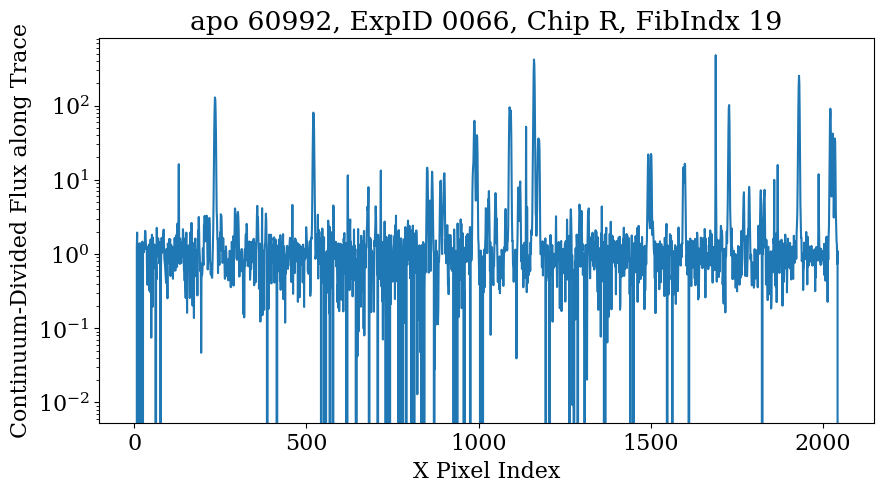

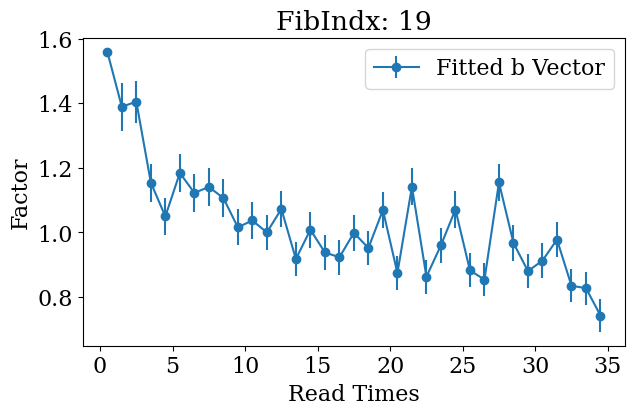

Current fiber index: 21
Current fiber type: sky
Current fiber median flux: 1.46


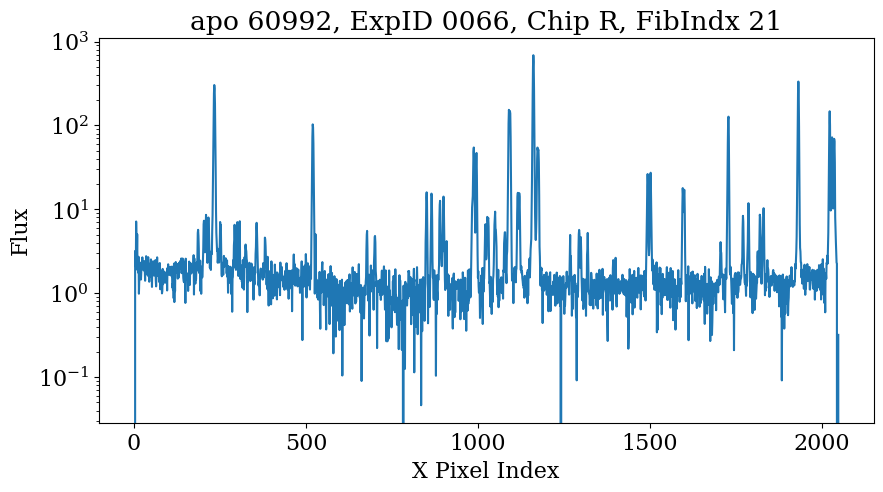

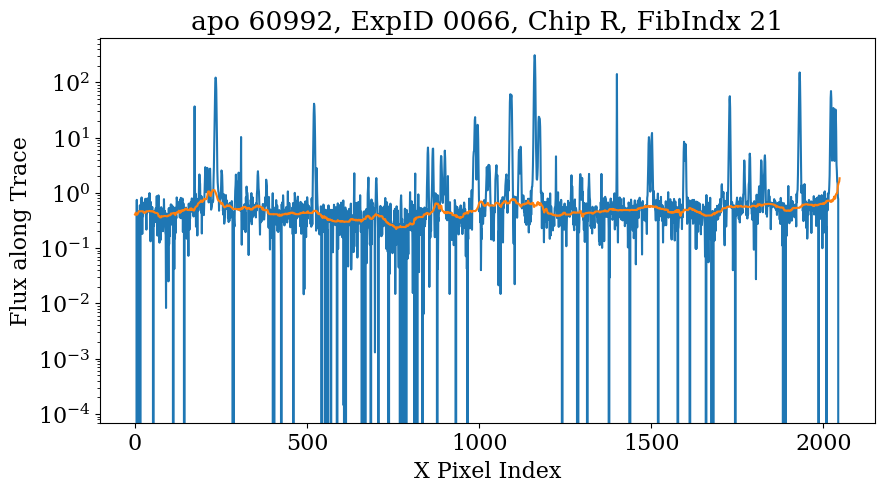

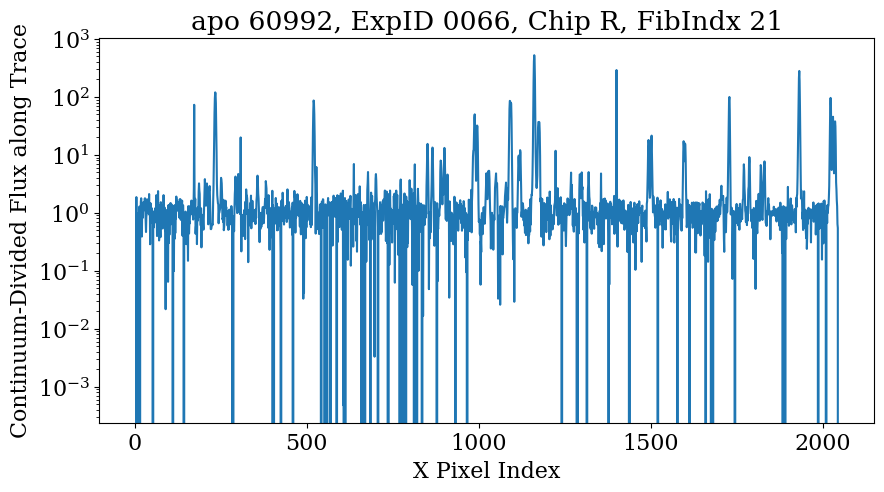

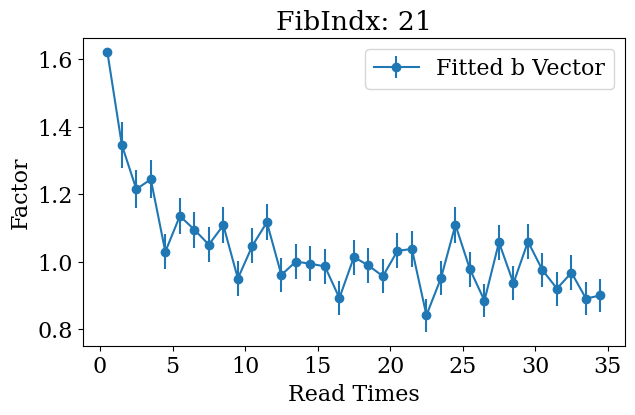

Current fiber index: 259
Current fiber type: sky
Current fiber median flux: 1.19


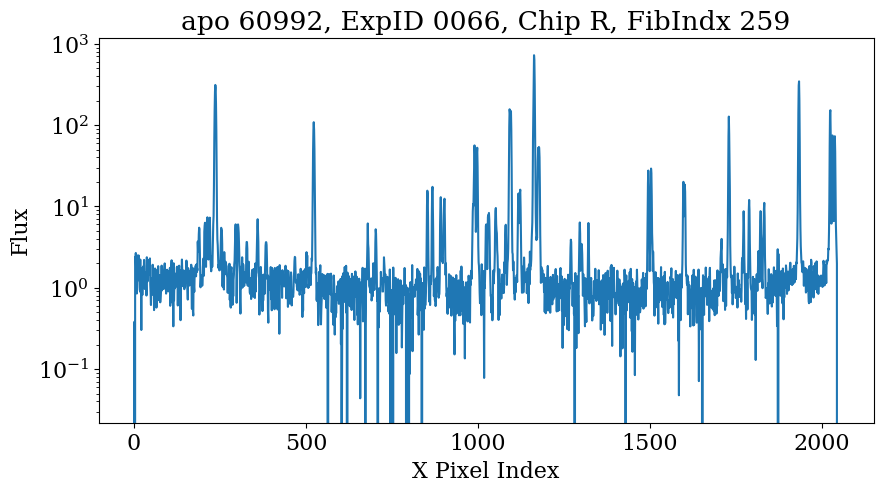

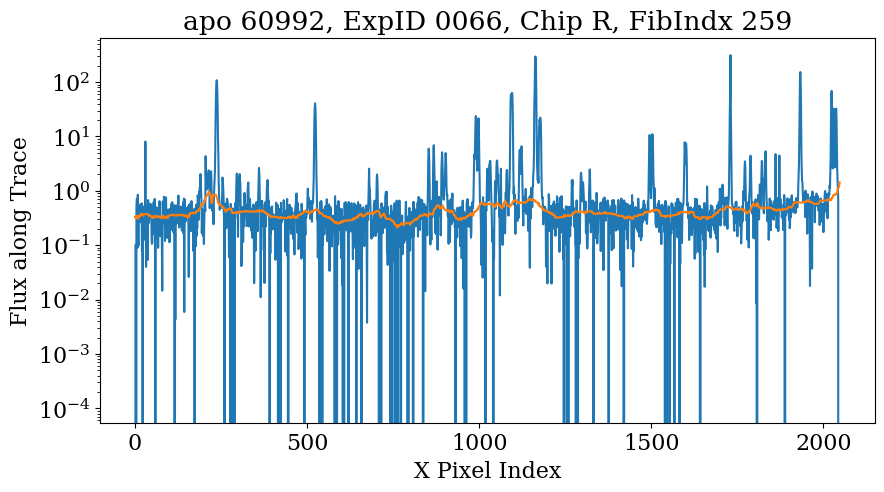

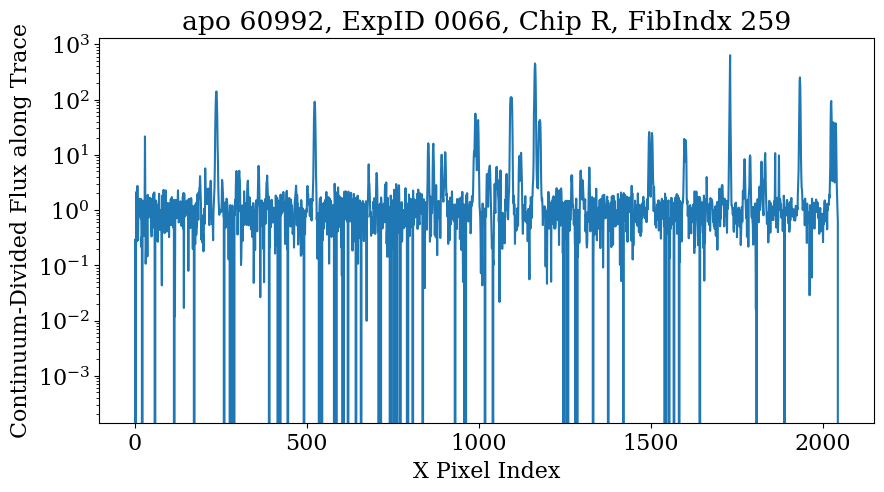

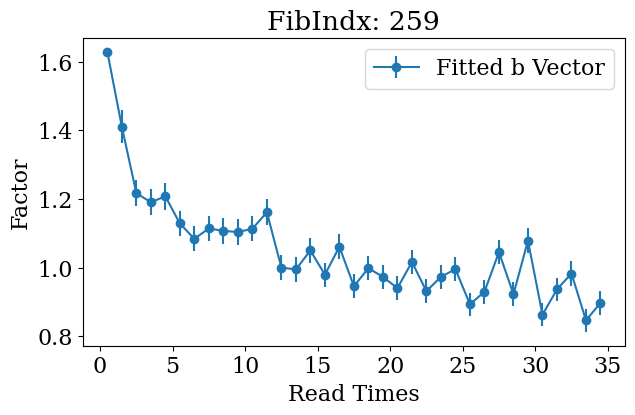

Current fiber index: 29
Current fiber type: sky
Current fiber median flux: 1.17


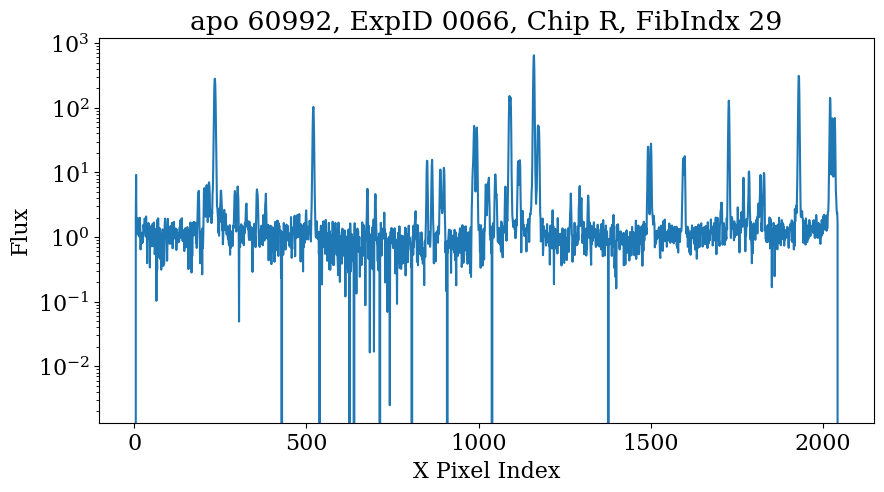

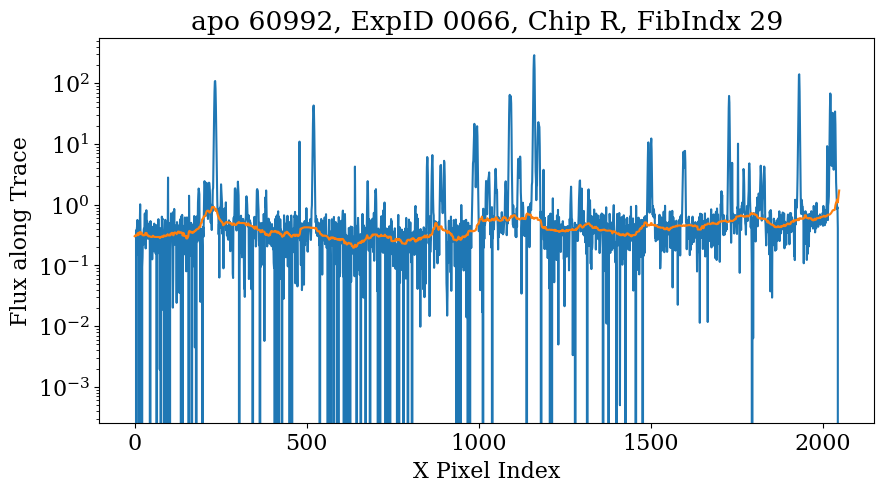

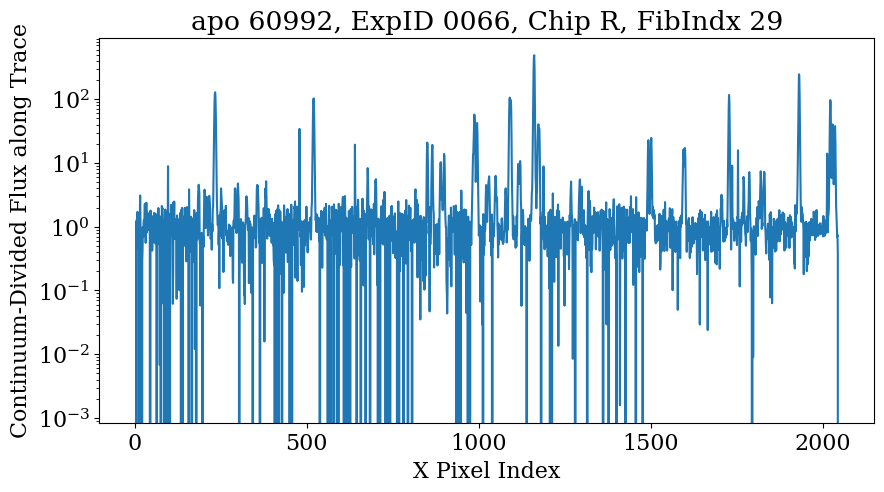

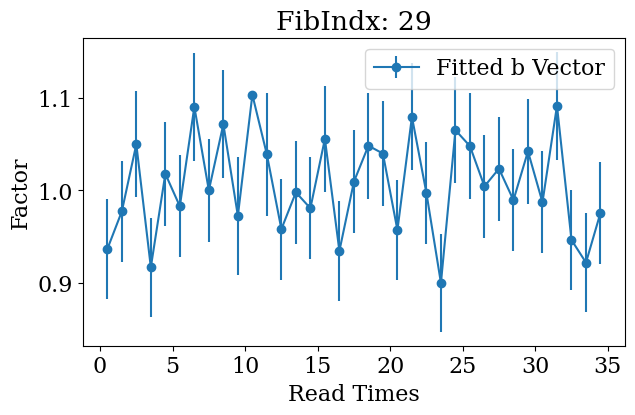

Current fiber index: 219
Current fiber type: sky
Current fiber median flux: 1.14


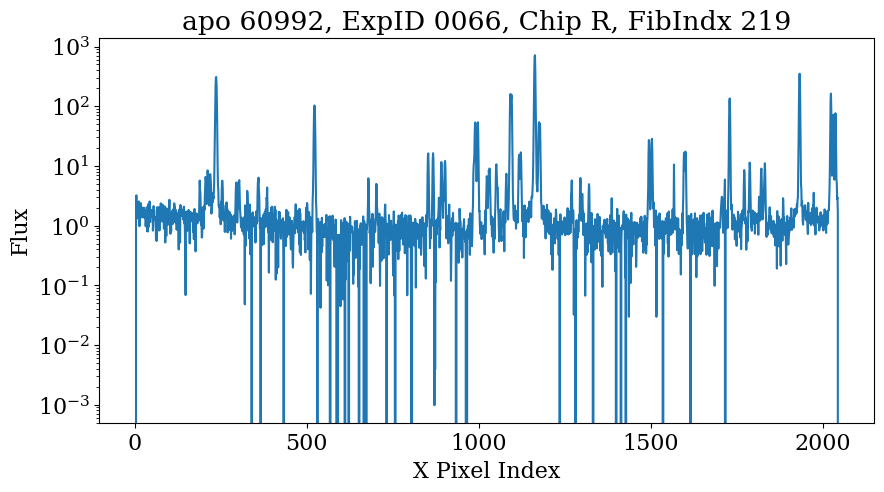

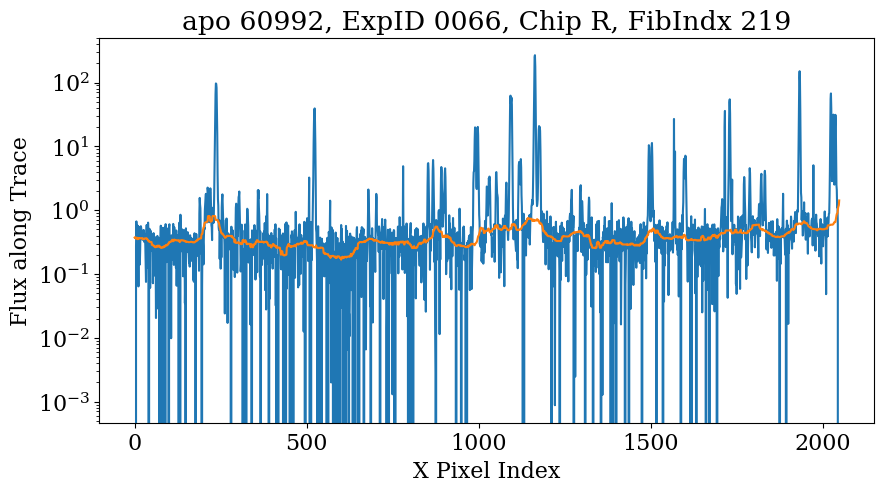

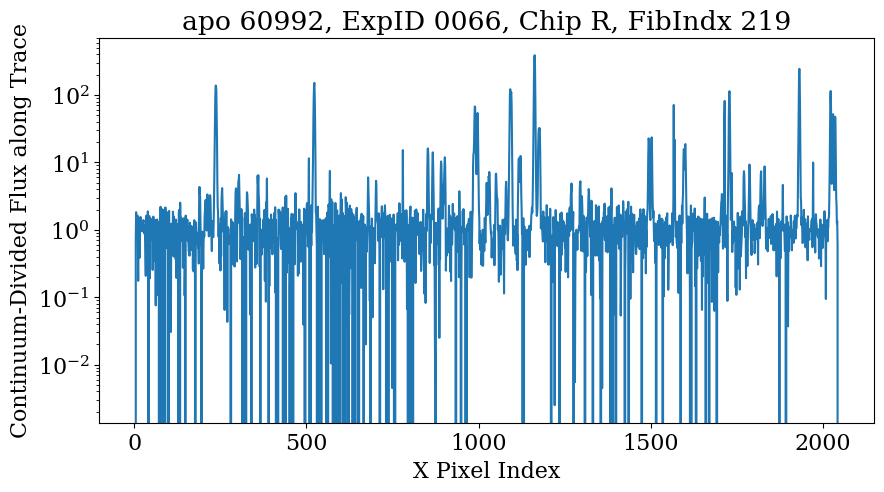

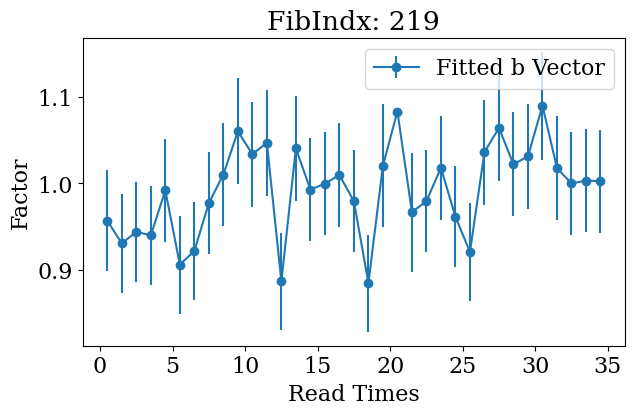

Current fiber index: 203
Current fiber type: sky
Current fiber median flux: 1.12


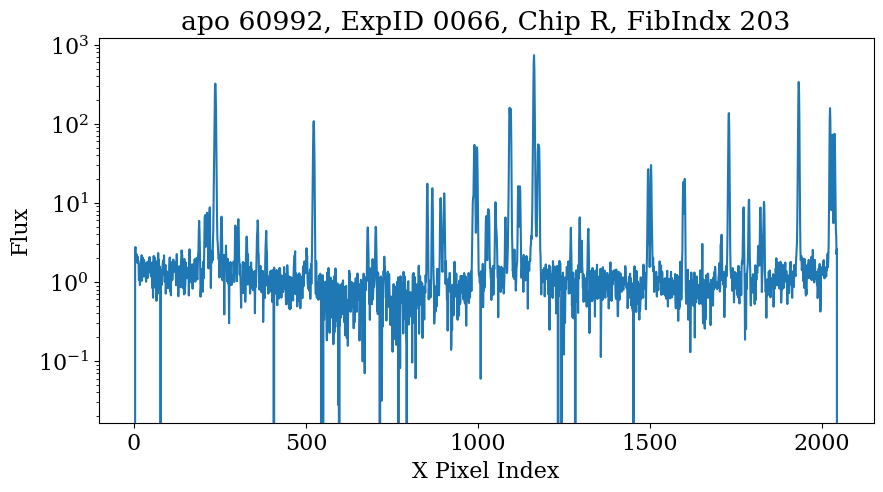

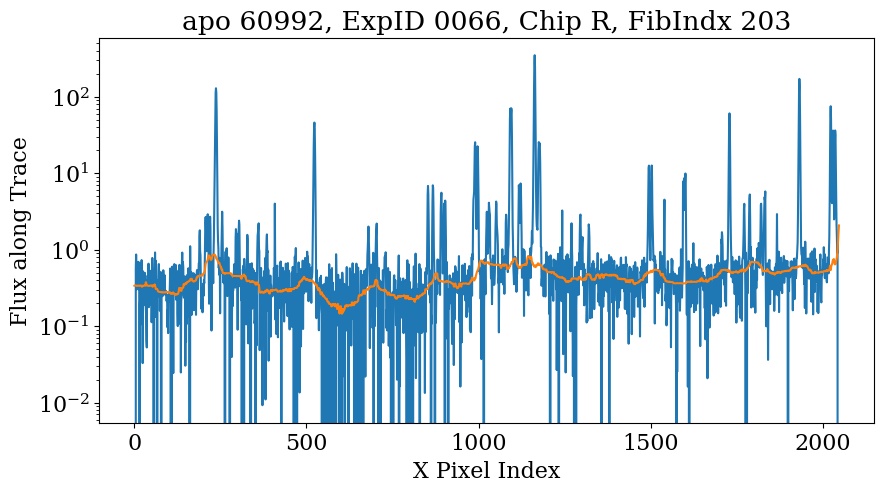

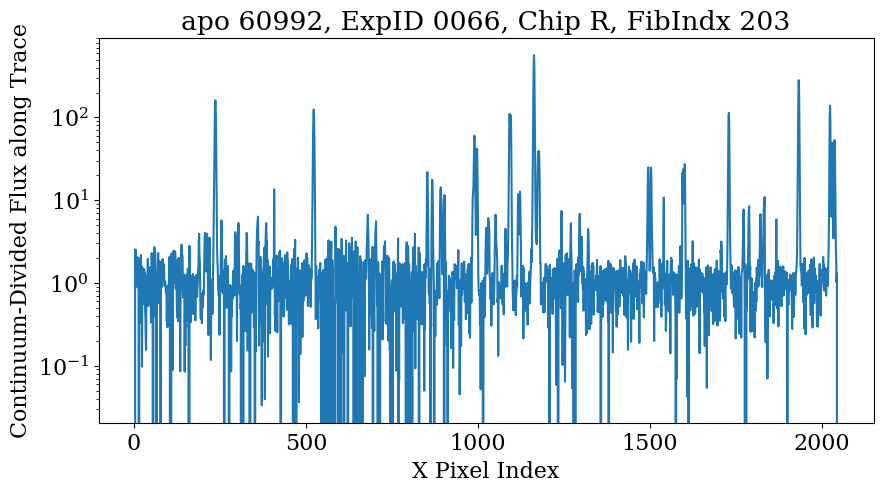

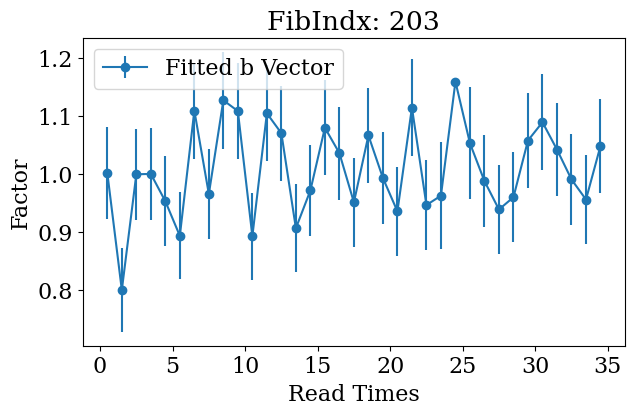

Current fiber index: 90
Current fiber type: sky
Current fiber median flux: 1.1


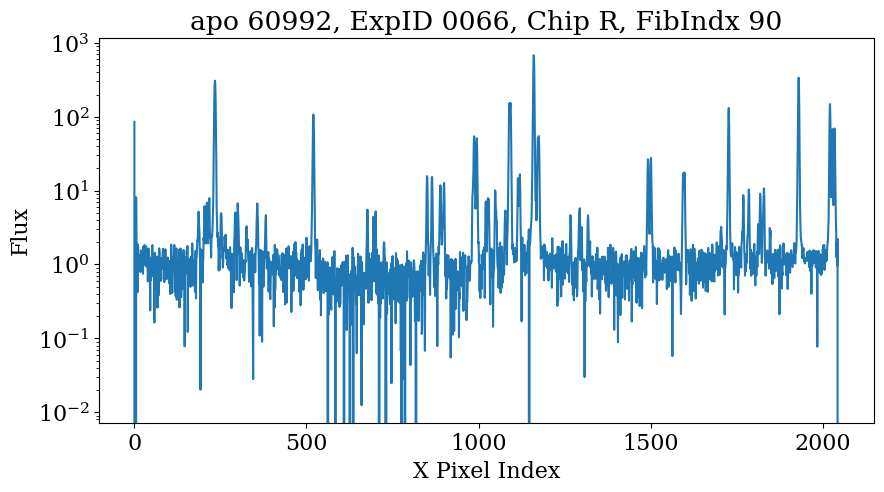

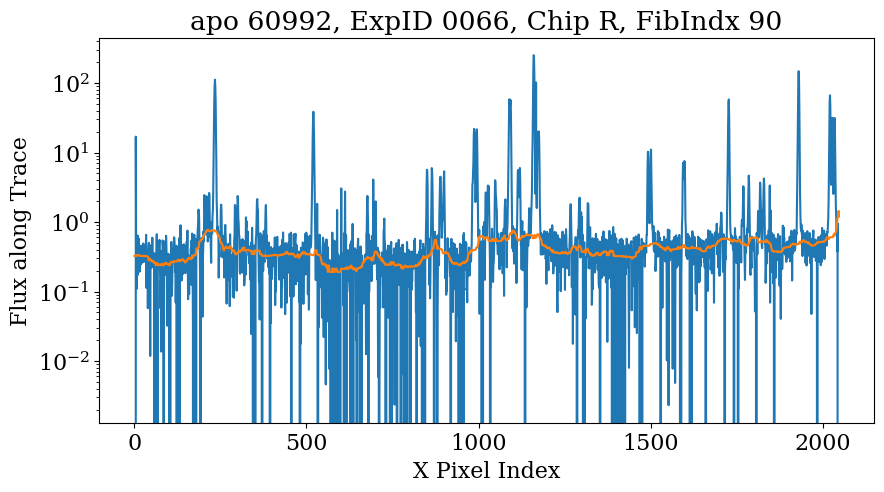

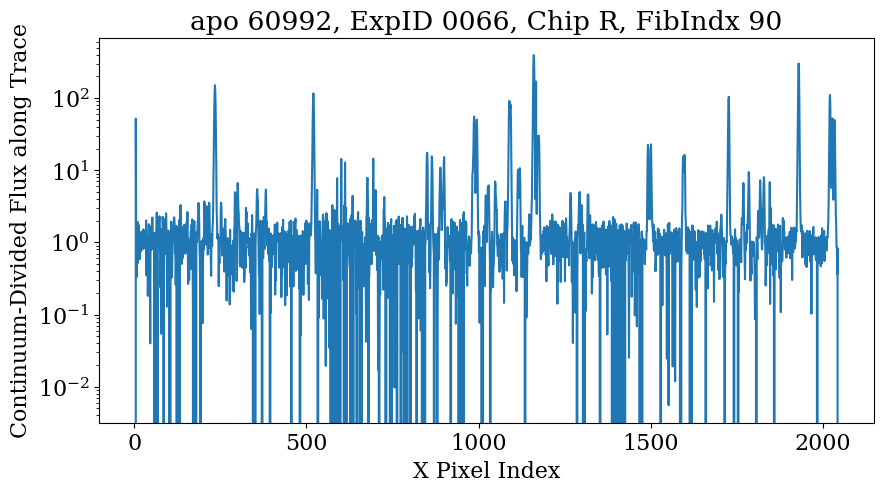

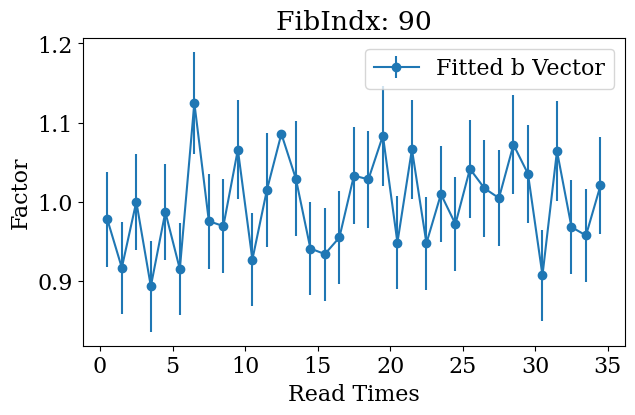

Current fiber index: 99
Current fiber type: sky
Current fiber median flux: 1.08


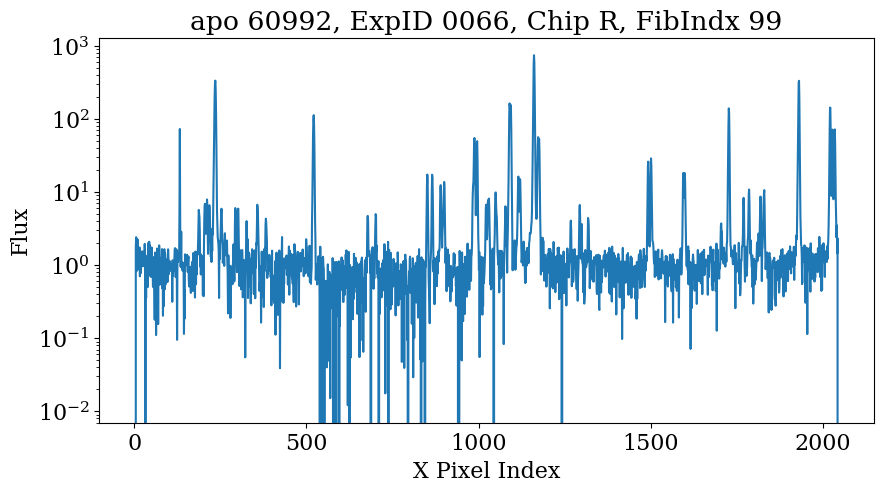

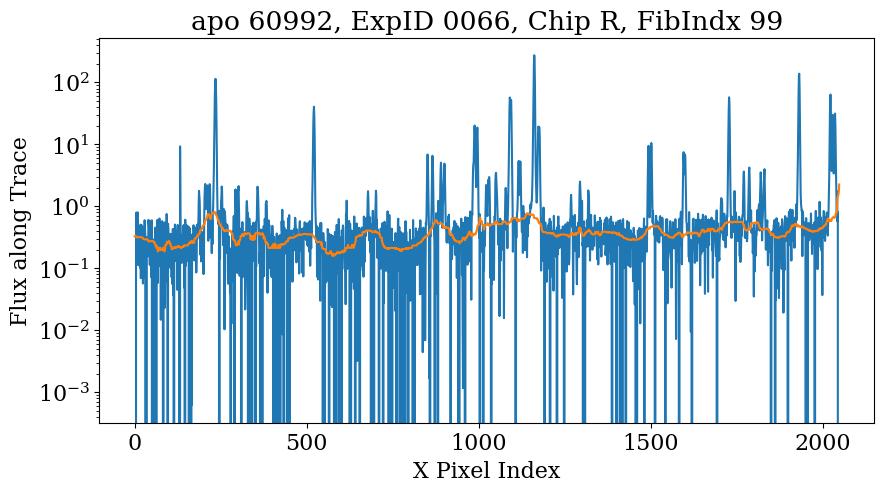

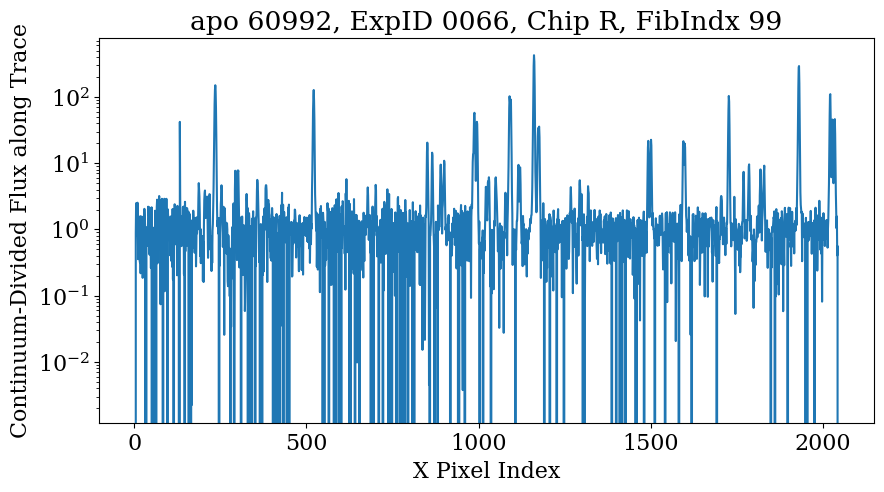

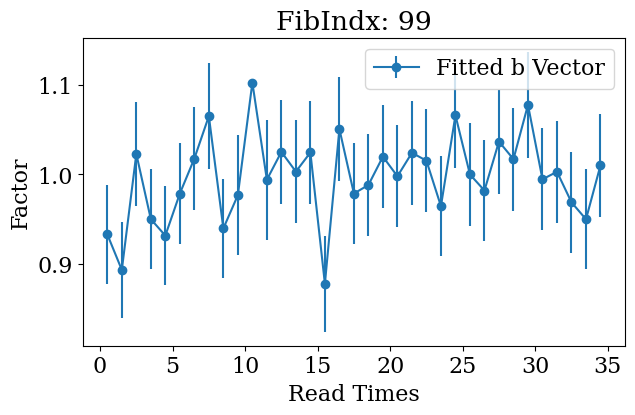

Current fiber index: 229
Current fiber type: sky
Current fiber median flux: 1.08


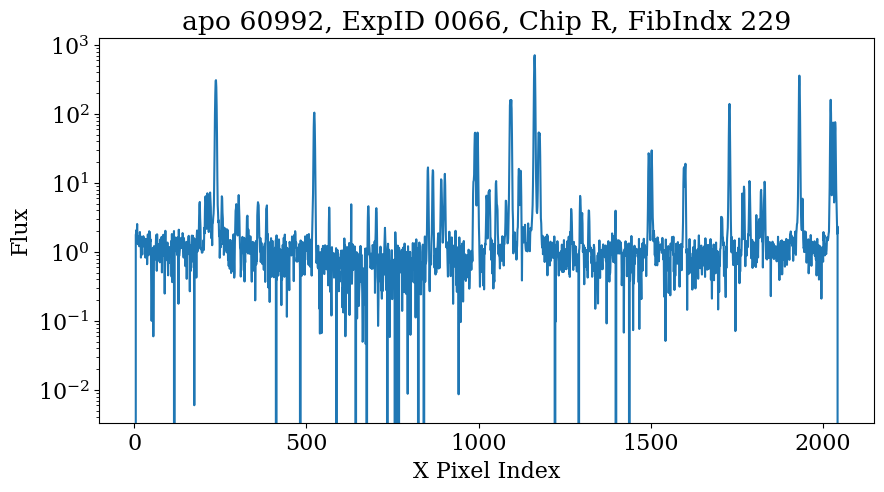

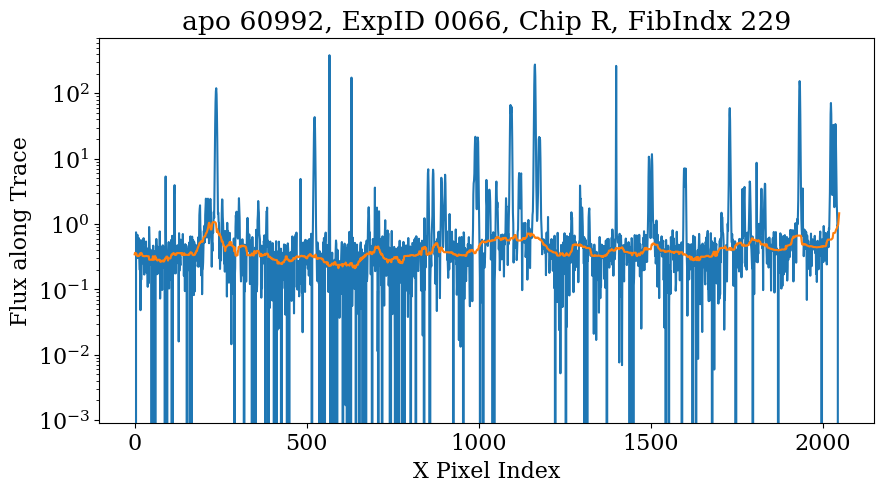

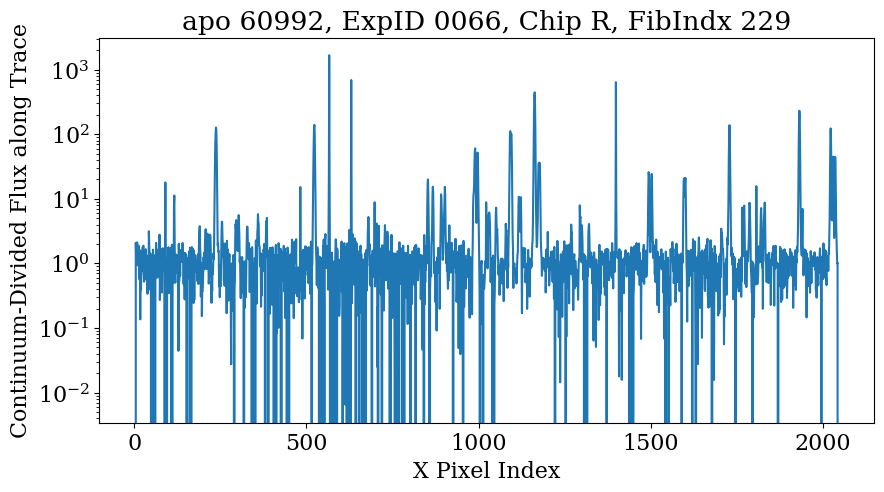

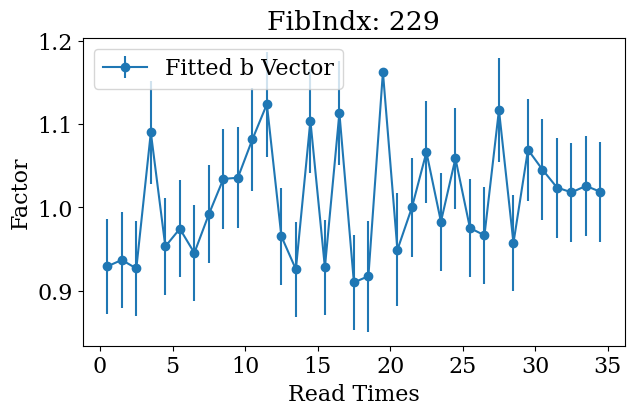

Current fiber index: 263
Current fiber type: sky
Current fiber median flux: 1.07


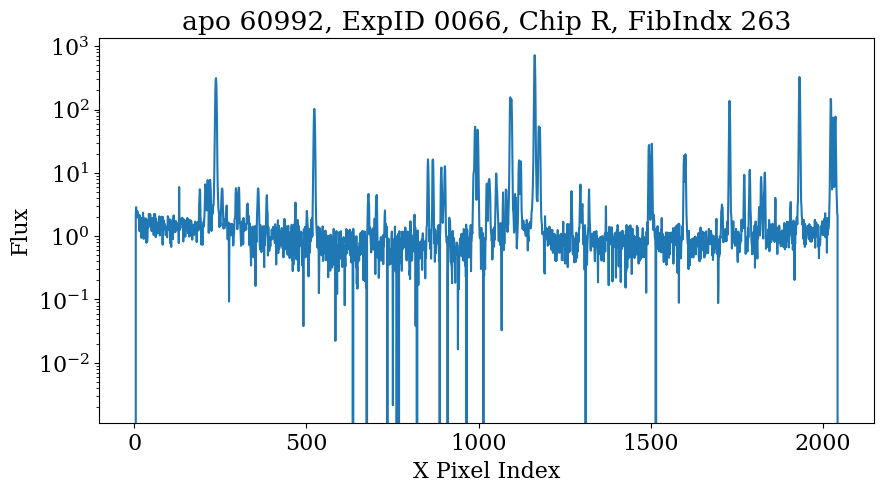

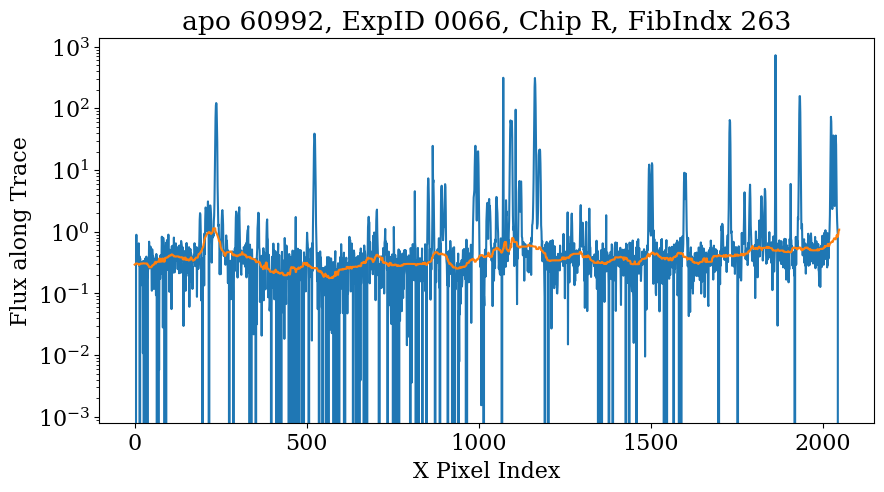

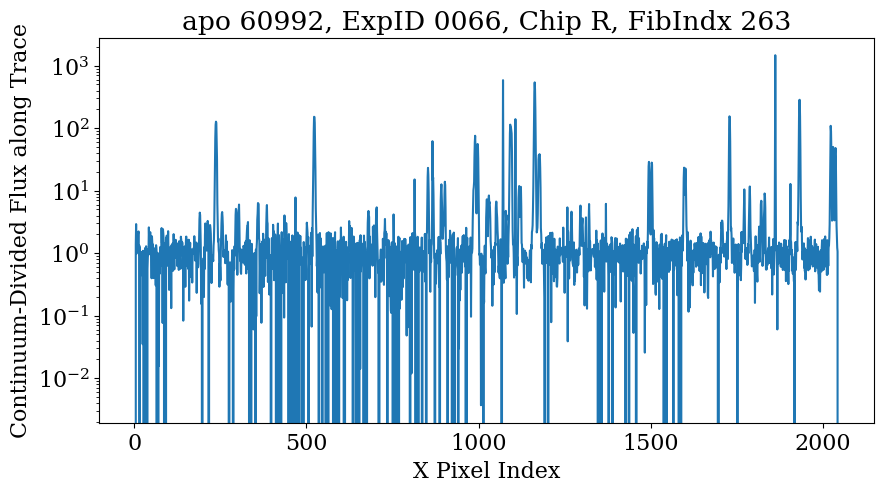

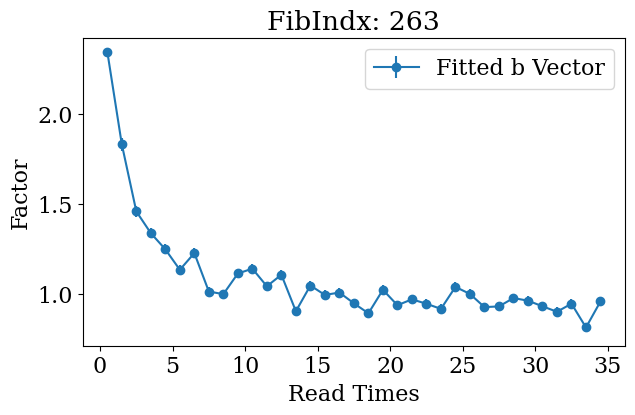

Current fiber index: 142
Current fiber type: sky
Current fiber median flux: 1.07


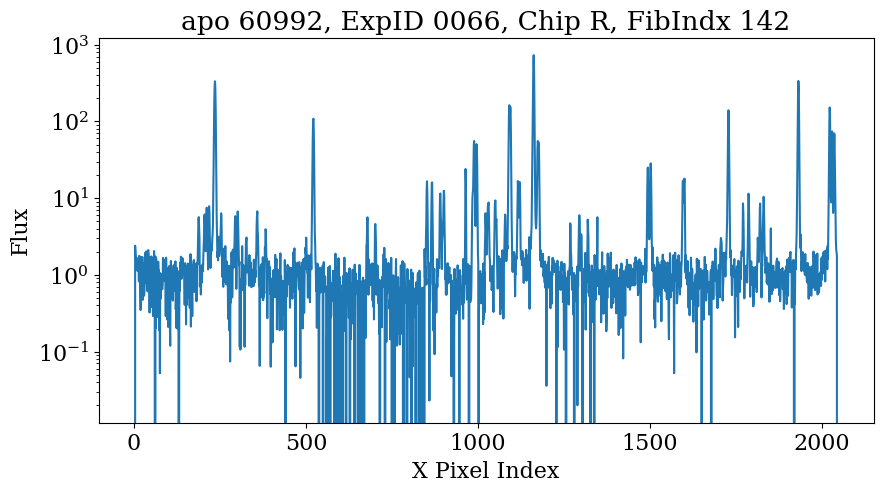

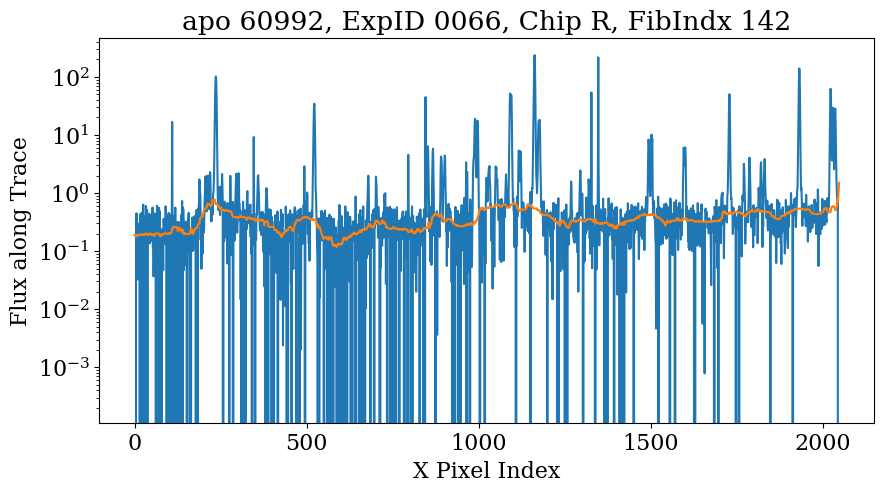

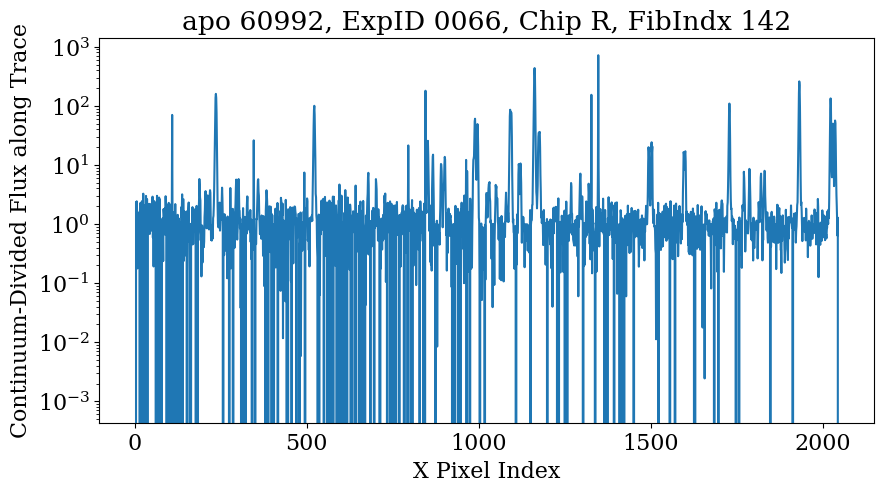

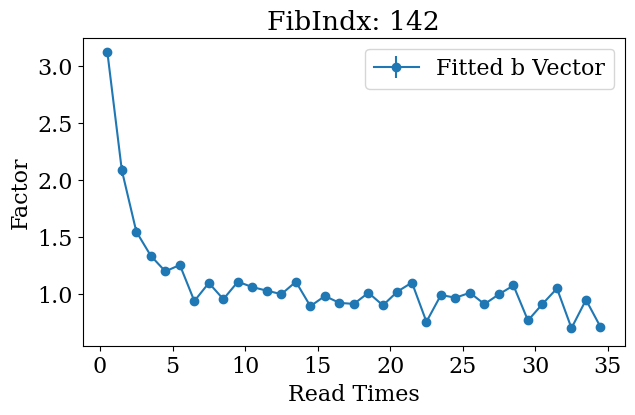

Current fiber index: 238
Current fiber type: sky
Current fiber median flux: 1.06


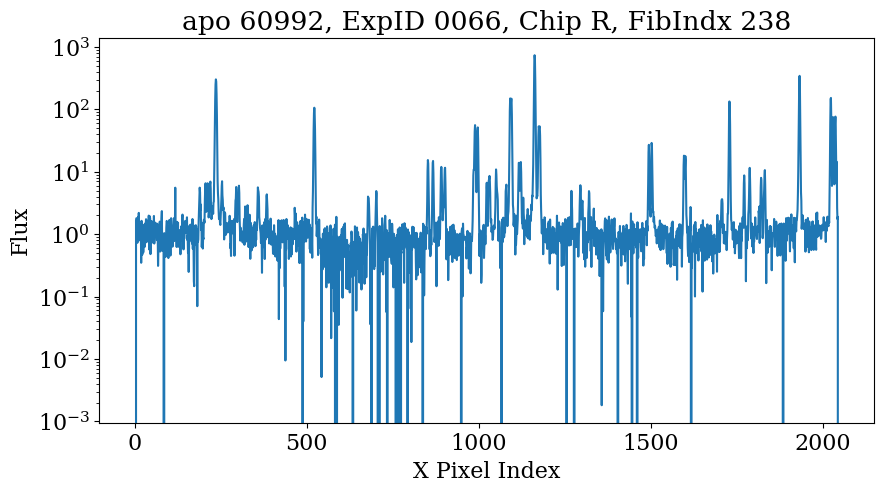

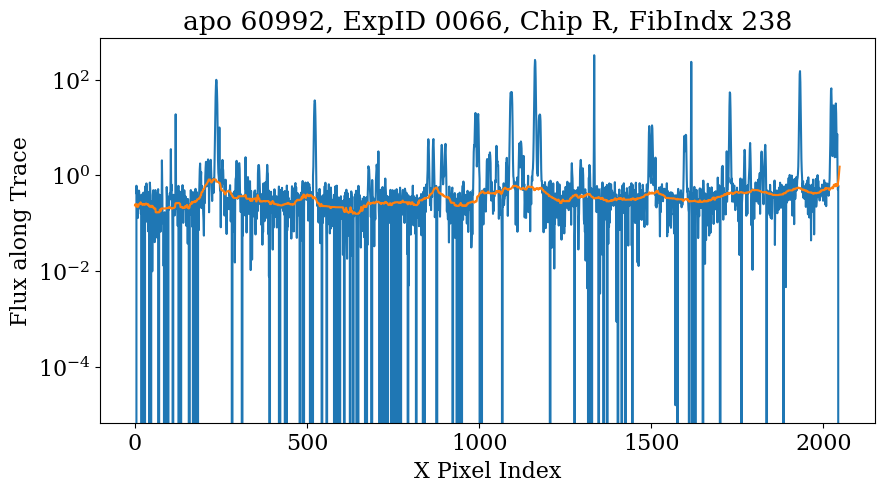

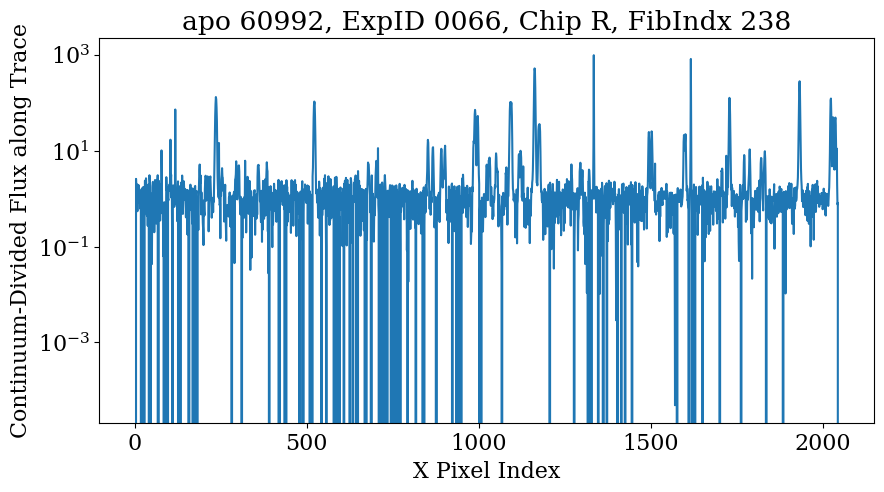

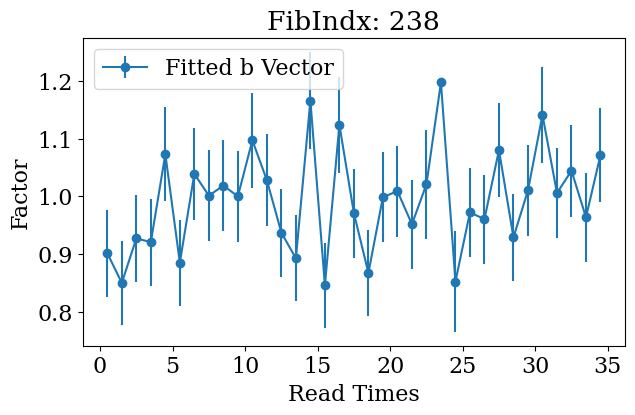

Current fiber index: 87
Current fiber type: sky
Current fiber median flux: 1.06


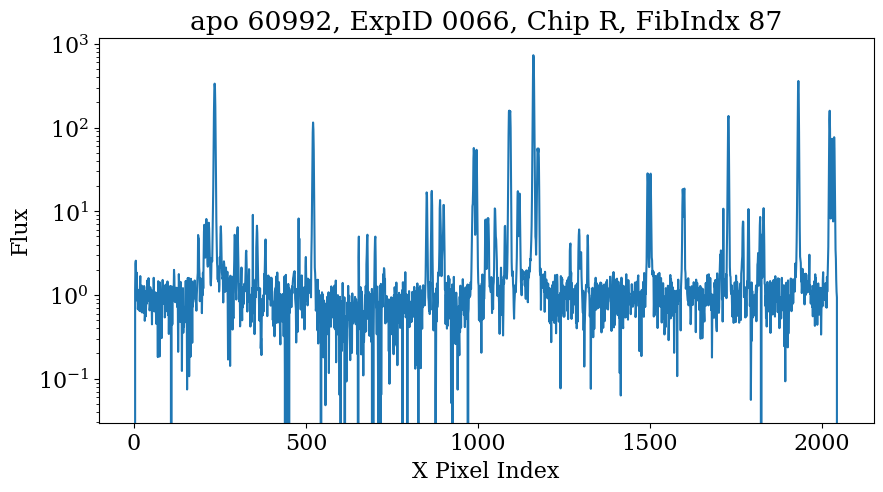

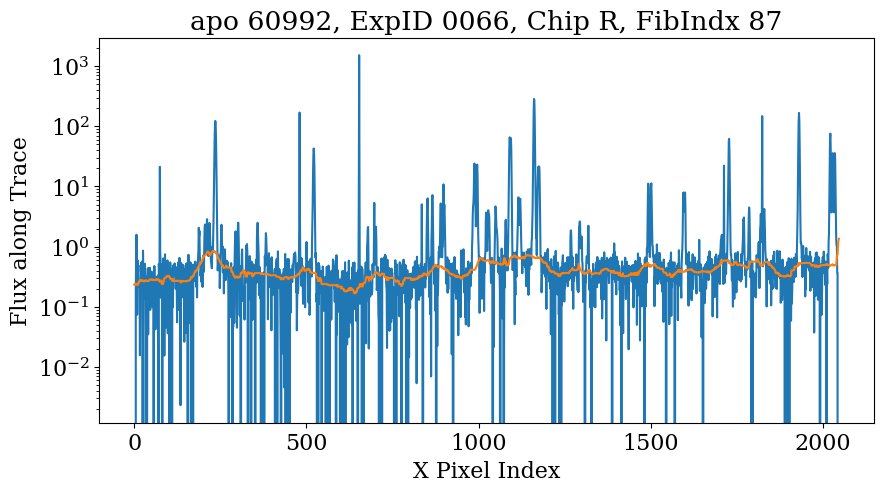

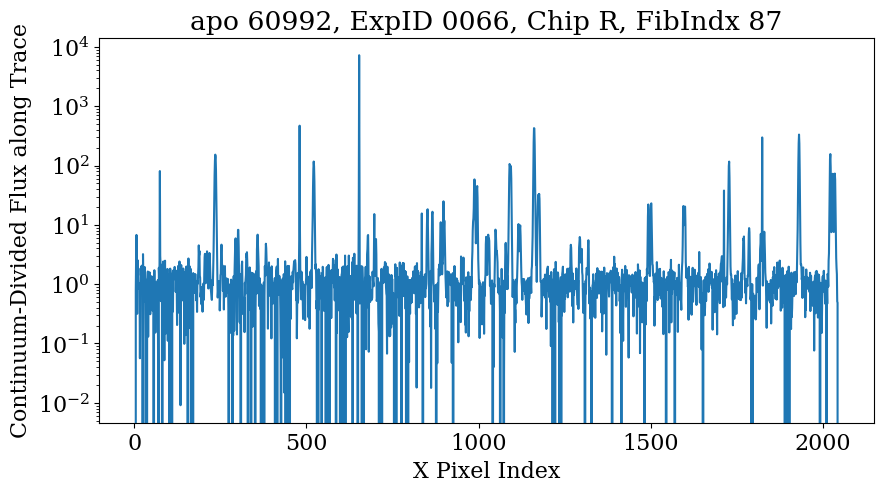

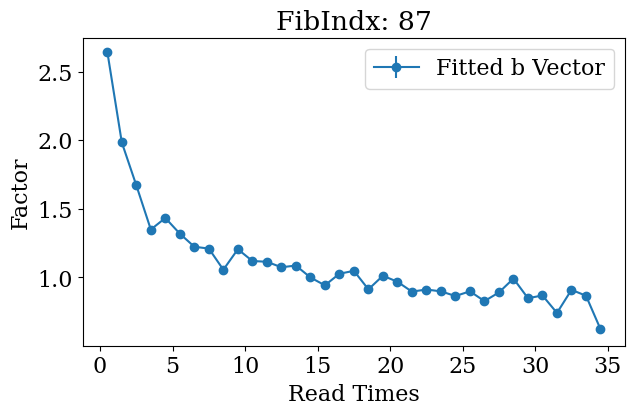

Current fiber index: 49
Current fiber type: sky
Current fiber median flux: 1.05


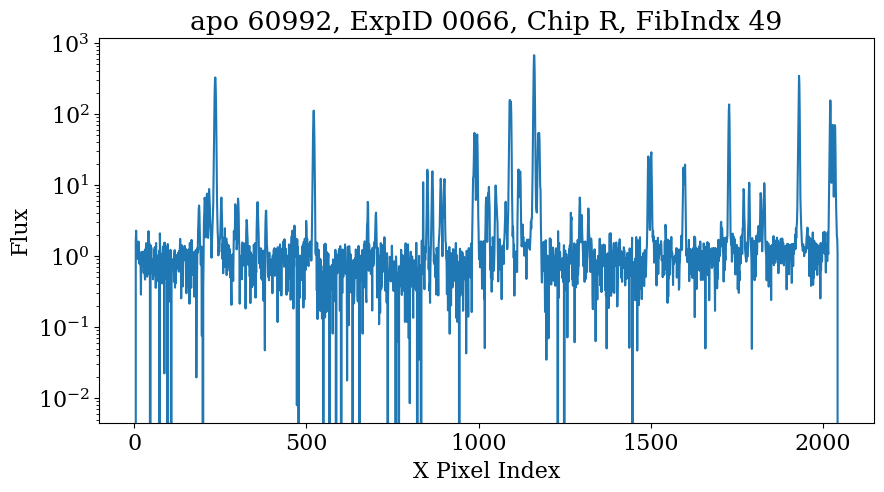

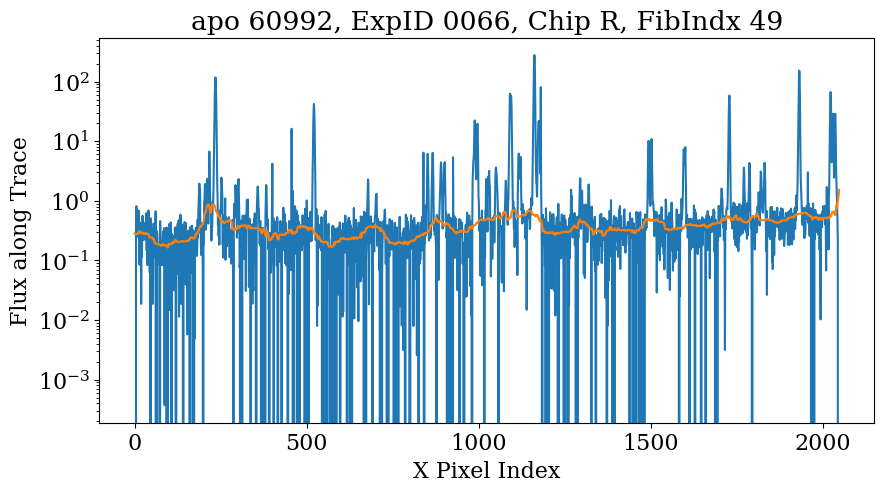

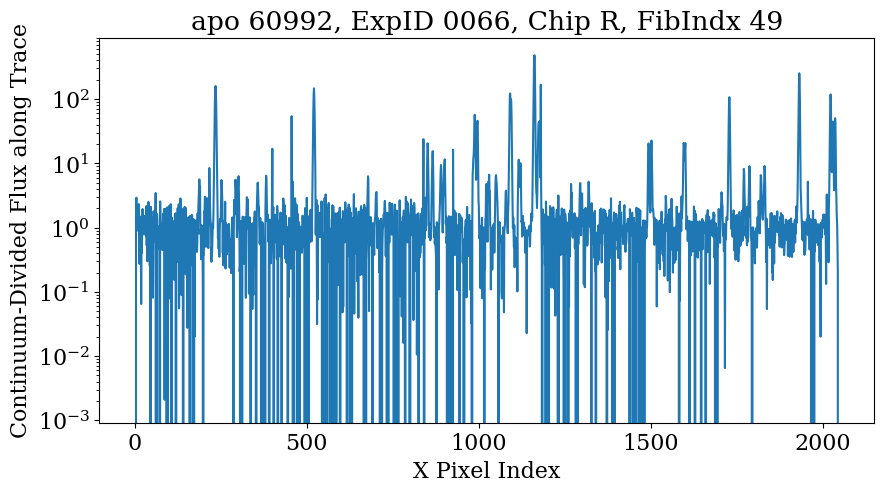

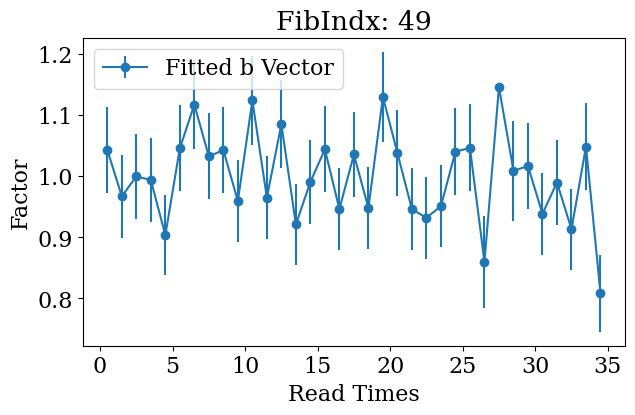

Current fiber index: 71
Current fiber type: sky
Current fiber median flux: 1.04


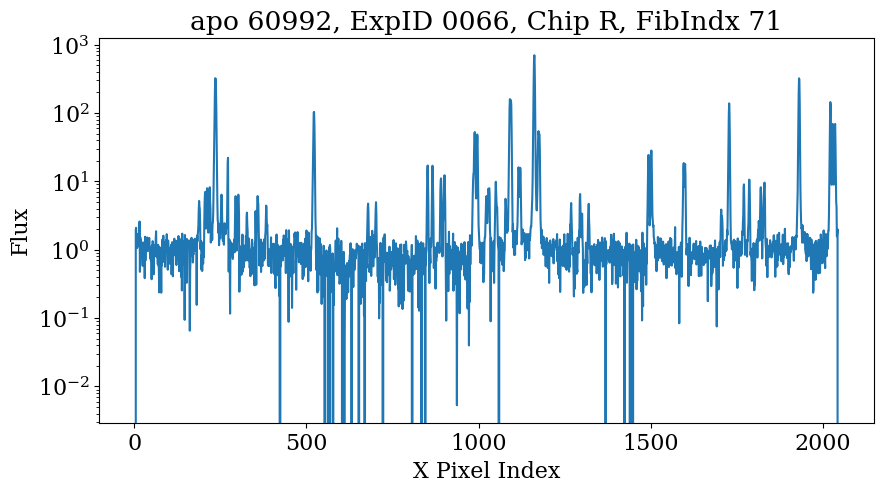

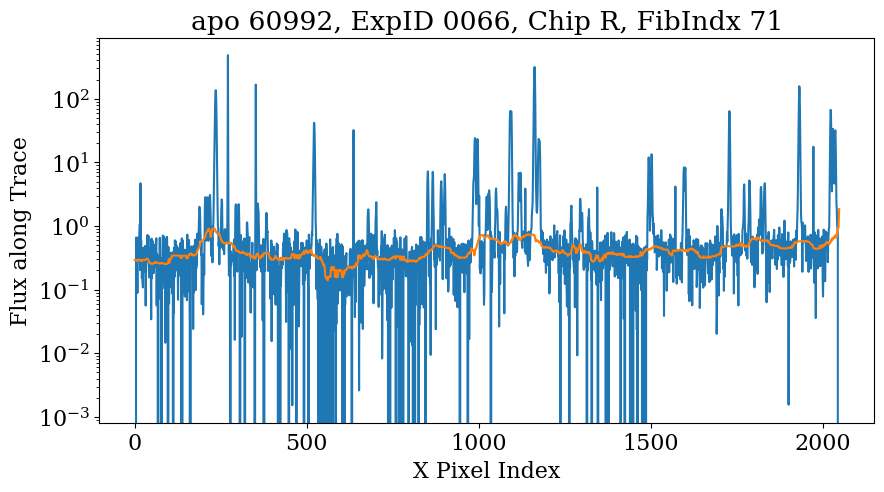

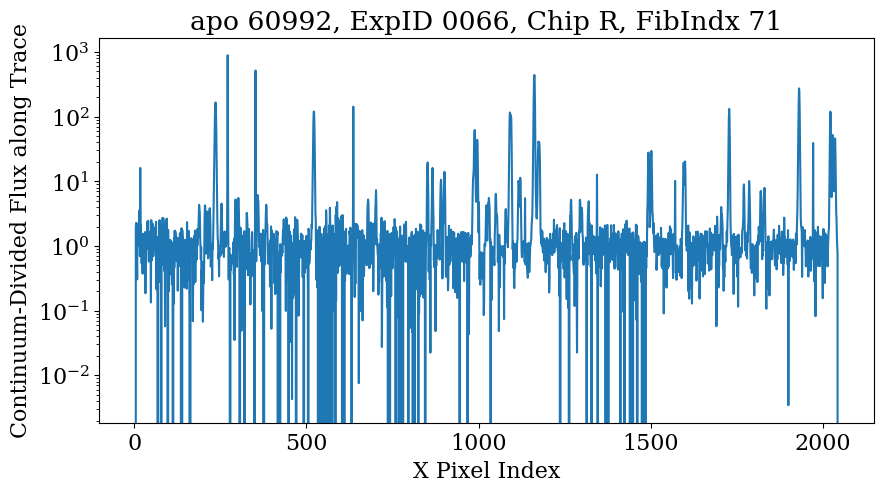

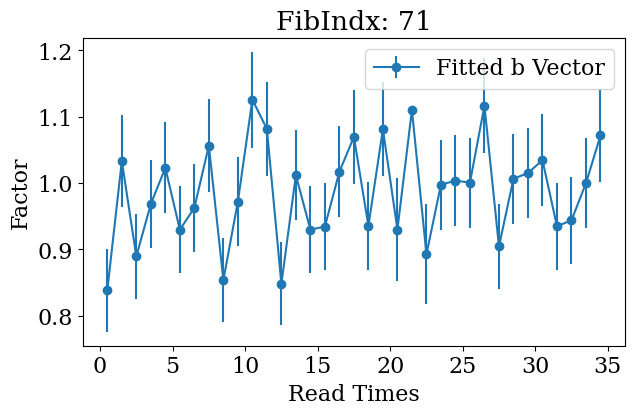

Current fiber index: 215
Current fiber type: sky
Current fiber median flux: 1.03


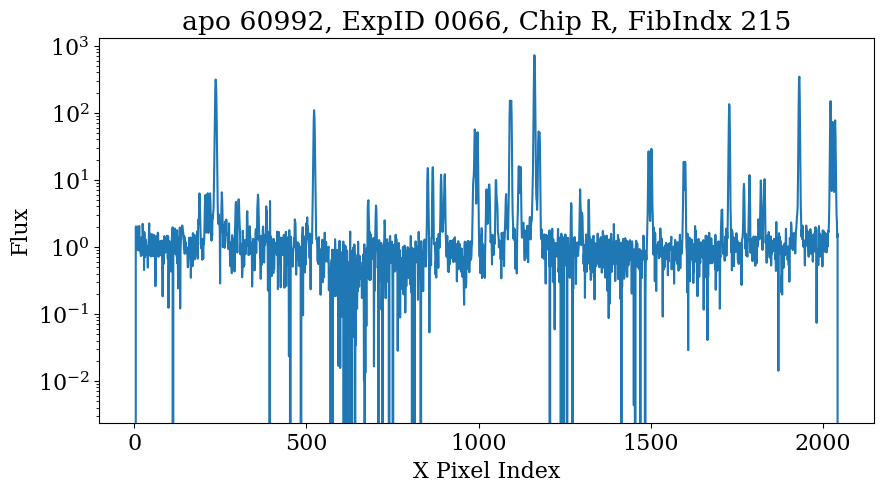

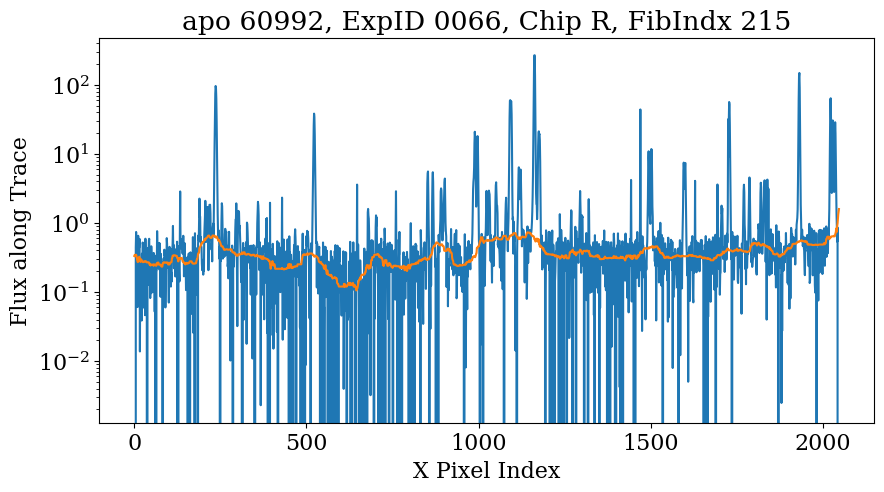

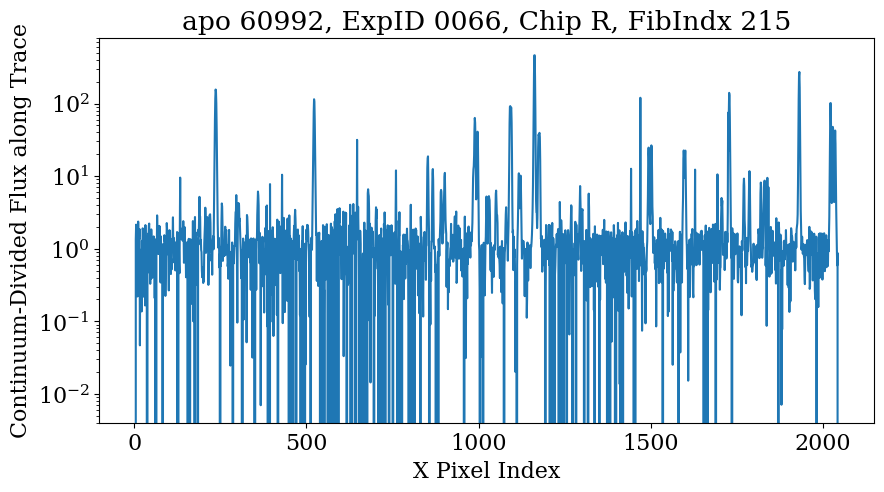

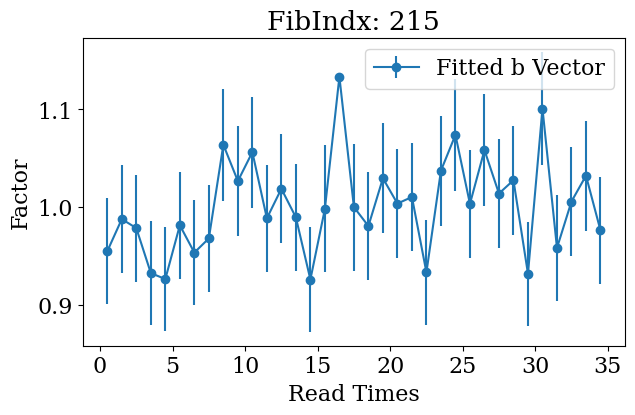

Current fiber index: 218
Current fiber type: sky
Current fiber median flux: 1.01


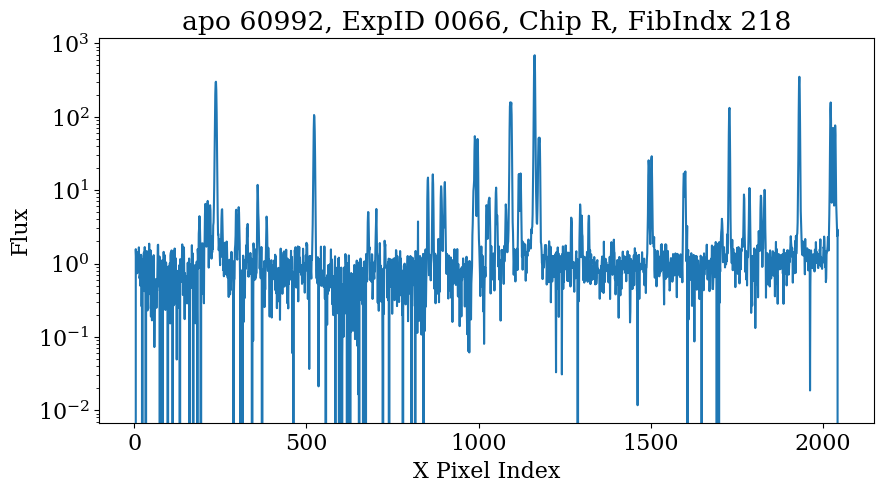

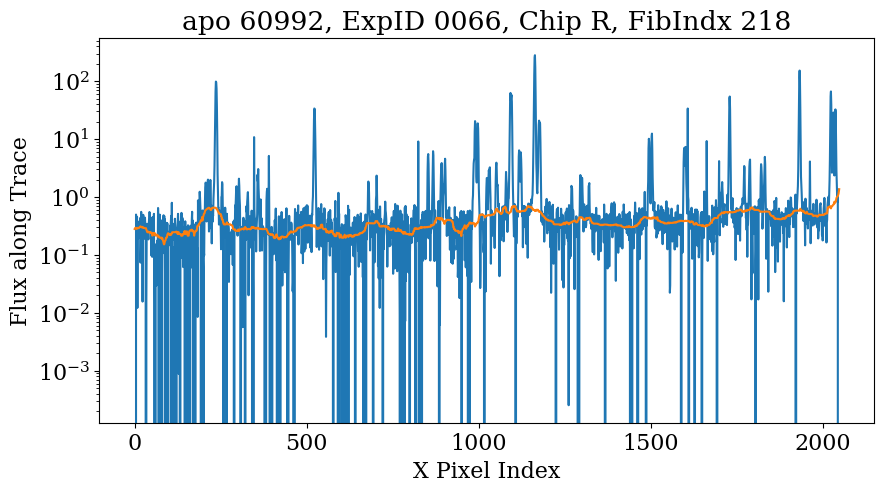

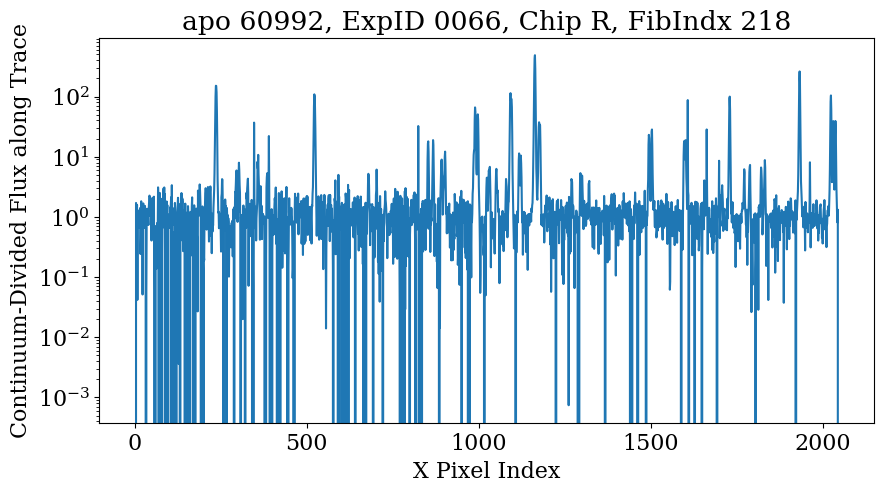

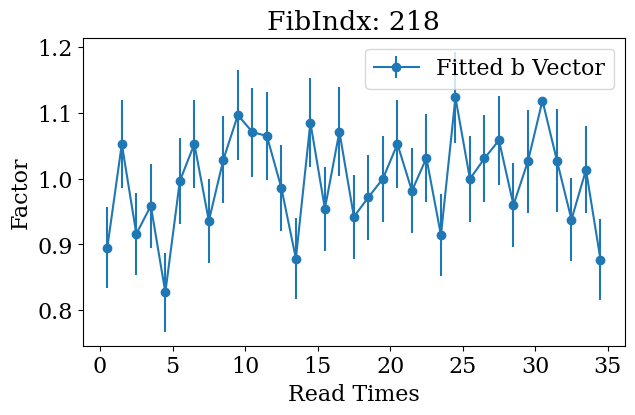

Current fiber index: 28
Current fiber type: sky
Current fiber median flux: 1.01


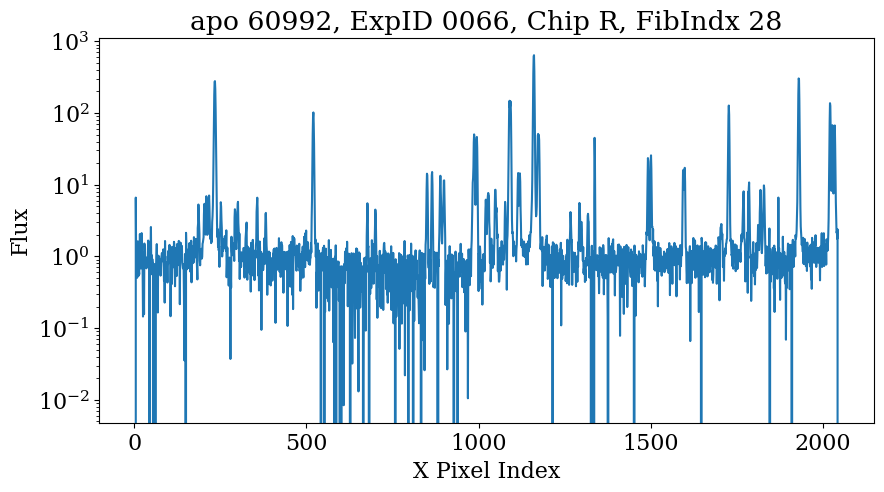

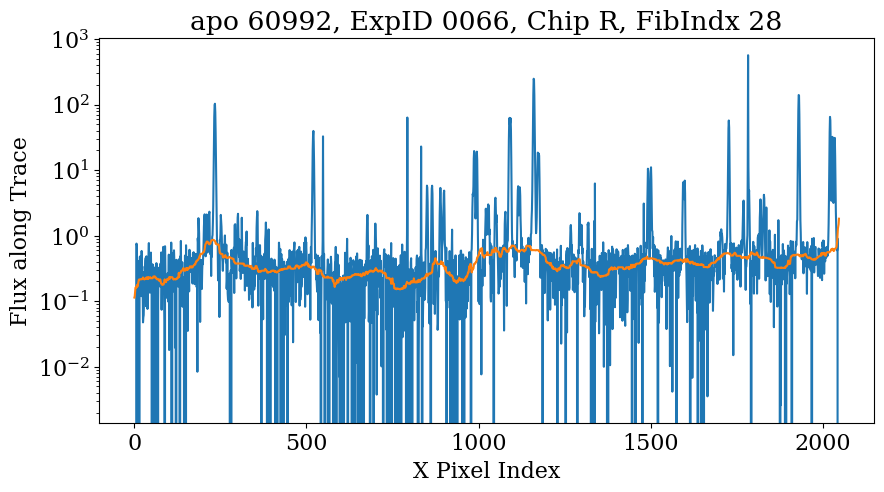

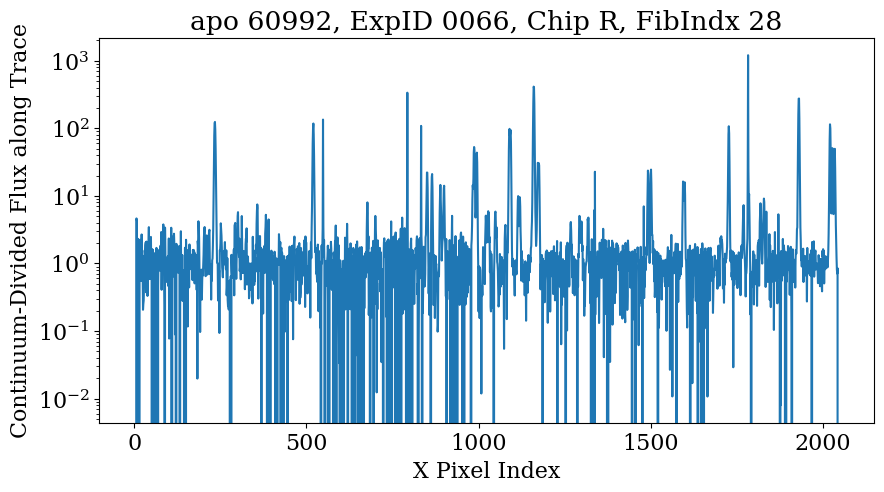

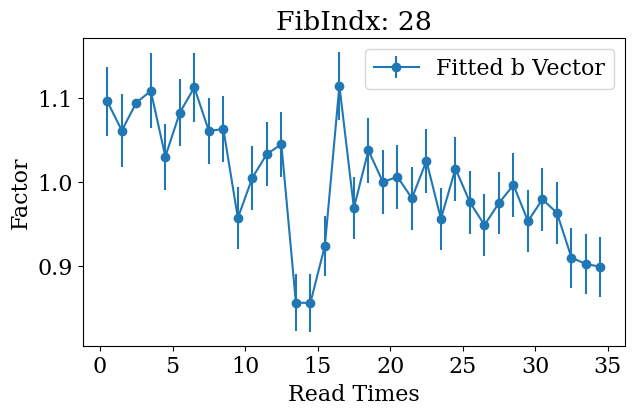

Current fiber index: 226
Current fiber type: sky
Current fiber median flux: 1.0


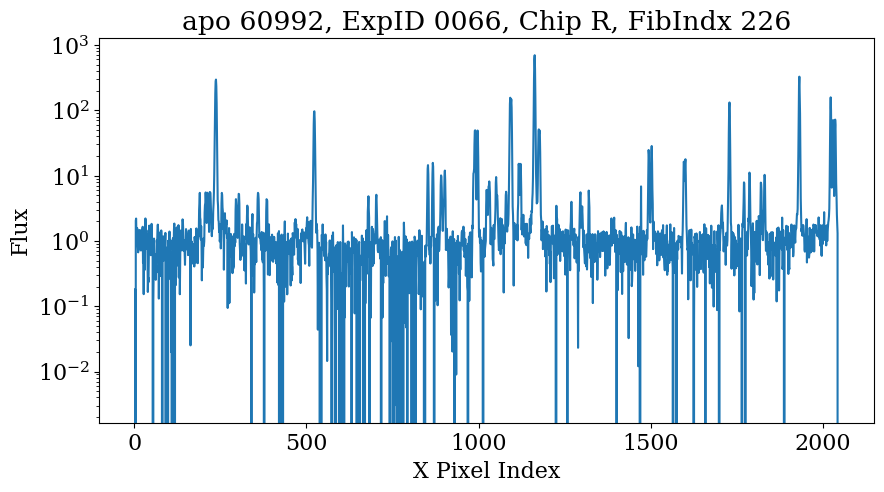

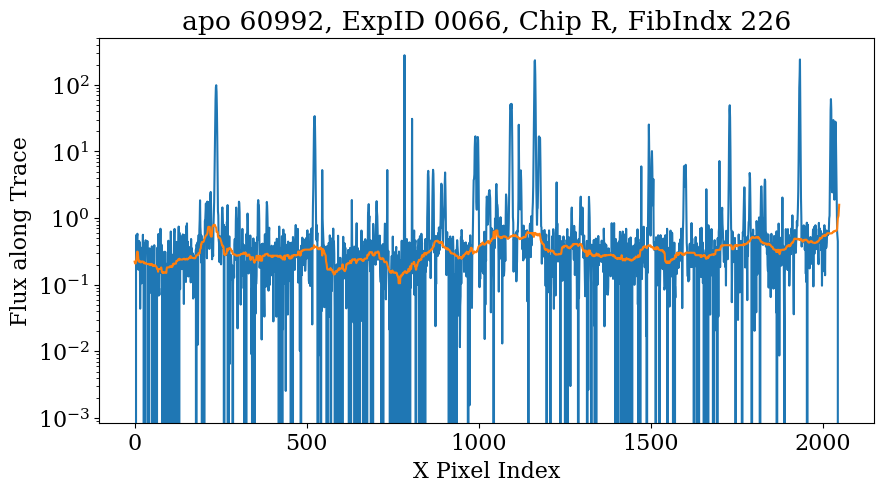

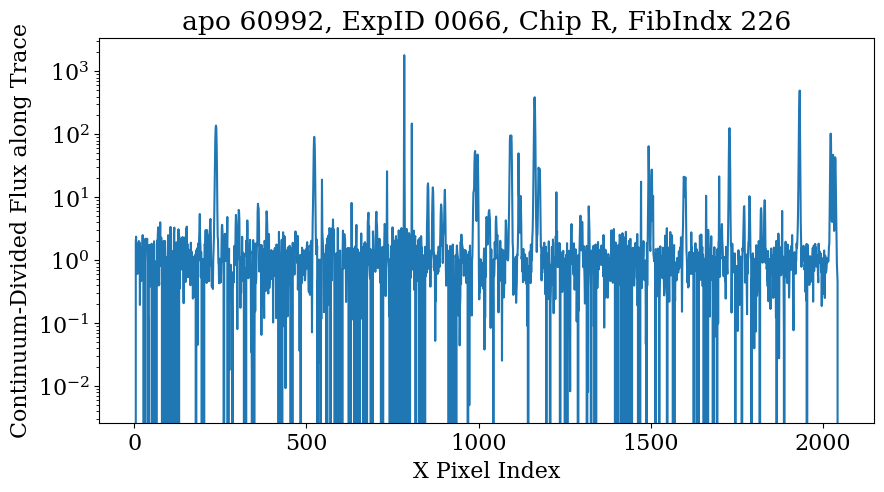

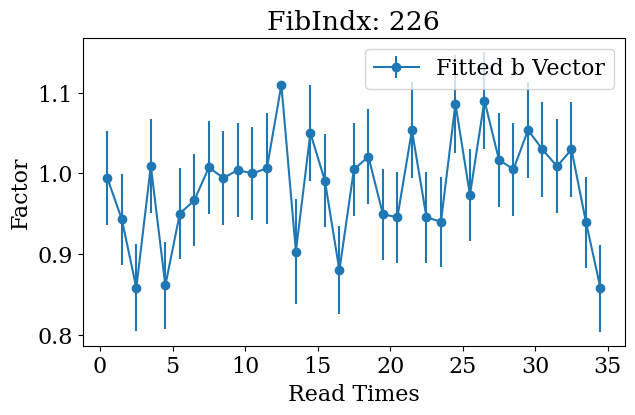

Current fiber index: 76
Current fiber type: sky
Current fiber median flux: 0.99


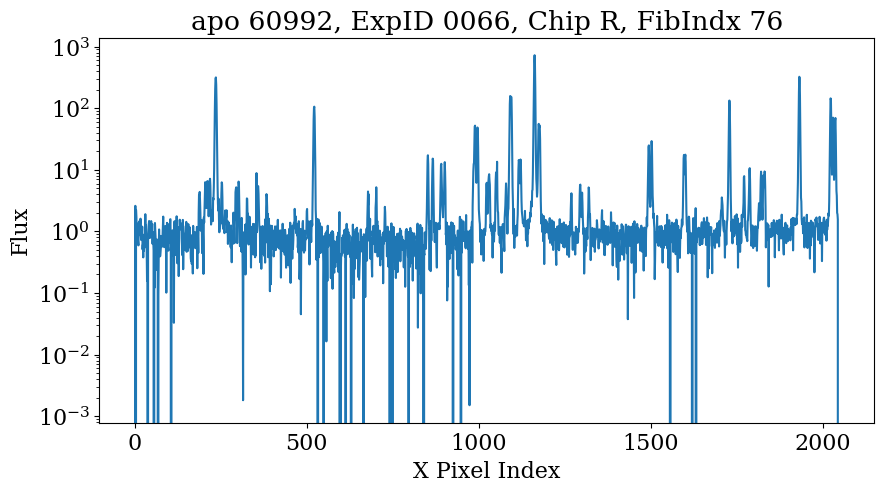

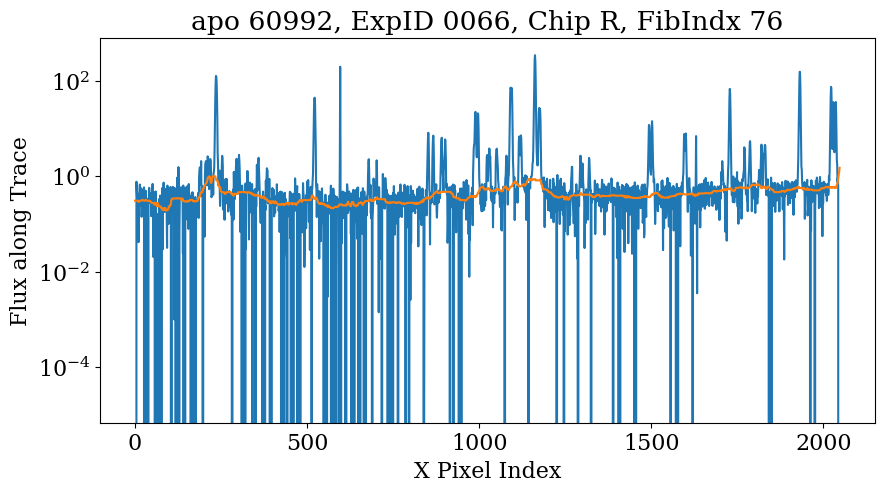

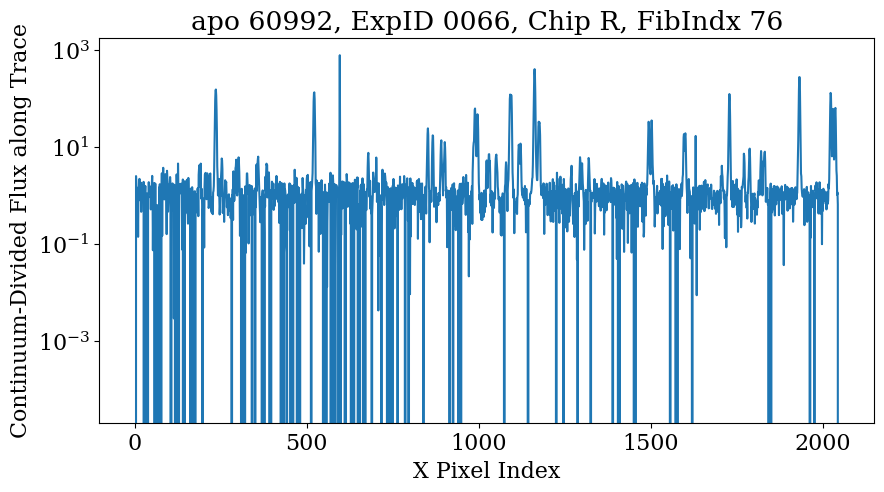

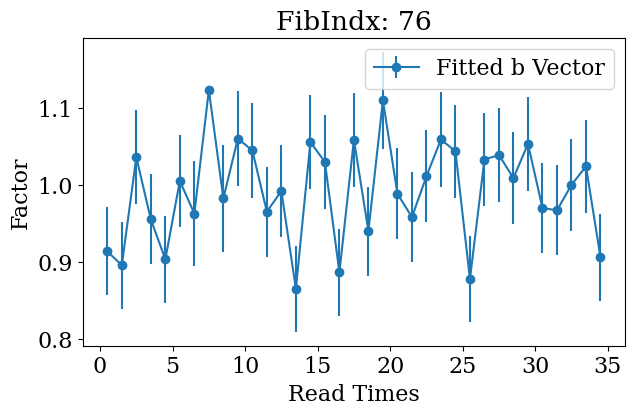

Current fiber index: 273
Current fiber type: sky
Current fiber median flux: 0.99


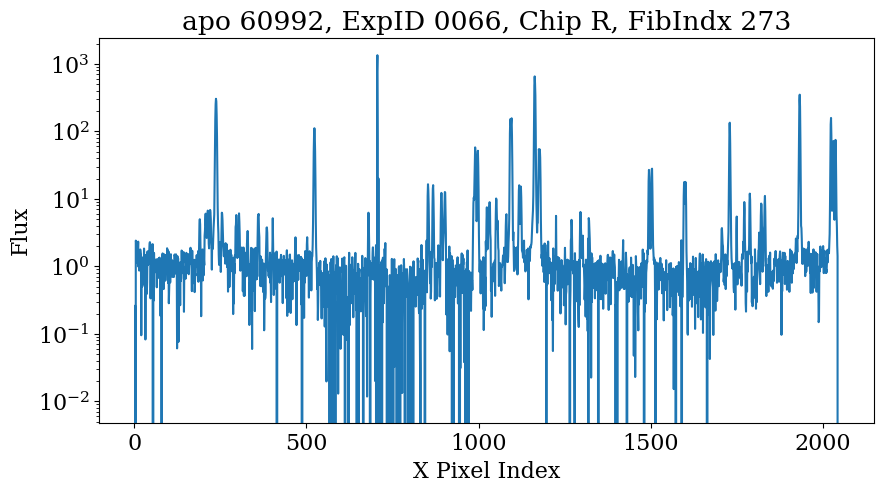

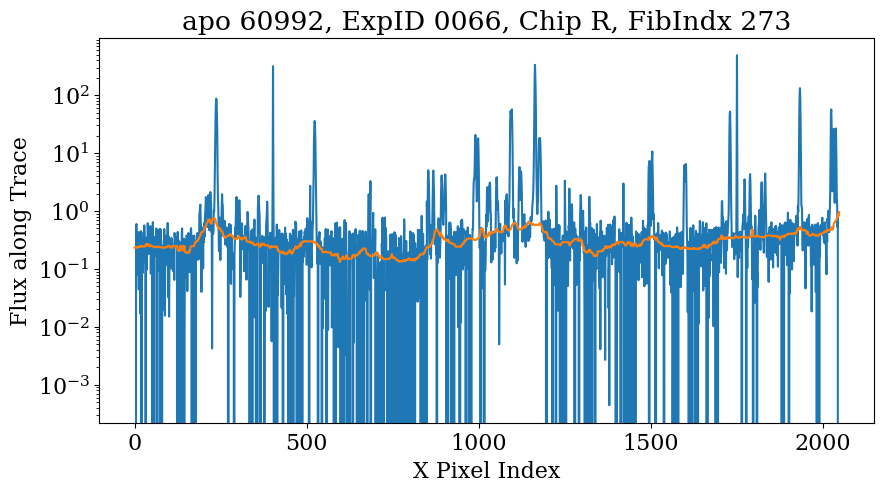

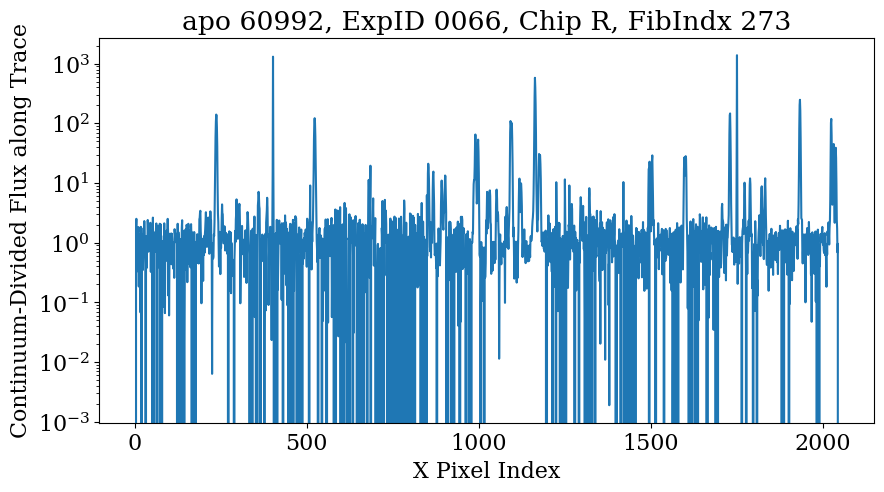

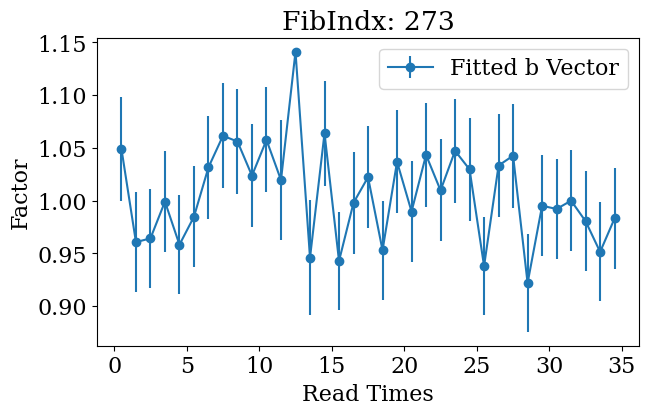

Current fiber index: 124
Current fiber type: sky
Current fiber median flux: 0.99


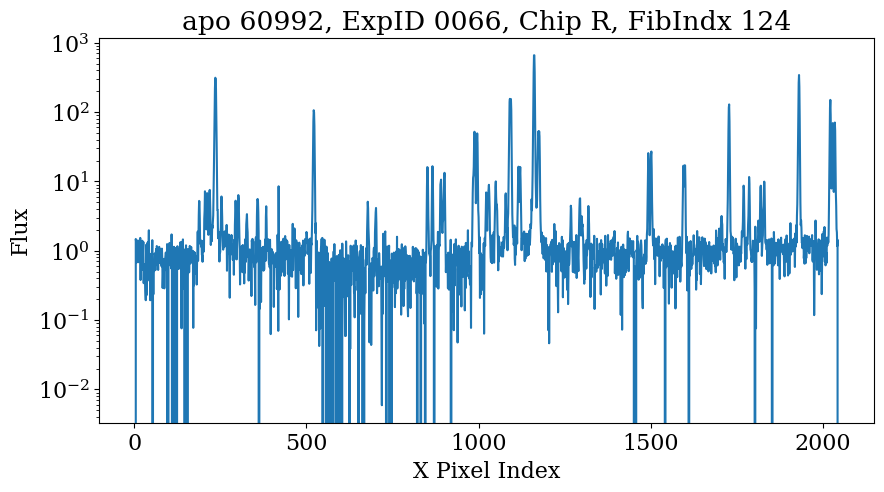

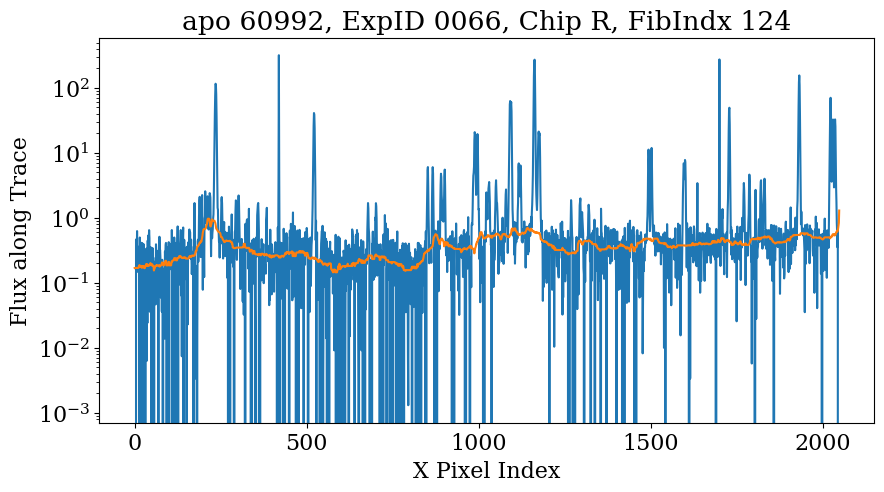

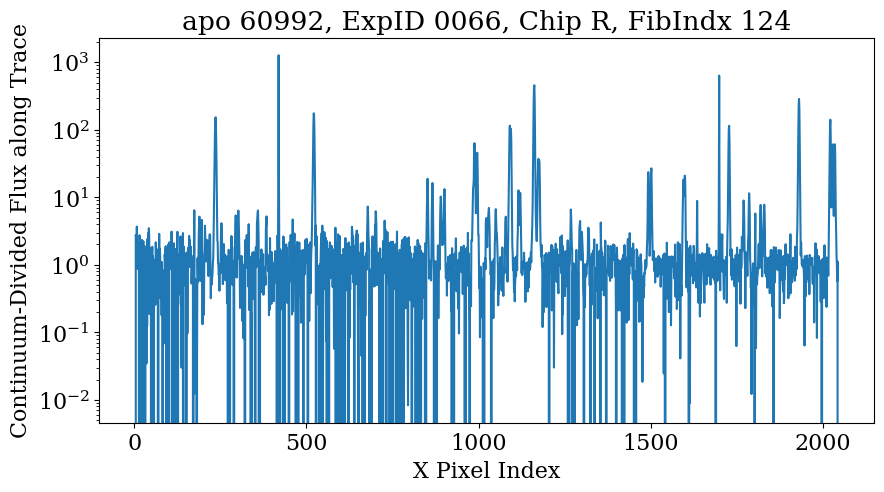

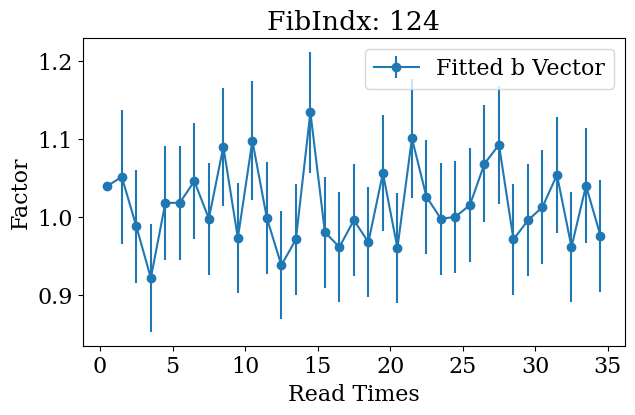

Current fiber index: 237
Current fiber type: sky
Current fiber median flux: 0.99


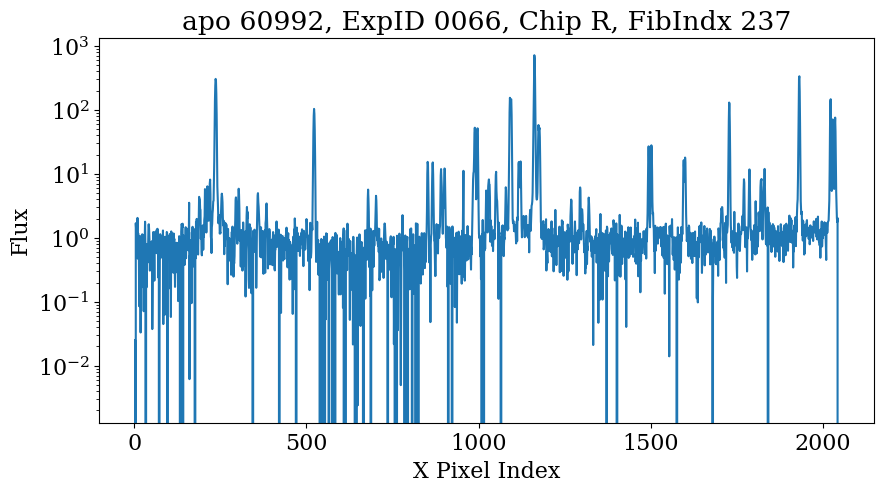

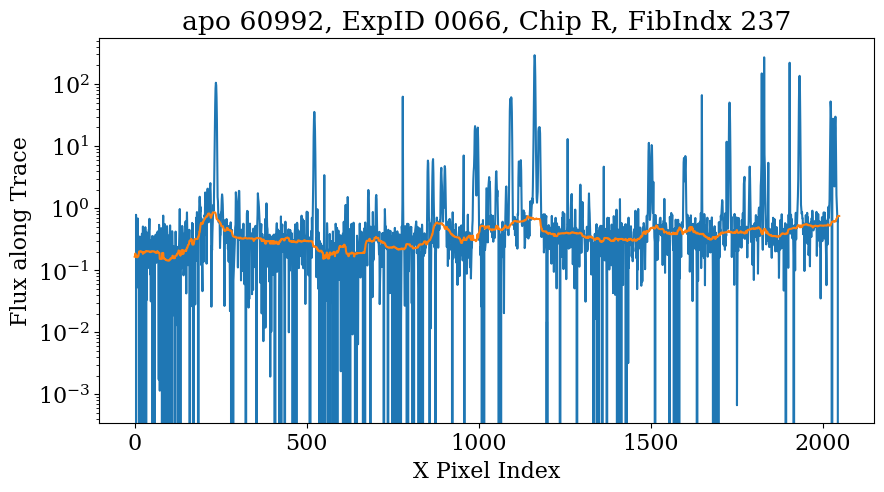

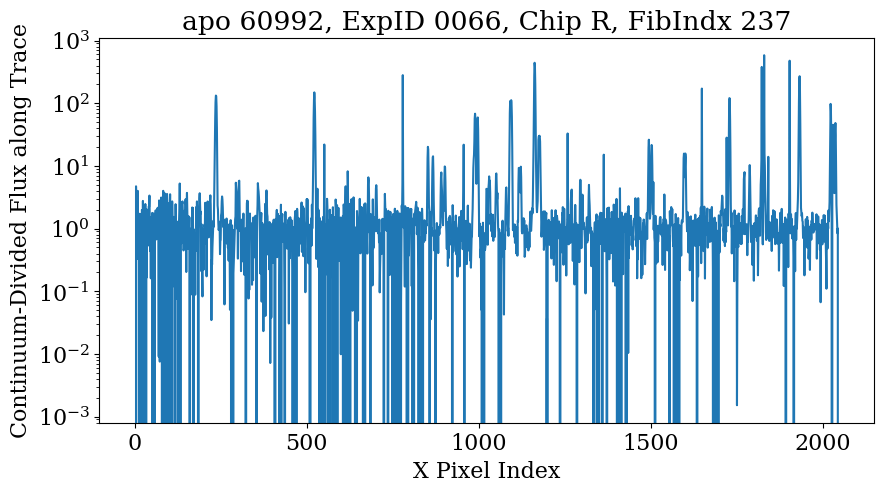

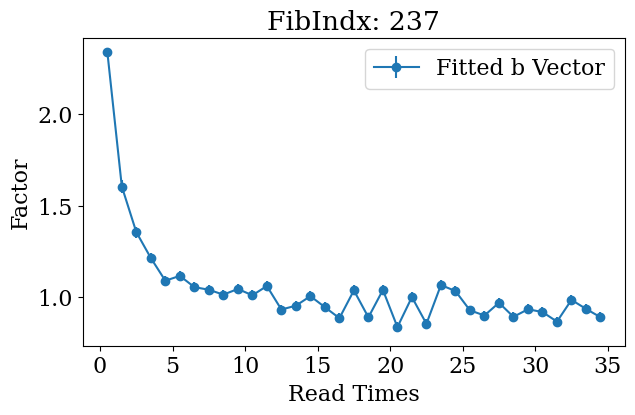

Current fiber index: 73
Current fiber type: sky
Current fiber median flux: 0.97


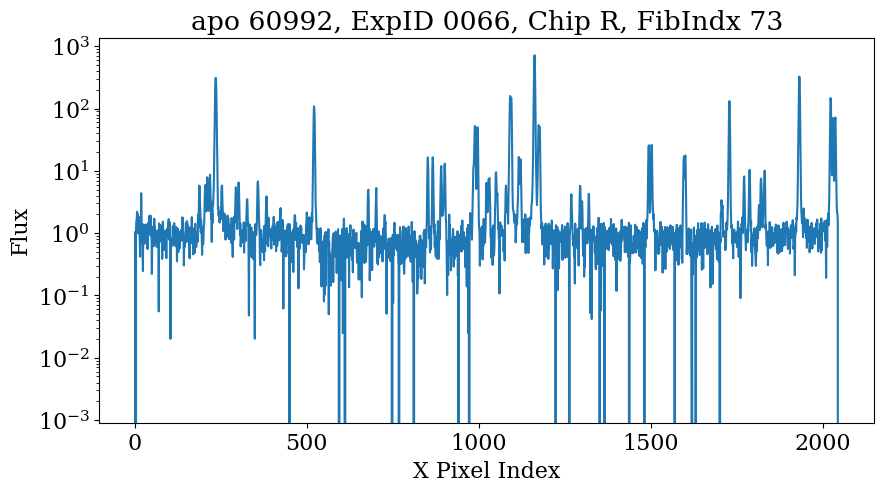

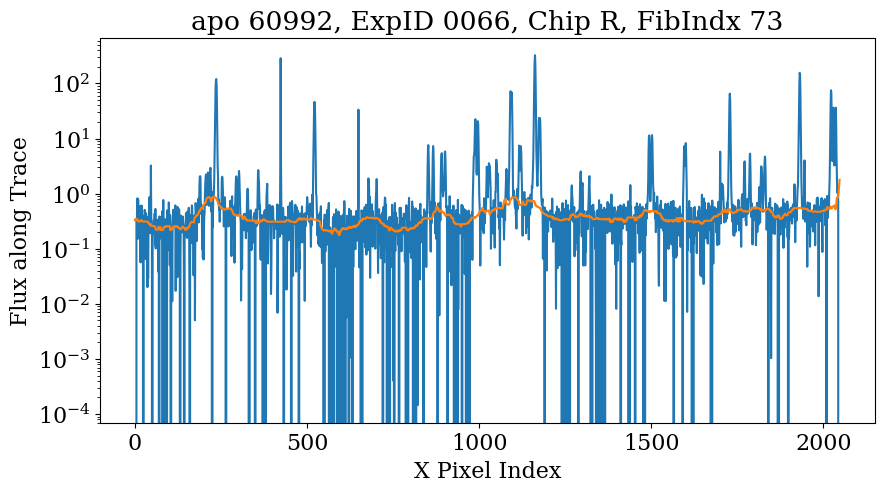

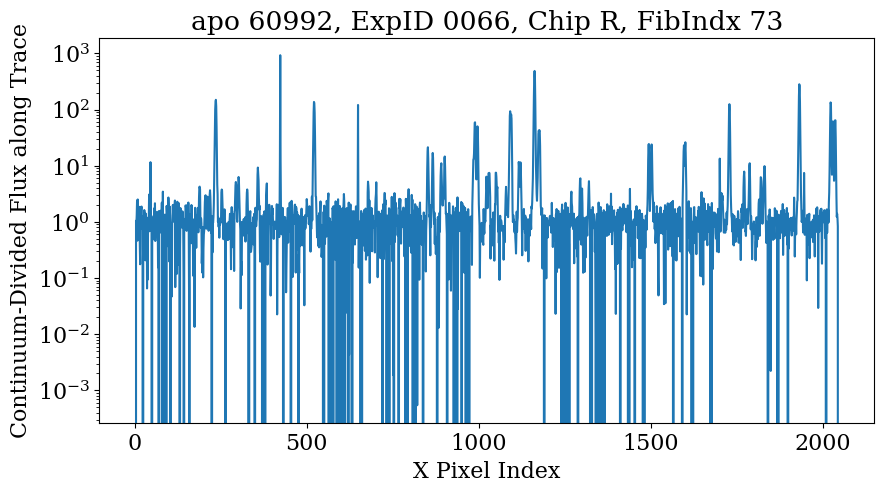

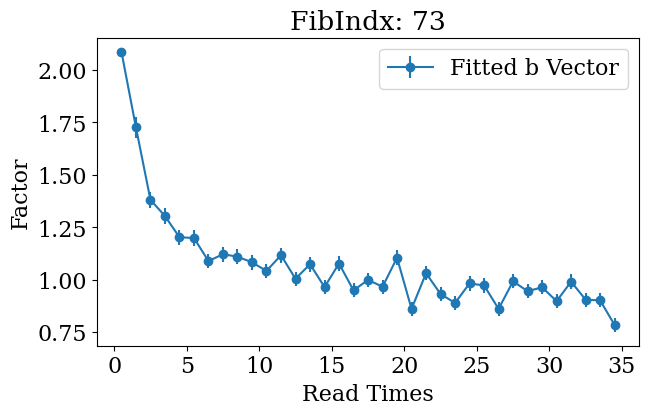

Current fiber index: 11
Current fiber type: sky
Current fiber median flux: 0.96


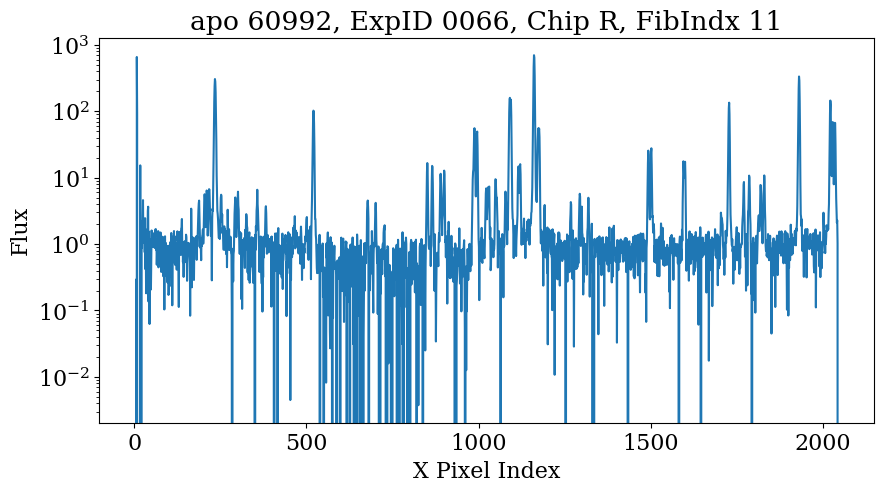

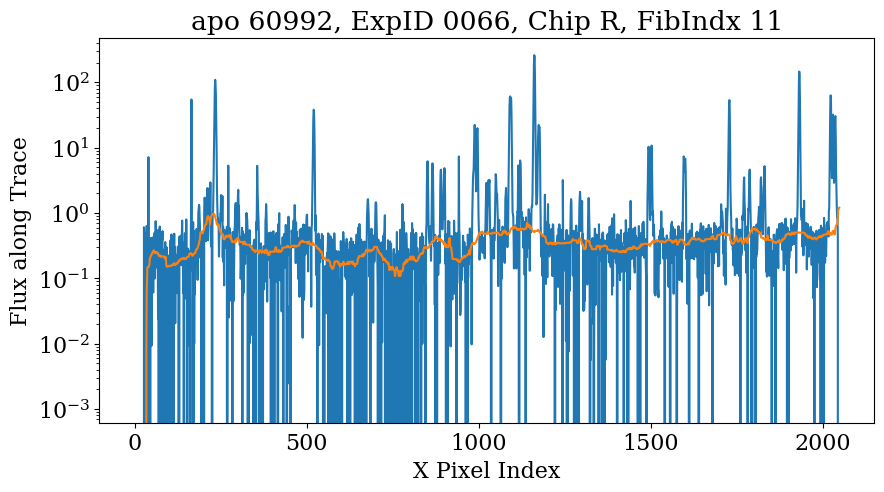

/var/folders/xs/flwfyss51t7d8vd8jhqz00xh0000gn/T/ipykernel_45858/3464525774.py:77: RuntimeWarning: divide by zero encountered in divide
  plt.plot(x_inds,pixel_best_fit_fluxes/med_cont)
/var/folders/xs/flwfyss51t7d8vd8jhqz00xh0000gn/T/ipykernel_45858/3464525774.py:77: RuntimeWarning: invalid value encountered in divide
  plt.plot(x_inds,pixel_best_fit_fluxes/med_cont)


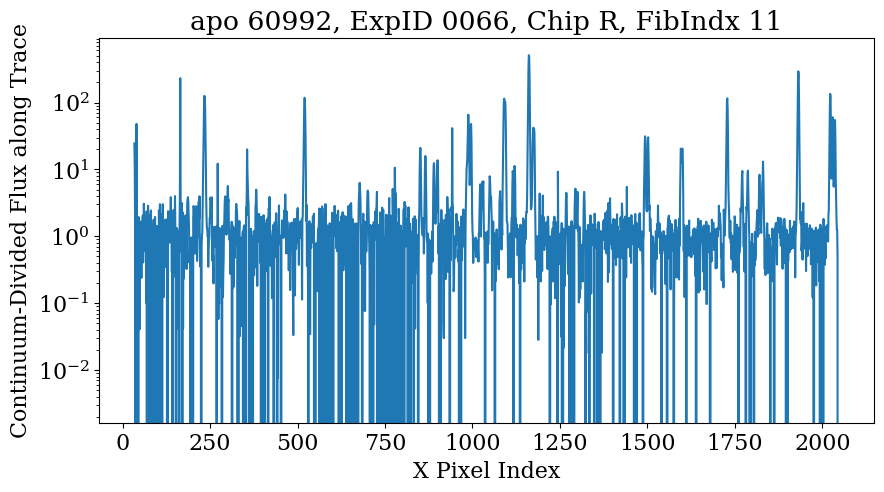

/var/folders/xs/flwfyss51t7d8vd8jhqz00xh0000gn/T/ipykernel_45858/3464525774.py:84: RuntimeWarning: divide by zero encountered in divide
  absorption_pixels = (cont_resid_sigmas < -10) & (pixel_best_fit_fluxes/med_cont < 0.95) & good_pix_data
/var/folders/xs/flwfyss51t7d8vd8jhqz00xh0000gn/T/ipykernel_45858/3464525774.py:84: RuntimeWarning: invalid value encountered in divide
  absorption_pixels = (cont_resid_sigmas < -10) & (pixel_best_fit_fluxes/med_cont < 0.95) & good_pix_data
/var/folders/xs/flwfyss51t7d8vd8jhqz00xh0000gn/T/ipykernel_45858/3464525774.py:88: RuntimeWarning: divide by zero encountered in divide
  skyline_pixels = (cont_resid_sigmas > 10) & (~absorption_pixels) & (pixel_best_fit_fluxes/med_cont > 1.05) & good_pix_data
/var/folders/xs/flwfyss51t7d8vd8jhqz00xh0000gn/T/ipykernel_45858/3464525774.py:88: RuntimeWarning: invalid value encountered in divide
  skyline_pixels = (cont_resid_sigmas > 10) & (~absorption_pixels) & (pixel_best_fit_fluxes/med_cont > 1.05) & good_pix_d

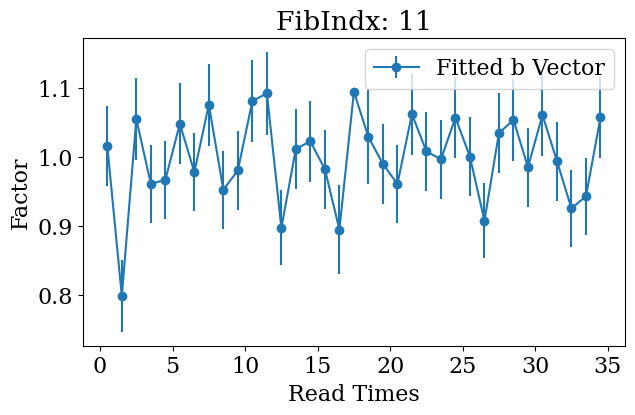

Current fiber index: 82
Current fiber type: sky
Current fiber median flux: 0.96


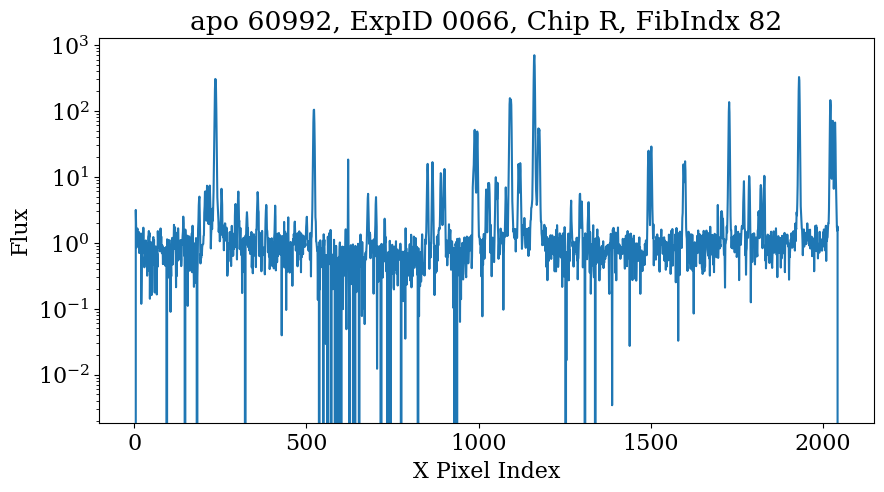

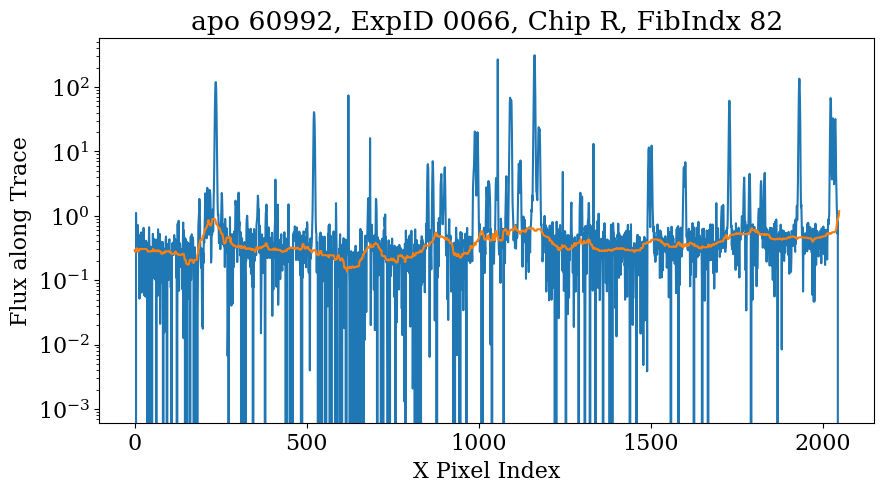

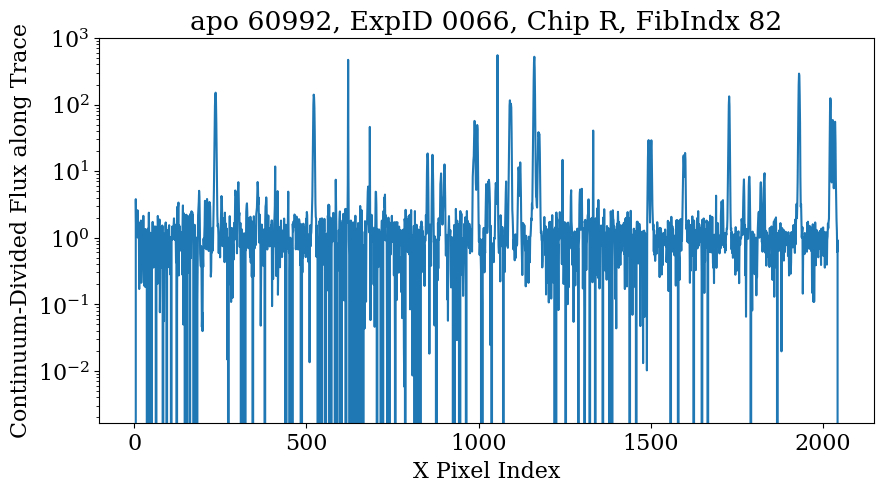

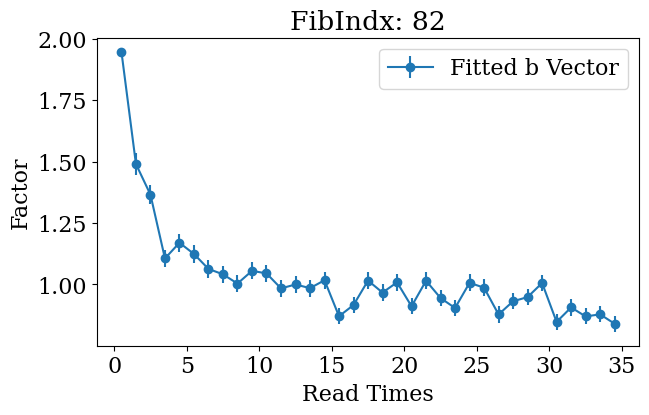

Current fiber index: 15
Current fiber type: sky
Current fiber median flux: 0.95


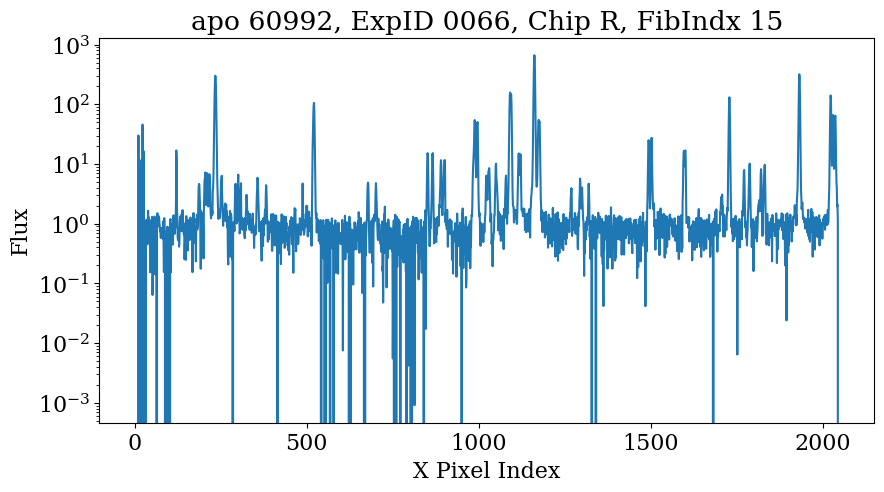

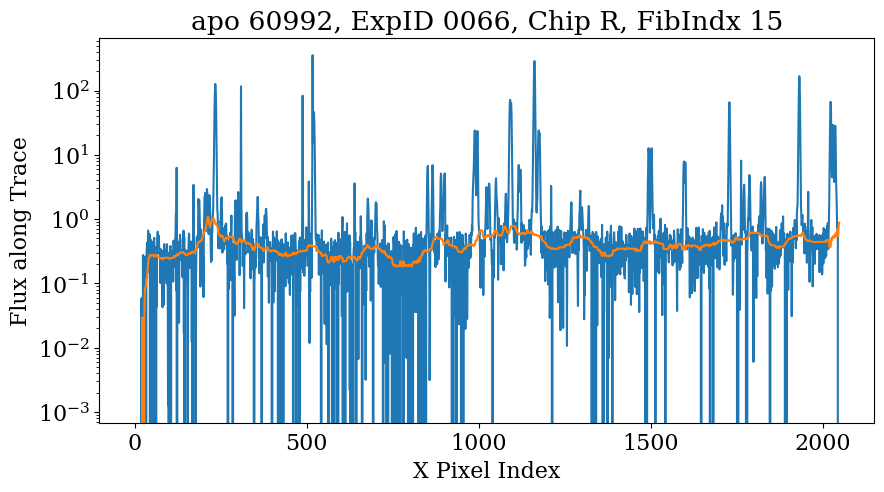

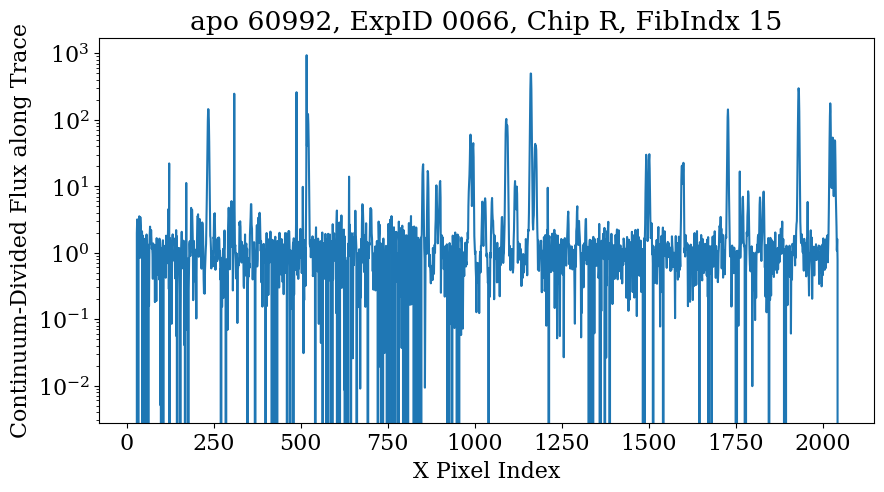

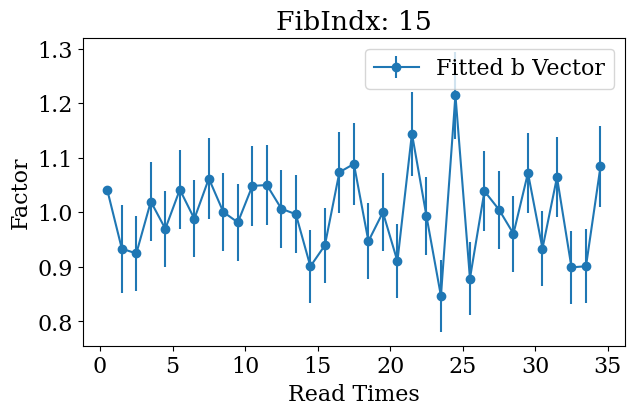

Current fiber index: 270
Current fiber type: sky
Current fiber median flux: 0.95


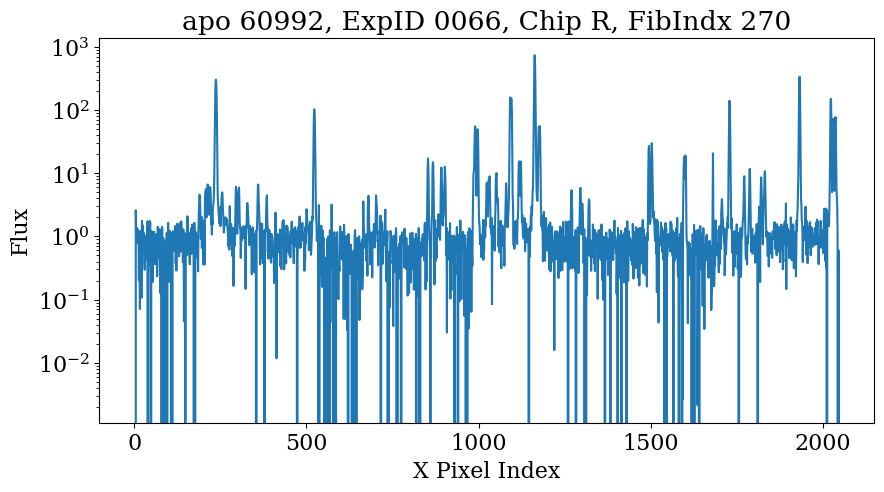

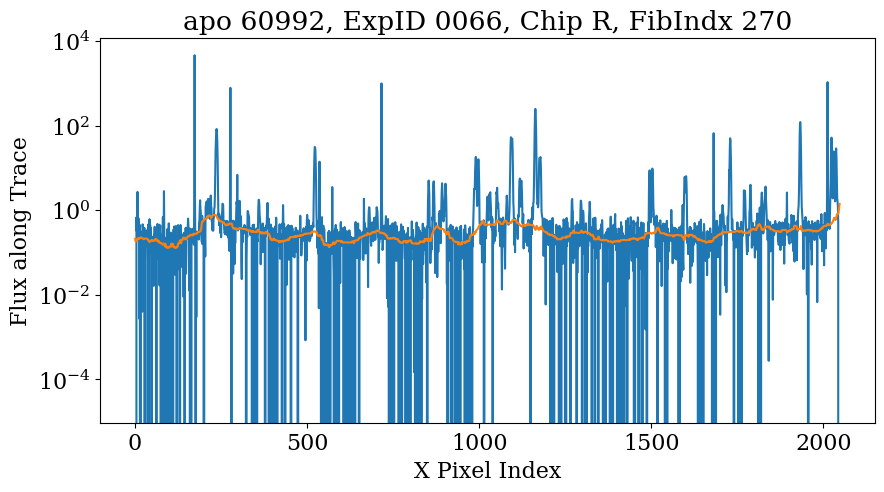

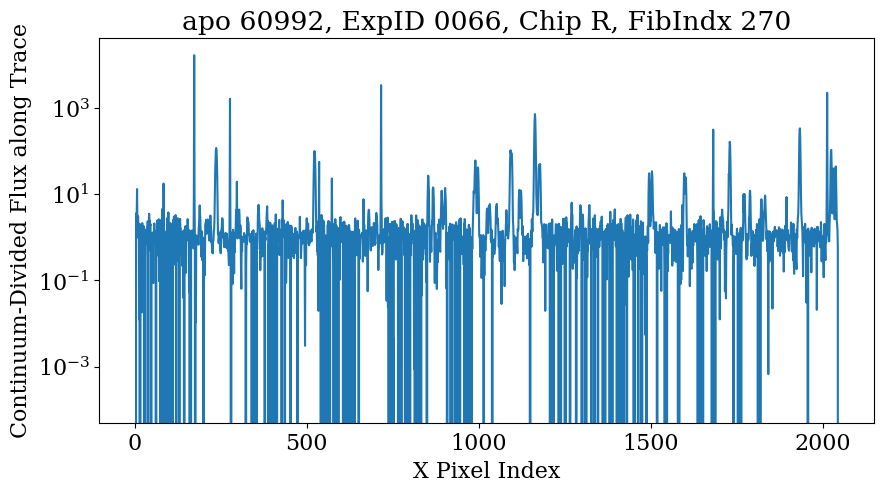

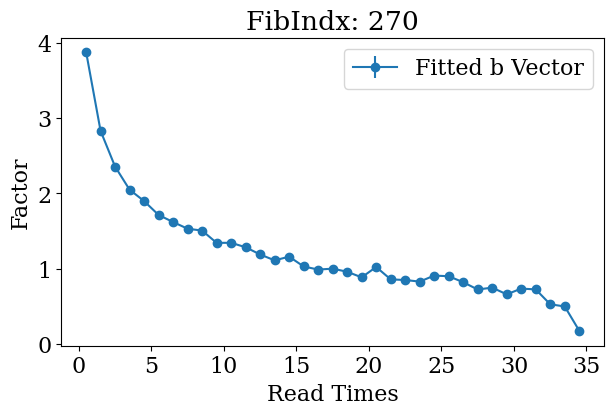

Current fiber index: 103
Current fiber type: sky
Current fiber median flux: 0.95


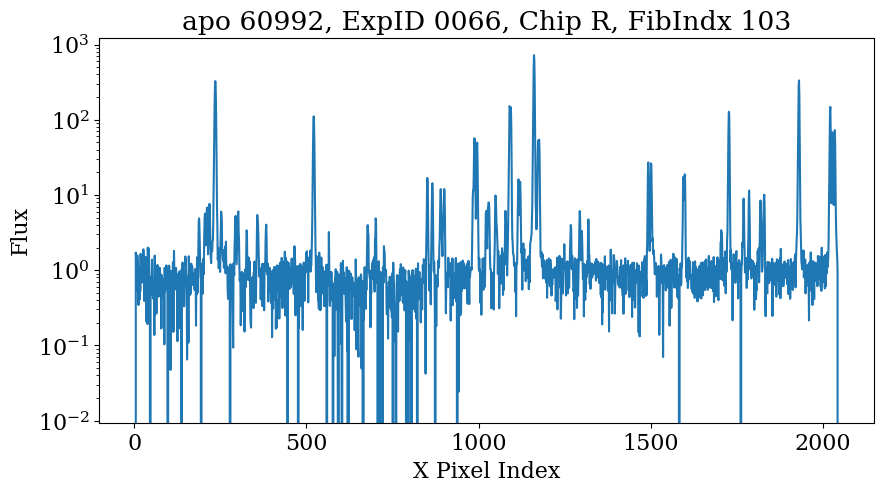

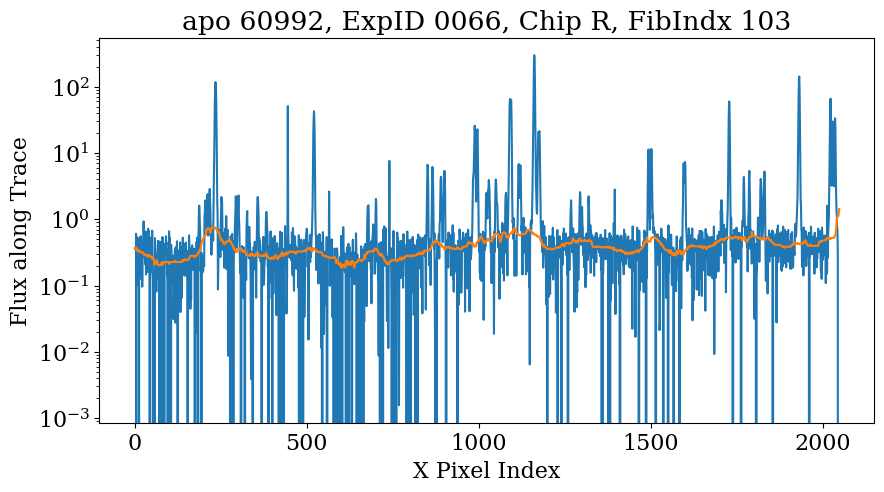

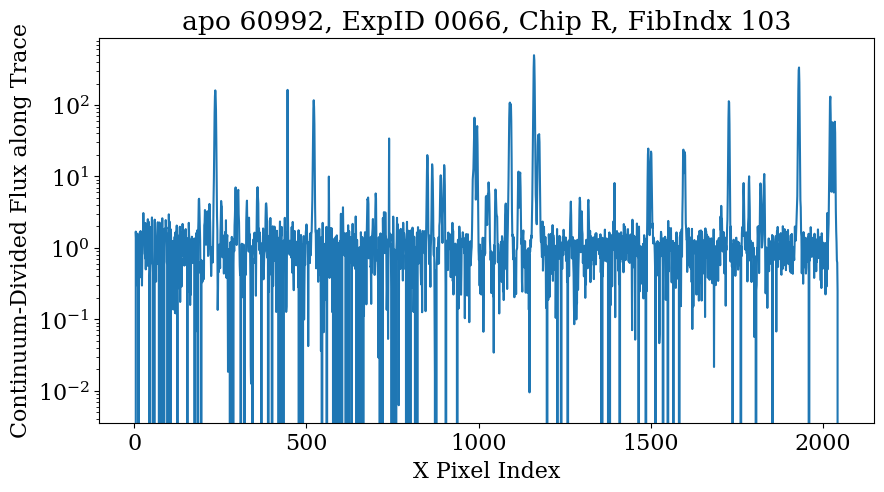

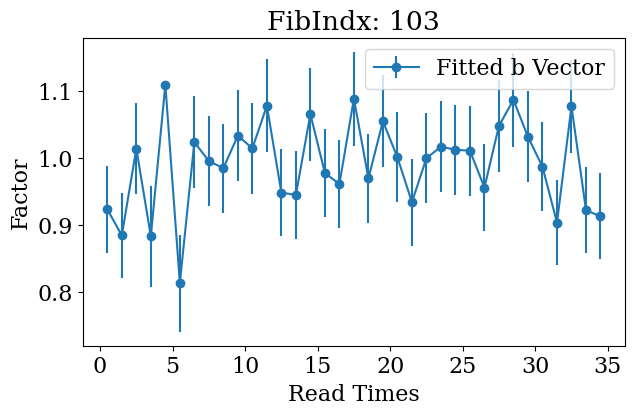

Current fiber index: 123
Current fiber type: sky
Current fiber median flux: 0.95


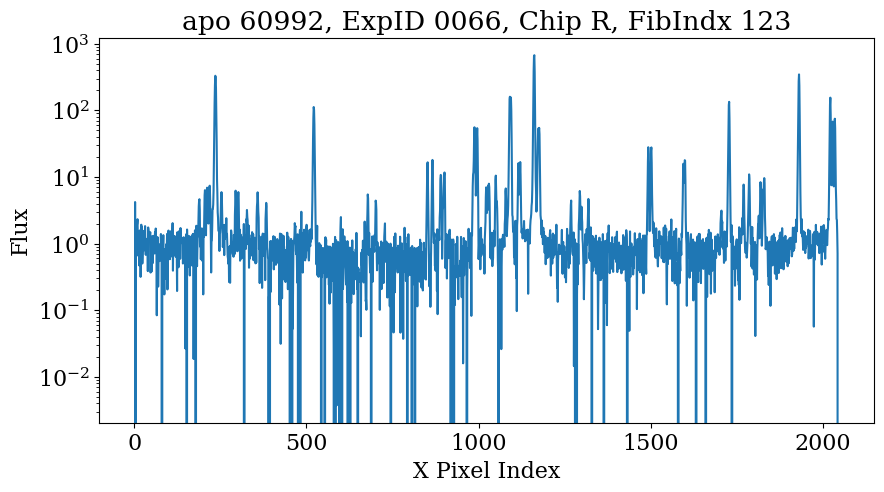

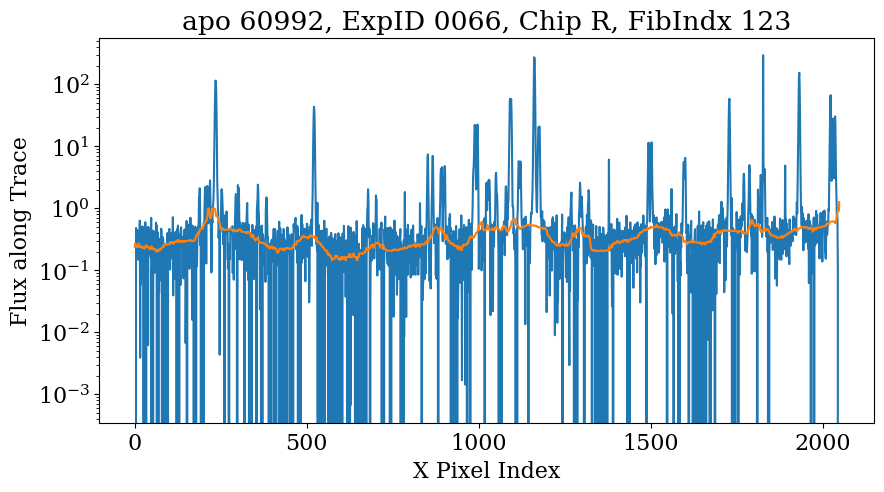

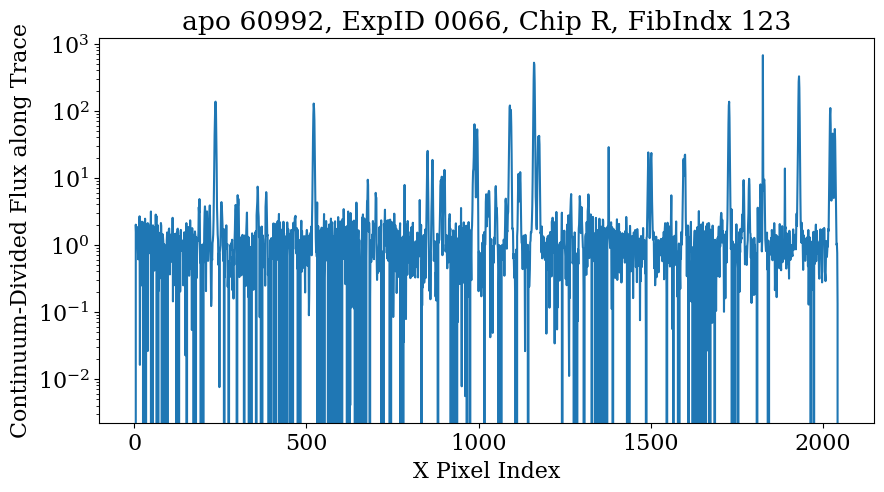

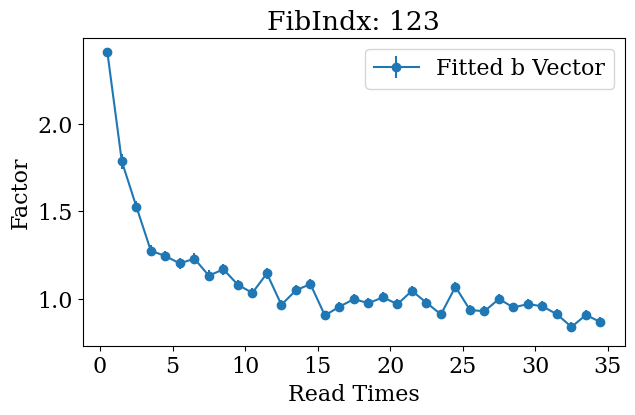

In [324]:
#sort the sci and tel fibers by median flux (decreasing from max)
# use_types = ((fiber_types == 'sci') | (fiber_types == 'tel'))
use_types = ((fiber_types == 'sky'))
use_types = use_types & (fiber_med_fluxes < 10)

good_explore_inds = np.where(use_types)[0][np.argsort(fiber_med_fluxes[use_types])[::-1]]
chosen_fib_ind = good_explore_inds[0]
chosen_fib_ind = good_explore_inds[2]

# good_explore_inds = good_explore_inds[10:20] #focus on top 10 bright fibers
good_explore_inds = good_explore_inds[:30]

fname_3d = f'{datapath}ar3Dcal_{tele}_{mjd}_{expid}_{chip}_{ftype}.h5'
data_3d = h5py.File(fname_3d)
print(data_3d.keys())

mjd_mid_exposure = np.array(data_3d['metadata']['mjd_mid_exposure_precise'])

result_dict = {}
for chosen_fib_ind in good_explore_inds:

    print(f'Current fiber index: {chosen_fib_ind}')
    print(f'Current fiber type: {fiber_types[chosen_fib_ind]}')
    print(f'Current fiber median flux: {round(fiber_med_fluxes[chosen_fib_ind],2)}')
    
    
    x_inds = np.arange(fiber_flux_1ds.shape[1])
    plt.figure(figsize=(10,5))
    plt.gca().set_yscale('log')
    plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    plt.plot(x_inds,fiber_flux_1ds[chosen_fib_ind])
    plt.xlabel('X Pixel Index')
    plt.ylabel('Flux')
    plt.show()


    chosen_trace_inds = np.round(fiber_trace_centers[chosen_fib_ind]).astype(int)
    
    pixel_best_fit_fluxes = np.array(data_3d['dimage'])[chosen_trace_inds,x_inds]
    pixel_best_fit_ivars = np.array(data_3d['ivarimage'])[chosen_trace_inds,x_inds]
    pixel_chisqimage = np.array(data_3d['chisqimage'])[chosen_trace_inds,x_inds]
    pixel_gainMat = np.array(data_3d['gainMat'])[chosen_trace_inds,x_inds]
    pixel_readVarMat = np.array(data_3d['readVarMat'])[chosen_trace_inds,x_inds] #(DN/read)^2
    pixel_raw_data = np.array(data_3d['outdat'])[:,chosen_trace_inds,x_inds]

    n_repeat = 2
    med_cont = np.zeros_like(pixel_best_fit_fluxes)
    med_window = 30 #number of pixels for smoothing
    
    keep_pixels = np.isfinite(pixel_best_fit_fluxes)
    
    for r_ind in range(n_repeat):
        for j in range(len(x_inds)):
            nearby_inds = np.where(keep_pixels & (np.abs(x_inds-x_inds[j]) < med_window))[0]
            med_cont[j] = np.nanmedian(pixel_best_fit_fluxes[nearby_inds])
        cont_resids = (pixel_best_fit_fluxes - med_cont)
        cont_resid_sigmas = cont_resids*np.sqrt(pixel_best_fit_ivars)
        
        # good_resids = (cont_resid_sigmas >= -100) & (cont_resid_sigmas <= 10)
        good_resids = (cont_resid_sigmas >= -10) & (cont_resid_sigmas <= 10)
        if np.all(good_resids == keep_pixels):
            break
        keep_pixels = good_resids

    plt.figure(figsize=(10,5))
    plt.gca().set_yscale('log')
    plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    plt.plot(x_inds,pixel_best_fit_fluxes)
    plt.plot(x_inds,med_cont)
    plt.xlabel('X Pixel Index')
    plt.ylabel('Flux along Trace')
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.gca().set_yscale('log')
    plt.title(f'{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    plt.plot(x_inds,pixel_best_fit_fluxes/med_cont)
    plt.xlabel('X Pixel Index')
    plt.ylabel('Continuum-Divided Flux along Trace')
    plt.show()

    good_pix_data = np.all(np.isfinite(pixel_raw_data),axis=0) & np.isfinite(pixel_gainMat) & np.isfinite(pixel_readVarMat)
    
    absorption_pixels = (cont_resid_sigmas < -10) & (pixel_best_fit_fluxes/med_cont < 0.95) & good_pix_data
    for pix_ind in np.where(absorption_pixels)[0]:
        absorption_pixels[np.abs(x_inds-pix_ind) < 3] = True
    absorption_pixels = absorption_pixels & np.isfinite(pixel_best_fit_fluxes) & good_pix_data
    skyline_pixels = (cont_resid_sigmas > 10) & (~absorption_pixels) & (pixel_best_fit_fluxes/med_cont > 1.05) & good_pix_data
    for pix_ind in np.where(skyline_pixels)[0]:
        skyline_pixels[np.abs(x_inds-pix_ind) < 3] = True
    skyline_pixels = skyline_pixels & np.isfinite(pixel_best_fit_fluxes) & good_pix_data
    
    continuum_pixels = np.isfinite(pixel_best_fit_fluxes) & (~absorption_pixels) & (~skyline_pixels) & good_pix_data
    
    
    absorption_plot_flux = np.zeros(len(pixel_best_fit_fluxes))*np.nan
    absorption_plot_flux[absorption_pixels] = (pixel_best_fit_fluxes/med_cont)[absorption_pixels]
    skyline_plot_flux = np.zeros(len(pixel_best_fit_fluxes))*np.nan
    skyline_plot_flux[skyline_pixels] = (pixel_best_fit_fluxes/med_cont)[skyline_pixels]
    continuum_plot_flux = np.zeros(len(pixel_best_fit_fluxes))*np.nan
    continuum_plot_flux[continuum_pixels] = (pixel_best_fit_fluxes/med_cont)[continuum_pixels]
    
    # plt.figure(figsize=(10,5))
    # plt.gca().set_yscale('log')
    # plt.title(f'Absorption Pixels (N = {np.sum(absorption_pixels)})\n{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    # plt.plot(x_inds,absorption_plot_flux)
    # plt.xlabel('X Pixel Index')
    # plt.ylabel('Continuum-Divided Flux along Trace')
    # plt.xlim(x_inds[0]-10,x_inds[-1]+10)
    # plt.show()
    
    # plt.figure(figsize=(10,5))
    # plt.gca().set_yscale('log')
    # plt.title(f'Skyline Pixels (N = {np.sum(skyline_pixels)})\n{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    # plt.plot(x_inds,skyline_plot_flux)
    # plt.xlabel('X Pixel Index')
    # plt.ylabel('Continuum-Divided Flux along Trace')
    # plt.xlim(x_inds[0]-10,x_inds[-1]+10)
    # plt.show()
    
    # plt.figure(figsize=(10,5))
    # plt.gca().set_yscale('log')
    # plt.title(f'Continuum Pixels (N = {np.sum(continuum_pixels)})\n{tele} {mjd}, ExpID {expid}, Chip {chip}, FibIndx {chosen_fib_ind}')
    # plt.plot(x_inds,continuum_plot_flux)
    # plt.xlabel('X Pixel Index')
    # plt.ylabel('Continuum-Divided Flux along Trace')
    # plt.xlim(x_inds[0]-10,x_inds[-1]+10)
    # plt.show()

    # use_pixel_inds = np.where(absorption_pixels)[0]
    # use_pixel_inds = np.where(continuum_pixels)[0]
    use_pixel_inds = np.where(skyline_pixels)[0]
    
    data_per_pix = pixel_raw_data.T * pixel_gainMat[:,None] #convert to electrons
    read_error_per_pix = np.sqrt(pixel_readVarMat) * pixel_gainMat #convert to electrons
    n_reads = data_3d['outdat'].shape[0]
    
    # np.random.seed(123)
    if len(use_pixel_inds) <= 100:
        use_pixels = use_pixel_inds
    else:
        use_pixels = np.random.choice(use_pixel_inds,100,replace=False)
    
    n_pixels = len(use_pixels)
    data_cube = data_per_pix[use_pixels]
    
    count_diffs = np.diff(data_cube,axis=1)
    
    
    obs_fluxes = np.copy(data_cube)
    read_errs = read_error_per_pix[use_pixels]
    
    
    max_b_ind,b_vect_mean,b_vect_Vinv,b_vect_V,\
            f_max_means_given_b,f_max_ivars_given_b,\
            comb_param_means,comb_param_Vinv,comb_param_V = fit_flux.measure_time_dep_fluxes_LINEAR(obs_fluxes,read_errs,
                                                           n_max_repeat=20,b_vect_change_tol=1e-10,
                                                           min_b_val=1e-10,min_f_val=1e-10)
    
    f_means_no_b,f_ivars_no_b,chi2s_data_no_b = fit_flux.fit_fluxes_optimal(obs_fluxes,read_errs,
                                                                               n_repeat=2,b_vect=None)
    f_means_with_b,f_ivars_with_b,chi2s_data_with_b = fit_flux.fit_fluxes_optimal(obs_fluxes,read_errs,
                                                                               n_repeat=2,b_vect=b_vect_mean)
    
    non_max_inds = np.ones(len(b_vect_mean)).astype(bool)
    non_max_inds[max_b_ind] = False
    non_max_inds = np.where(non_max_inds)[0]
    
    b_vect_errs = np.sqrt(np.diag(b_vect_V))
    f_max_errs_given_b = np.power(f_max_ivars_given_b,-0.5)
    
    b_vect_mean_linear = np.copy(b_vect_mean)
    b_vect_errs_linear = np.copy(b_vect_errs)
    b_vect_cov_linear = np.copy(b_vect_V)
    f_max_means = comb_param_means[:n_pixels]
    
    
    #rescaling average
     
    f_max_post = np.copy(f_max_means)
    b_vect_post = np.copy(b_vect_mean_linear)
    b_vect_post_cov = np.copy(b_vect_cov_linear)
    curr_f_post_guess = f_max_post[:, None] * b_vect_post[None, :]
    read_times = np.arange(n_reads)
    obs_flux_diffs = np.diff(obs_fluxes,axis=1)
    read_vars = np.power(read_errs,2)

    result_dict[chosen_fib_ind] = {
        'b_vect_post':b_vect_post,
        'b_vect_errs':b_vect_errs,
        'b_vect_post_cov':b_vect_post_cov,
    }
    
    plt.figure(figsize=(7, 4))
    plt.errorbar(read_times[:-1]+0.5,b_vect_post/np.nanmedian(b_vect_post),yerr=np.sqrt(np.diag(b_vect_post_cov/np.nanmedian(b_vect_post))),label= "Fitted b Vector",fmt = "-o")
    

    plt.title('FibIndx: %d'%chosen_fib_ind)
    plt.ylabel("Factor")
    plt.xlabel("Read Times")  
    plt.legend()
    plt.show()



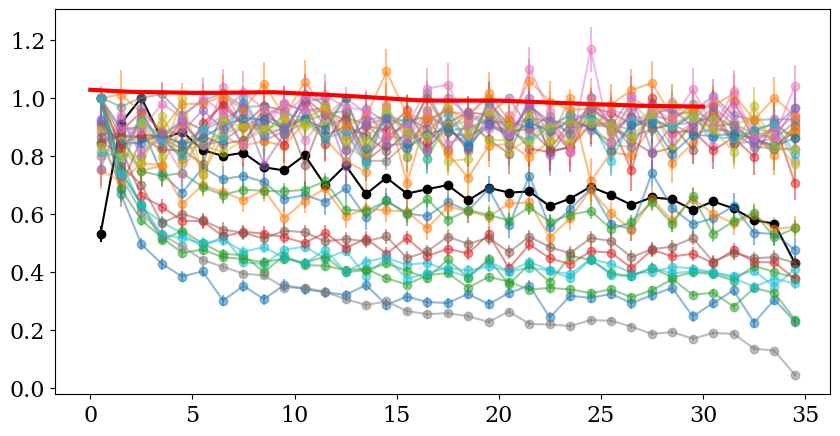

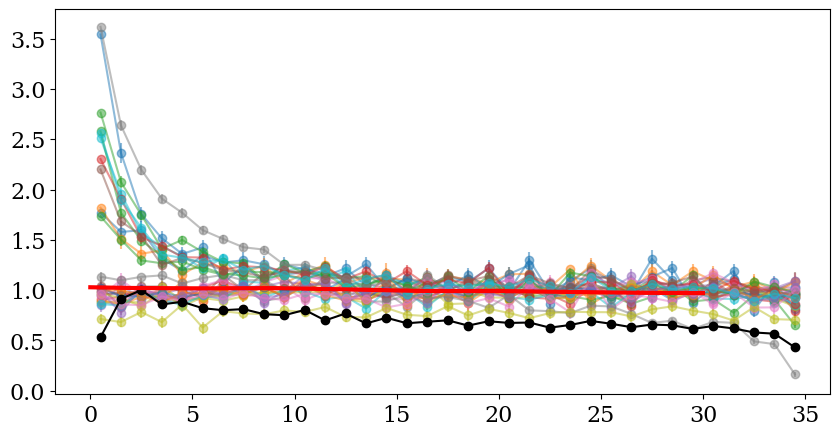

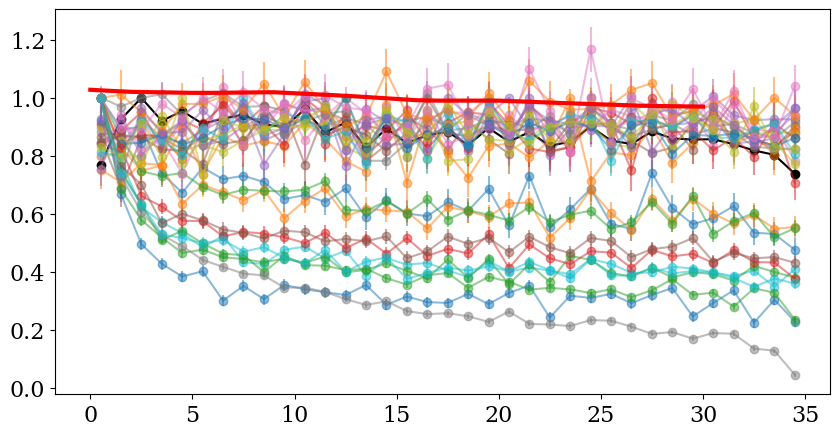

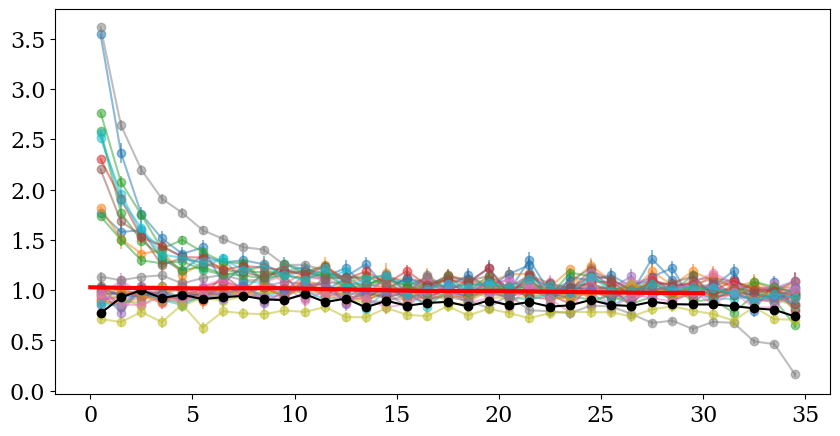

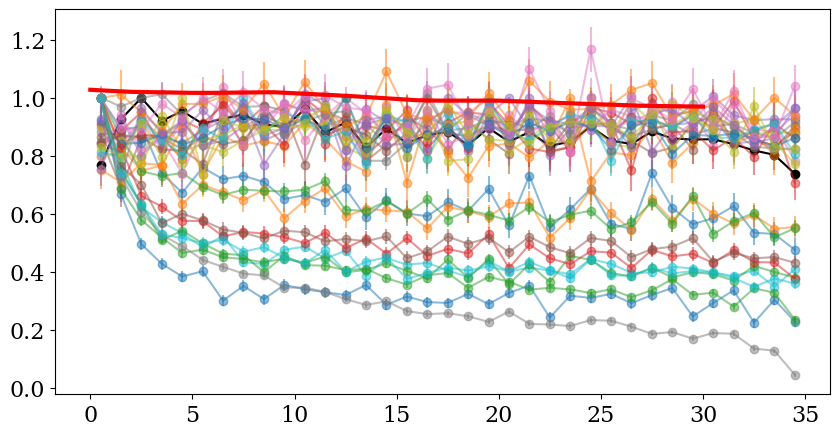

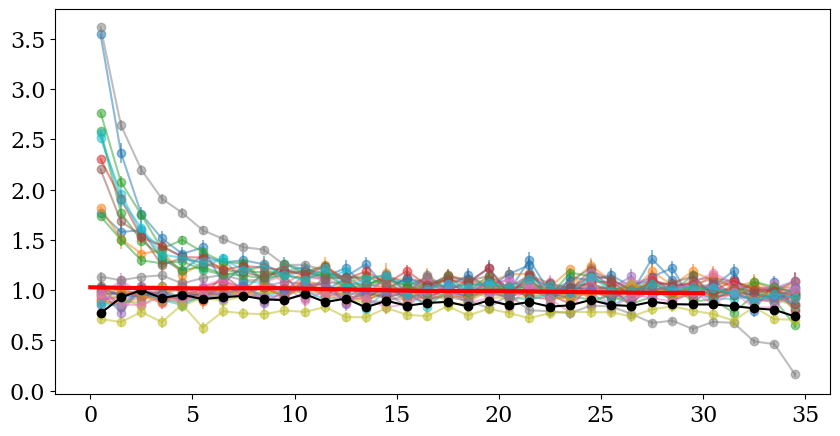

In [325]:
interp_flux_norms = np.interp(apogee_dts,guider_dts,_df.gfaBG,left=np.nan,right=np.nan)

key = list(result_dict.keys())[0]
all_b_vects = np.zeros((len(result_dict),len(result_dict[key]['b_vect_post'])))
all_b_vec_covs = np.zeros((len(result_dict),len(result_dict[key]['b_vect_post']),len(result_dict[key]['b_vect_post'])))
all_b_vect_scales = np.ones((len(result_dict)))

for r_ind in range(3):
    comb_inv_covs = np.zeros((len(result_dict[key]['b_vect_post']),len(result_dict[key]['b_vect_post'])))
    comb_inv_cov_dot_means = np.zeros(len(result_dict[key]['b_vect_post']))
    for key_ind,key in enumerate(result_dict.keys()):
        all_b_vects[key_ind] = result_dict[key]['b_vect_post']*all_b_vect_scales[key_ind]
        all_b_vec_covs[key_ind] = result_dict[key]['b_vect_post_cov']*all_b_vect_scales[key_ind]**2
        
        good_inds = np.where(np.isfinite(np.diag(all_b_vec_covs[key_ind])))[0]
        curr_inv_cov = np.linalg.inv(all_b_vec_covs[key_ind][good_inds][:,good_inds])
        for ind,good_ind in enumerate(good_inds):
            comb_inv_covs[good_ind,good_inds] += curr_inv_cov[ind]
        comb_inv_cov_dot_means[good_inds] += np.dot(curr_inv_cov,all_b_vects[key_ind][good_inds])
        
    good_inds = np.where(np.diag(comb_inv_covs) > 0)[0]
    comb_cov = np.linalg.inv(comb_inv_covs[good_inds][:,good_inds])
    
    comb_final_cov = np.diag(np.ones(len(result_dict[key]['b_vect_post']))*np.inf)
    comb_final_mean = np.ones(len(result_dict[key]['b_vect_post']))
    comb_final_mean[good_inds] = np.dot(comb_cov,comb_inv_cov_dot_means[good_inds])
    
    for ind,good_ind in enumerate(good_inds):
        comb_final_cov[good_ind,good_inds] = comb_cov[ind]
    
    comb_mean_scale = np.nanmax(comb_final_mean)
    # comb_mean_scale = np.nanmedian(comb_final_mean)
    comb_final_mean /= comb_mean_scale
    comb_final_cov /= comb_mean_scale**2
    
    for key_ind,key in enumerate(result_dict.keys()):
        # curr_comb_V = all_b_vec_covs[key_ind]+comb_final_cov
        # good_inds = np.where(np.isfinite(np.diag(curr_comb_V)))[0]
        # curr_comb_Vinv = np.linalg.inv(curr_comb_V[good_inds][:,good_inds])
    
        # mult_var = 1/np.dot(np.dot(all_b_vects[key_ind][good_inds],curr_comb_Vinv),all_b_vects[key_ind][good_inds])
        # mult_mean = 1/(mult_var * np.dot(np.dot(all_b_vects[key_ind][good_inds],curr_comb_Vinv),comb_final_mean[good_inds]))

        curr_comb_V = all_b_vec_covs[key_ind]
        good_inds = np.where(np.isfinite(np.diag(curr_comb_V)) & np.isfinite(interp_flux_norms)\
                             & (all_b_vects[key_ind] > 0))[0]
        curr_comb_Vinv = np.linalg.inv(curr_comb_V[good_inds][:,good_inds])
        
        mult_var = 1/np.dot(np.dot(all_b_vects[key_ind][good_inds],curr_comb_Vinv),all_b_vects[key_ind][good_inds])
        mult_mean = 1/(mult_var * np.dot(np.dot(all_b_vects[key_ind][good_inds],curr_comb_Vinv),interp_flux_norms[good_inds]))

        all_b_vect_scales[key_ind] *= 1/mult_mean
    
    plt.figure(figsize=(10,5))
    plt.errorbar(read_diff_times,comb_final_mean,yerr=np.sqrt(np.diag(comb_final_cov)),color='k',fmt='-o')
    for key_ind,key in enumerate(result_dict.keys()):
        # plt.plot(read_diff_times, result_dict[key]['b_vect_post'])
        plt.errorbar(read_diff_times, result_dict[key]['b_vect_post'], 
                    yerr=result_dict[key]['b_vect_errs'],
                    fmt='-o',alpha=alpha)
    plt.plot(interp_flux_norms,c='r',lw=3,zorder=1e10)
    plt.show()
    
    plt.figure(figsize=(10,5))
    for key_ind,key in enumerate(result_dict.keys()):
        # plt.plot(read_diff_times, result_dict[key]['b_vect_post'])
        plt.errorbar(read_diff_times, result_dict[key]['b_vect_post']*all_b_vect_scales[key_ind], 
                    yerr=result_dict[key]['b_vect_errs']*all_b_vect_scales[key_ind],
                    fmt='-o',alpha=alpha)
    plt.errorbar(read_diff_times,comb_final_mean,yerr=np.sqrt(np.diag(comb_final_cov)),color='k',fmt='-o')
    plt.plot(interp_flux_norms,c='r',lw=3,zorder=1e10)
    plt.show()
    
    


In [326]:
all_b_vect_scales

array([1.77139696, 1.81895451, 1.73366543, 1.0586017 , 1.10746283,
       1.20123541, 1.05417185, 1.04640297, 1.09980027, 2.50902128,
       3.54203643, 1.20495938, 2.76585945, 1.12313751, 1.13008075,
       1.12524429, 1.16946705, 1.13180499, 1.08302552, 1.05867385,
       1.11364834, 0.99150553, 2.57869879, 2.30283005, 1.06270625,
       2.19913179, 0.95610503, 3.6183385 , 0.85594468, 2.55894062])

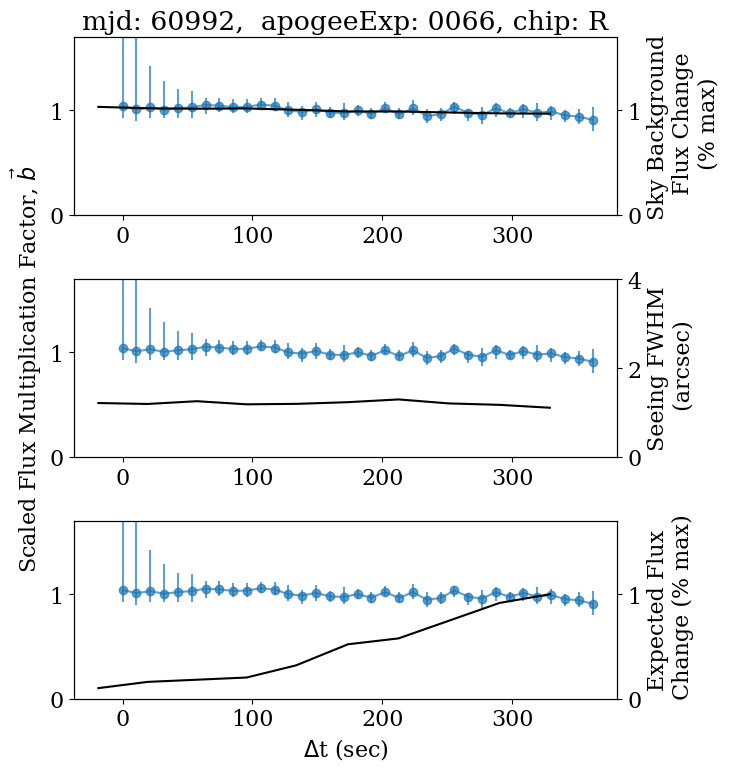

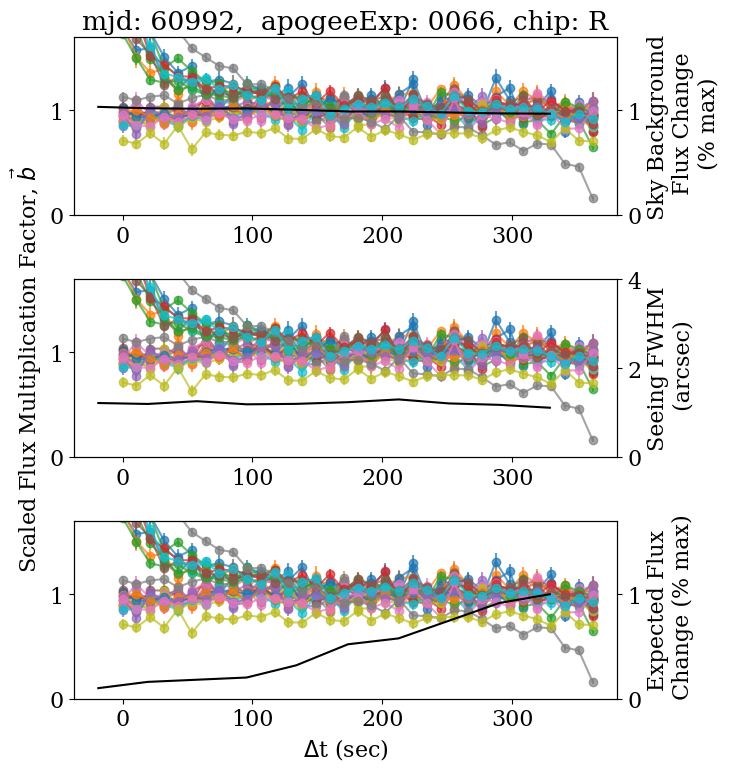

In [327]:
med_b = np.nanmedian(all_b_vects*all_b_vect_scales[:,None],axis=0)
med_b_scatter = np.nanpercentile(all_b_vects*all_b_vect_scales[:,None],[16,84],axis=0)

med_b = np.nanmedian(all_b_vects/np.nanmedian(all_b_vects,axis=1)[:,None],axis=0)
med_b_scatter = np.nanpercentile(all_b_vects/np.nanmedian(all_b_vects,axis=1)[:,None],[16,84],axis=0)

yrange = [0,1.7]

show_only_med = False
for show_only_med in [True,False]:
    if show_only_med:
        string_change = '_MED'
    else:
        string_change = ''
    
    
    fig, axs = plt.subplots(3, 1, figsize=(8,8))
    # sns.boxplot(x=_df.dt, y=_df.aperfluxNorm, ax=axs[0])
    
    
    guider_color = 'k'
    # guider_color = 'C0'
    alpha = 0.7
    
    # ax = axs[0].twinx()
    ax = axs[0]
    # ax.set_ylabel("Flux\n Multiplication\n Factor")
    if not show_only_med:
        for key_ind,key in enumerate(result_dict.keys()):
            # ax.plot(apogee_dts, result_dict[key]['b_vect_post'])
            scale = all_b_vect_scales[key_ind]
            # scale = 1/np.nanmedian(result_dict[key]['b_vect_post'])
            ax.errorbar(apogee_dts, result_dict[key]['b_vect_post']*scale, 
                        yerr=result_dict[key]['b_vect_errs']*scale,
                        fmt='-o',alpha=alpha)
    else:
        ax.scatter(apogee_dts, med_b, alpha=0)
        ylim = ax.get_ylim()
        ax.errorbar(apogee_dts, med_b, 
                    yerr=np.abs(med_b_scatter-med_b),
                    fmt='-o',alpha=alpha)
        ax.set_ylim(ylim)
    ax.set_ylim(yrange)
    curr_ylim = ax.get_ylim()
    # ax = axs[0]
    ax = axs[0].twinx()
    # ax.scatter(guider_dts, _df.transpNorm,alpha=0.1,color=guider_color)
    # ax.plot(unique_guider_times, guider_med_aperFlux[:,1],color=guider_color)
    # ax.fill_between(unique_guider_times, 
    #                     guider_med_aperFlux[:,0],
    #                     guider_med_aperFlux[:,2],
    #                     alpha=0.2,color=guider_color)
    ax.plot(guider_dts, _df.gfaBG,color=guider_color)
    # plt.errorbar(apogee_dts,comb_final_mean,yerr=np.sqrt(np.diag(comb_final_cov)),
    #              color='red',fmt='-o',alpha=1.0)
    
    ax.set_ylabel("Sky Background\n Flux Change\n (% max)")
    ax.set_ylim(curr_ylim)
    ax.set_xlabel("")
    ax.set_title("mjd: %d,  apogeeExp: %s, chip: %s"%(mjd, expid, chip))
    
    # ax = axs[1]
    ax = axs[1].twinx()
    ax.plot(guider_dts, _df.fwhm_fit,
                color=guider_color)
    ax.set_ylabel("Seeing FWHM\n (arcsec)")
    ax.set_ylim([0, 4])    
    # ax = axs[1].twinx()
    ax = axs[1]
    # ax.set_ylabel("Flux\n Multiplication\n Factor")
    ax.set_ylabel(r"Scaled Flux Multiplication Factor, $\vec b$")
    if not show_only_med:
        for key_ind,key in enumerate(result_dict.keys()):
            # ax.plot(apogee_dts, result_dict[key]['b_vect_post'])
            scale = all_b_vect_scales[key_ind]
            # scale = 1/np.nanmedian(result_dict[key]['b_vect_post'])
            ax.errorbar(apogee_dts, result_dict[key]['b_vect_post']*scale, 
                        yerr=result_dict[key]['b_vect_errs']*scale,
                        fmt='-o',alpha=alpha)
    else:
        ax.scatter(apogee_dts, med_b, alpha=0)
        ylim = ax.get_ylim()
        ax.errorbar(apogee_dts, med_b, 
                    yerr=np.abs(med_b_scatter-med_b),
                    fmt='-o',alpha=alpha)
        ax.set_ylim(ylim)
    ax.set_ylim(yrange)
    
    # ax = axs[2]
    ax = axs[2].twinx()
    # ax.plot(guider_dts, _df.guideErr,
    #             color=guider_color)
    # ax.set_ylabel("Guide Error\n (arcsec)")
    ax.plot(guider_dts, _df.fluxNorm,color=guider_color)
    ax.set_ylabel("Expected Flux\n Change (% max)")
    ax.set_ylim(curr_ylim)
    # ax.set_ylim([0, 0.5])
    # ax = axs[2].twinx()
    ax = axs[2]
    # ax.set_ylabel("Flux\n Multiplication\n Factor")
    if not show_only_med:
        for key_ind,key in enumerate(result_dict.keys()):
            # ax.plot(apogee_dts, result_dict[key]['b_vect_post'])
            scale = all_b_vect_scales[key_ind]
            # scale = 1/np.nanmedian(result_dict[key]['b_vect_post'])
            ax.errorbar(apogee_dts, result_dict[key]['b_vect_post']*scale, 
                        yerr=result_dict[key]['b_vect_errs']*scale,
                        fmt='-o',alpha=alpha)
    else:
        ax.scatter(apogee_dts, med_b, alpha=0)
        ylim = ax.get_ylim()
        ax.errorbar(apogee_dts, med_b, 
                    yerr=np.abs(med_b_scatter-med_b),
                    fmt='-o',alpha=alpha)
        ax.set_ylim(ylim)
    ax.set_ylim(yrange)
    axs[2].set_xlabel(r"$\Delta$t (sec)")
    
    plt.tight_layout()
    plt.savefig(f'{plotpath}guiderComp_{tele}_mjd{mjd}_expID{expid}_chip{chip}_SKY{string_change}.png')
    plt.show()
    
